# Bank Personal Loan Modelling

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a customer take/apply for personal loan or not given the relevent parameters


### Context :

This case is about a bank (Thera Bank) which has a growing customer base. Majority of these customers are liability customers (depositors) with varying size of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors). A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns to better target marketing to increase the success ratio with a minimal budget.

The department wants to build a model that will help them identify the potential customers who have a higher probability of purchasing the loan. This will increase the success ratio while at the same time reduce the cost of the campaign.

### 2.Data collection

#### The dataset is taken from Kaggle 
https://www.kaggle.com/datasets/itsmesunil/bank-loan-modelling

In [14]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Test split

#### It's a very good practice to split the data into train test sets as soon as you get the data to avoid overfitting of the model and data leakage.

#### Remember that you want to use the test set only at the very end of your project, once you have a classifier that you are ready to launch

In [15]:
# Load the data

df = pd.read_csv('../Data/Bank_Prsonal_Loan_signup_modelling/Bank_Personal_Loan_Modelling.csv')

In [16]:
df

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [17]:
df.shape

(5000, 14)

In [18]:
# From the initial observations we can drop ['ID'] 
# because this feature wont be having any predictive power over the target('Personal_Loan') variable

In [19]:
df.drop(['ID'],axis = 1,inplace=True)

In [20]:
# Renaming the 'Personal_Loan' feature to 'target' for the ease

df.rename(columns = {'Personal_Loan':'target'}, inplace = True)

In [21]:
df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

In [22]:
df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
4997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
4998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [23]:
# sampling 500 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=500,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=500,random_state=5)
train_df = new_df.drop(val_df.index)

In [24]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [25]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


total_train_df

In [26]:
val_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,58,32,65,90266,3,2.20,3,0,0,0,0,0,0
1,55,29,79,92373,3,0.80,1,0,0,0,0,1,1
2,51,27,62,94063,2,3.20,3,118,0,0,0,0,1
3,39,15,62,93955,3,2.33,1,131,0,0,1,1,1
4,31,5,18,94111,4,0.30,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,40,14,74,90245,4,1.40,2,0,0,0,0,1,0
496,28,4,88,94024,1,5.40,1,0,0,0,0,1,0
497,52,26,158,94920,2,3.70,3,251,1,0,0,0,1
498,37,11,69,91911,3,2.10,1,0,0,1,0,0,0


In [27]:
test_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,46,20,158,90064,1,2.4,1,0,0,0,0,1,1
1,60,35,8,94143,1,0.1,1,0,0,0,0,1,0
2,54,28,159,90245,2,0.5,1,461,0,0,0,1,0
3,44,19,61,94080,3,2.7,2,0,0,0,0,0,0
4,53,28,31,90245,4,0.1,3,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
496,32,8,78,90401,4,0.1,2,0,0,0,0,1,0
497,63,39,72,93106,3,2.0,3,190,0,1,0,1,0
498,27,2,45,94305,2,1.7,2,0,0,0,0,0,1


### 4.Explore the data/try to get a sense of the data

In [28]:
# prints the first 5 rows/records

train_df.head()

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0


In [29]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(4000, 13)

In [30]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 4000 non-null   int64  
 1   Experience          4000 non-null   int64  
 2   Income              4000 non-null   int64  
 3   ZIP_Code            4000 non-null   int64  
 4   Family              4000 non-null   int64  
 5   CCAvg               4000 non-null   float64
 6   Education           4000 non-null   int64  
 7   Mortgage            4000 non-null   int64  
 8   target              4000 non-null   int64  
 9   Securities_Account  4000 non-null   int64  
 10  CD_Account          4000 non-null   int64  
 11  Online              4000 non-null   int64  
 12  CreditCard          4000 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 406.4 KB


#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with it moving forward

In [31]:
train_df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

#### -- Here we don't have much info. we just have to understand by observing each columns data

1. Age - Age of the Customer
2. Experience - years of professional experience
3. Income - Annual income of the customer (in thousands)
4. ZIP_Code - Home Address ZIP code
5. Family - Family size of the customer
6. CCAvg - Avg. spending on credit cards per month (in thousands)
7. Education - Education Level. 1: Undergrad; 2: Graduate; 3: Advanced/Professional
8. Mortgage - Mortgage Value of house mortgage if any
9. Securities_Account - Does the customer have a securities account with the bank
10. CD_Account - Does the customer have a certificate of deposit (CD) account with the bank
11. Online - Does the customer use internet banking facilities
12. CreditCard - Does the customer uses a credit card issued by UniversalBank
13. target - Did this customer accept the personal loan offered in the last campaign

#### -- And this data set is having 13 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [32]:
#prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

In [33]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Age,0,0.0
Experience,0,0.0
Income,0,0.0
ZIP_Code,0,0.0
Family,0,0.0
CCAvg,0,0.0
Education,0,0.0
Mortgage,0,0.0
target,0,0.0
Securities_Account,0,0.0


In [34]:
train_df.nunique()

Age                    45
Experience             47
Income                161
ZIP_Code              465
Family                  4
CCAvg                 106
Education               3
Mortgage              321
target                  2
Securities_Account      2
CD_Account              2
Online                  2
CreditCard              2
dtype: int64

### Observations :

1. From above we can see that the datatypes are represented properly and also no null values 
2. Its a small dataset (5000)

## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [35]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')
13


In [36]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

# No categorical features (less work)

Index([], dtype='object')
0


In [37]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Age,0,0.0
Experience,0,0.0
Income,0,0.0
ZIP_Code,0,0.0
Family,0,0.0
CCAvg,0,0.0
Education,0,0.0
Mortgage,0,0.0
target,0,0.0
Securities_Account,0,0.0


In [38]:
# prints the no.of zeros in each feature
# prints the % of zeros in each feature

zeros_count = {}
for col in train_df.columns:
    if col == 'Outcome':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
    df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = df_zeros['zeros']/len(train_df)*100
df_zeros.sort_values(by=['zeros'],ascending=False)

# See there are 'Zeros' in Mileage and Seats faetures

,zeros,Percent
CD_Account,3752,93.800
target,3616,90.400
Securities_Account,3578,89.450
CreditCard,2819,70.475
Mortgage,2760,69.000
Online,1594,39.850
CCAvg,86,2.150
Experience,57,1.425
Age,0,0.000
Income,0,0.000


In [39]:
train_df.loc[train_df['Experience']==0]

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
88,24,0,35,94704,3,0.10,2,0,0,1,0,1,0
129,26,0,132,92834,3,6.50,3,0,1,0,0,0,1
132,24,0,60,94596,4,1.60,1,0,0,0,0,1,0
133,26,0,15,92131,4,0.40,1,0,0,0,0,0,1
136,29,0,134,95819,4,6.50,3,0,1,0,0,0,0
154,24,0,135,95133,1,1.50,1,0,0,0,0,1,0
218,26,0,99,92697,4,2.30,3,0,0,0,0,0,1
292,25,0,43,94305,2,1.60,3,0,0,1,1,1,1
305,25,0,30,92691,2,1.70,2,0,0,0,0,0,0
319,25,0,28,92093,2,1.70,2,0,0,0,0,0,0


In [40]:
train_df.loc[train_df['CCAvg']==0]

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
52,42,17,32,94523,4,0.0,2,0,0,0,0,1,0
108,38,14,74,92182,2,0.0,1,0,0,1,0,1,0
168,27,3,59,94123,4,0.0,1,90,0,1,0,1,0
177,51,26,20,92131,2,0.0,1,0,0,0,0,0,0
182,38,14,92,95818,2,0.0,1,249,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3840,34,10,88,94404,2,0.0,1,121,0,0,0,1,0
3860,56,31,81,93943,2,0.0,3,225,0,0,0,0,0
3870,36,10,183,95348,2,0.0,1,0,0,0,0,0,0
3926,48,22,120,90291,1,0.0,1,0,0,0,0,1,0


In [41]:
## The zeros for those features are accepteble/valid. so we will leave those.

### Statistics summary
#### Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [42]:
train_df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

In [43]:
# statistical summary of the data (only for Numerical features)

train_df[['Age', 'Experience', 'Income', 'ZIP_Code', 'CCAvg','Mortgage']].describe().T

,count,mean,std,min,25%,50%,75%,max
Age,4000.0,45.263250,11.465876,23.0,35.0,45.0,55.00,67.0
Experience,4000.0,20.017000,11.480033,-3.0,10.0,20.0,30.00,43.0
Income,4000.0,73.708250,45.945586,8.0,39.0,63.0,98.25,224.0
ZIP_Code,4000.0,93136.937500,2204.537494,9307.0,91908.0,93407.0,94608.00,96651.0
CCAvg,4000.0,1.934755,1.746137,0.0,0.7,1.5,2.50,10.0
Mortgage,4000.0,56.450500,101.251785,0.0,0.0,0.0,101.00,635.0


In [44]:
# The state California has 2653 different ZIP Codes among its 2446 distinct locations. 
# The postal code range goes from 90001 to 96162.

# seems we have data majorly from California

### Observations :

These are very high level and approx observations. we must do further analysis.

1. Avg Age of customers is ~45 with std of 11 ranging from (23-67). with quantle values seems close to normal dist.
2. Avg work Experience of customers is ~20 with std of 11 ranging from (-3-43). which is wierd -3 years fo experience. with quantle values seems close to normal dist.
3. Avg Income of customers is ~73k with std of 46 ranging from (8-224). with quantle values seems right skewed.
4. ZIP_Code ranging from (9307-96651) most of these falls in California
5. Avg CCAvg is  ~2k with std of ~1.7 ranging from (01-10). with quantle values seems heavily right skewed
6. 50% of the customers doesnt have Mortgage

In [45]:
train_df['target'].value_counts(normalize=True)

0    0.904
1    0.096
Name: target, dtype: float64

In [46]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['Wll not signup','Will signup for personal loan'], title='target',opacity=0.8)
fig.show()

### Observation :
1. From above can observe that the train data is is heavily imbalanced. we will handle this sitution later.

### Univariate Analysis of Numerical_features

In [47]:
train_df[numerical_features].nunique().sort_values(ascending=False)

ZIP_Code              465
Mortgage              321
Income                161
CCAvg                 106
Experience             47
Age                    45
Family                  4
Education               3
target                  2
Securities_Account      2
CD_Account              2
Online                  2
CreditCard              2
dtype: int64

In [48]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 7


In [49]:
discrete_features

['Family',
 'Education',
 'target',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

In [50]:
train_df[discrete_features].head()

,Family,Education,target,Securities_Account,CD_Account,Online,CreditCard
0,3,1,0,1,0,0,0
1,1,1,0,0,0,0,0
2,1,2,0,0,0,0,0
3,4,2,0,0,0,0,1
4,4,2,0,0,0,1,0


In [51]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 6


In [52]:
train_df[continuous_features].head()

,Age,Experience,Income,ZIP_Code,CCAvg,Mortgage
0,45,19,34,90089,1.5,0
1,39,15,11,94720,1.0,0
2,35,9,100,94112,2.7,0
3,35,8,45,91330,1.0,0
4,37,13,29,92121,0.4,155


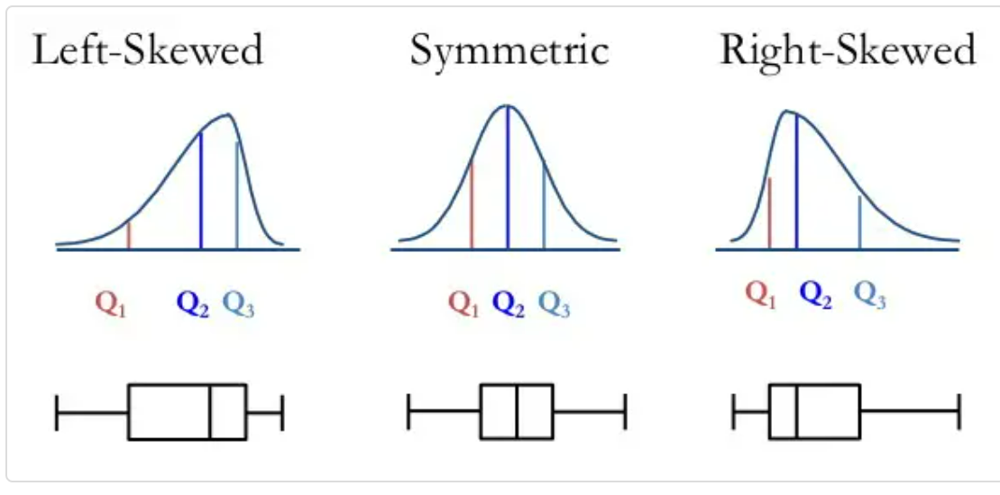

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

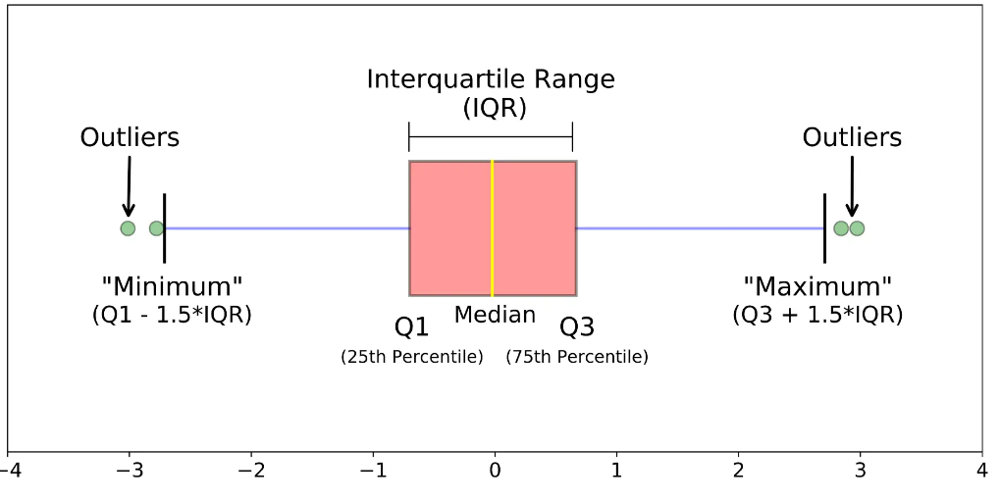

1. If the skewness is between -0.5 and 0.5, the data are fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

In [53]:
continuous_features

['Age', 'Experience', 'Income', 'ZIP_Code', 'CCAvg', 'Mortgage']

In [54]:
def plot_comparison(data, col, title):    
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
    sns.histplot(data=train_df, x=col, kde=True,ax=ax[0],color = 'cornflowerblue')
    ax[0].set_title('Histogram + KDE')
    sns.boxenplot(x=col, ax=ax[1],color = 'cornflowerblue')
    ax[1].set_title('Boxplot')
    sns.violinplot(x=col,saturation=1, ax=ax[2],color = 'cornflowerblue', bw=.15,cut=0)
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

Age
Skew : -0.02
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


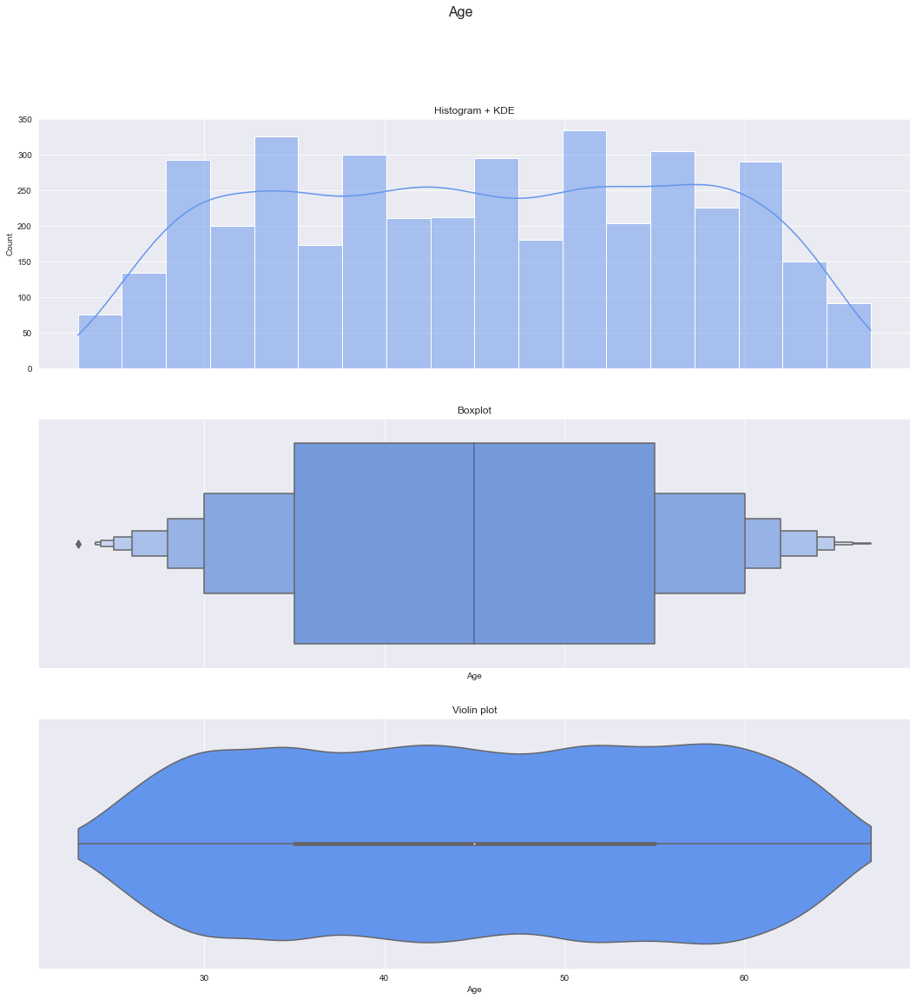

Experience
Skew : -0.02
no.of zeros : 57
% of zeros : 1.42
no.of nulls : 0
% of nulls : 0.0


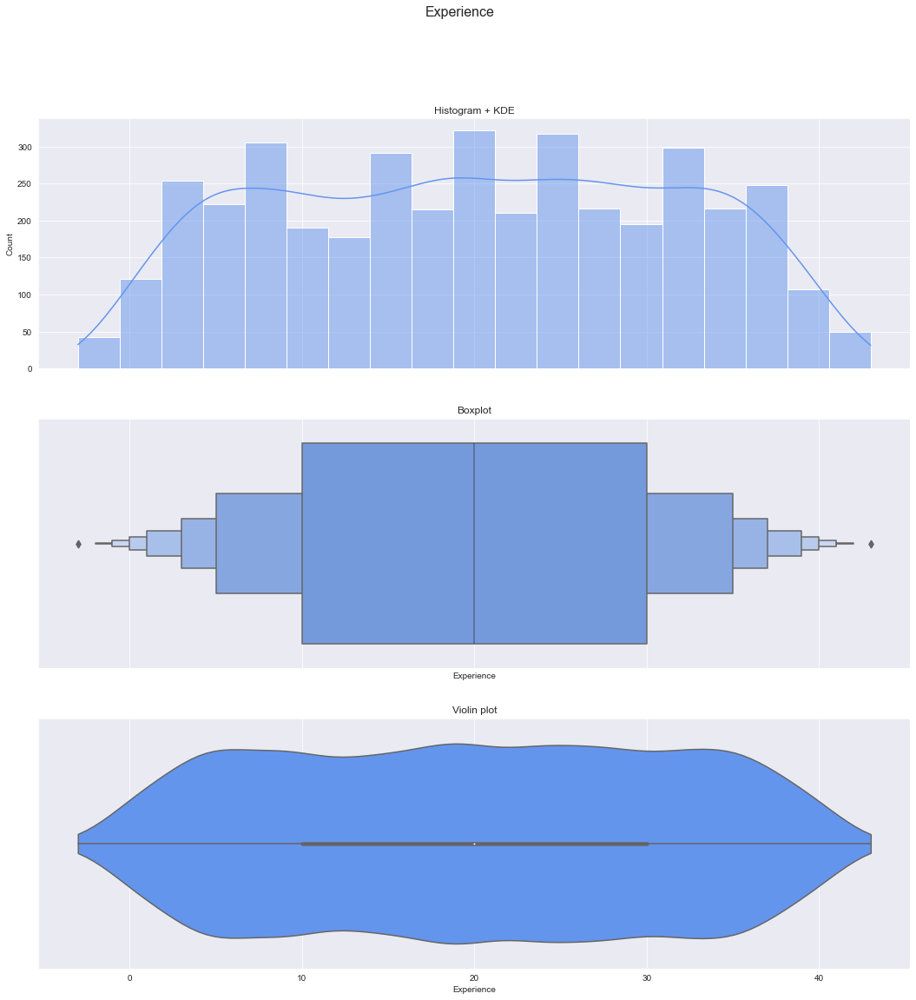

Income
Skew : 0.84
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


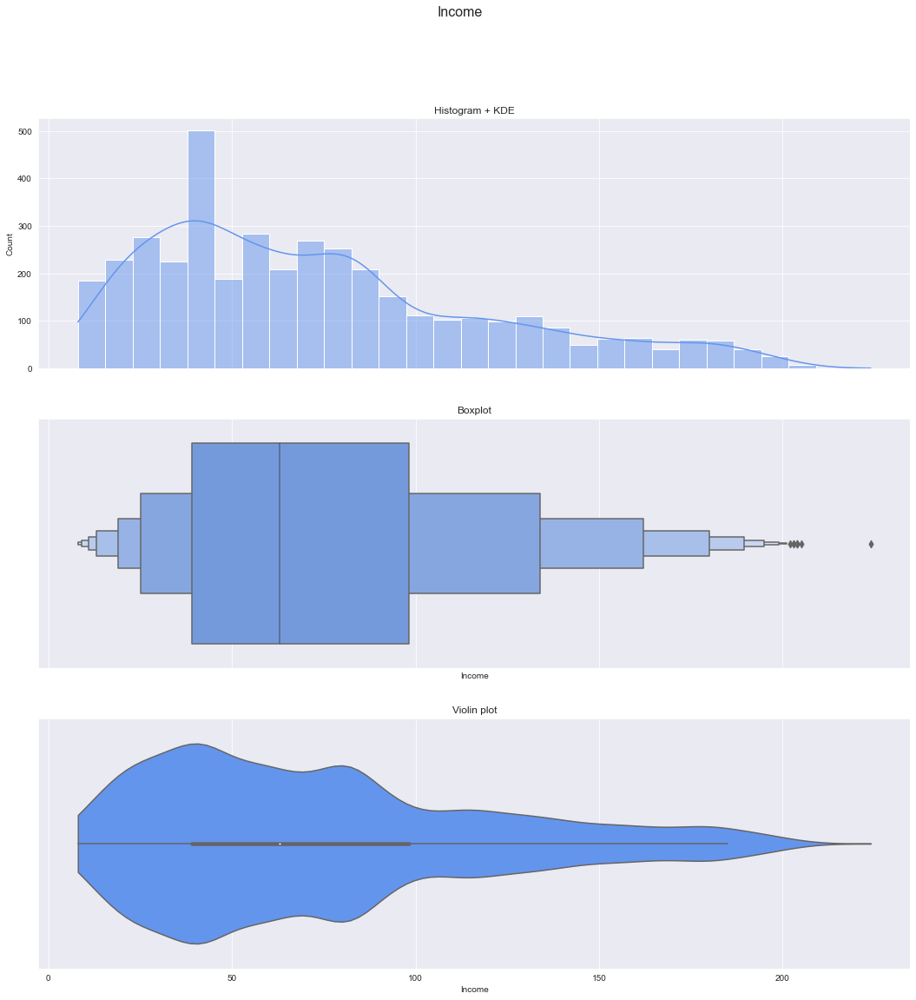

ZIP_Code
Skew : -13.88
no.of zeros : 0
% of zeros : 0.0
no.of nulls : 0
% of nulls : 0.0


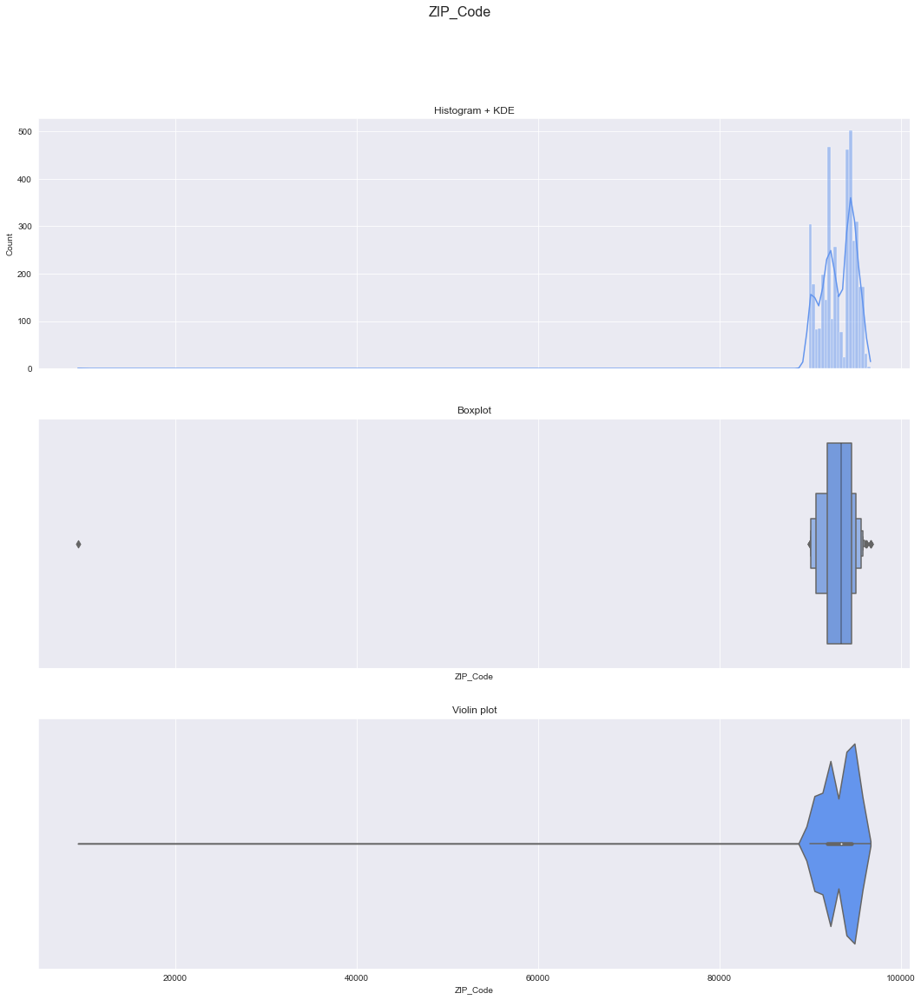

CCAvg
Skew : 1.61
no.of zeros : 86
% of zeros : 2.15
no.of nulls : 0
% of nulls : 0.0


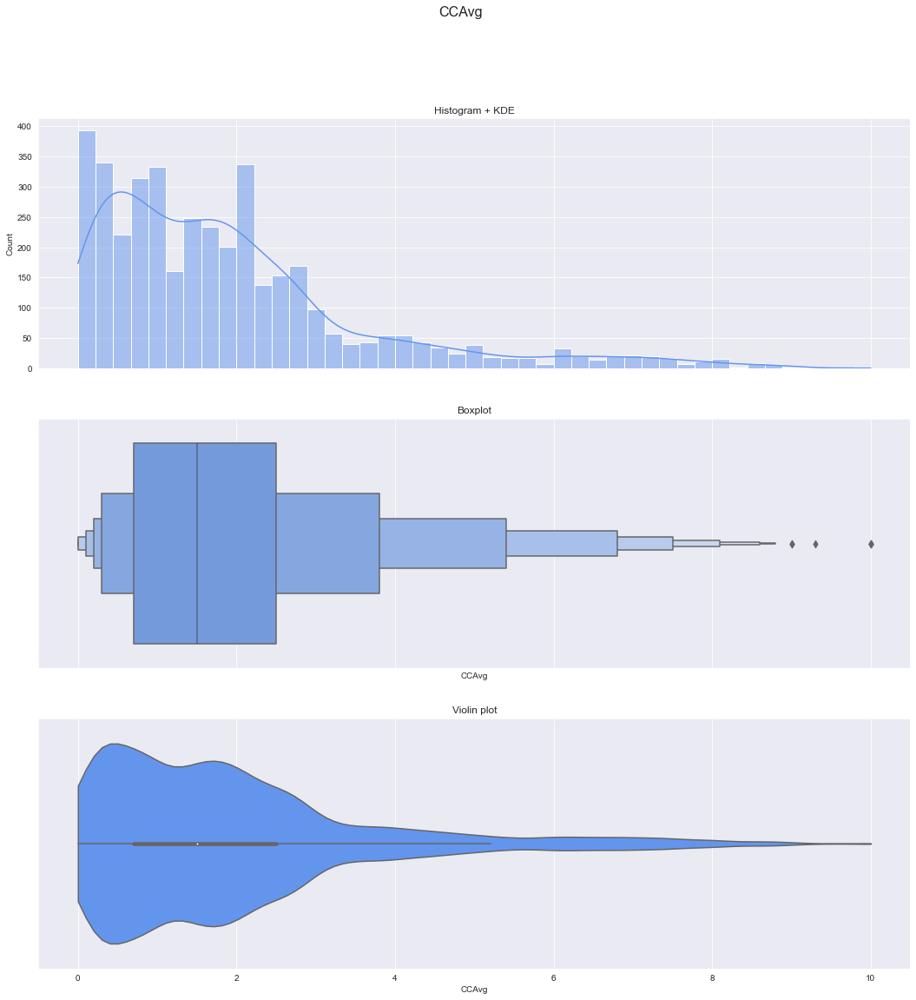

Mortgage
Skew : 2.11
no.of zeros : 2760
% of zeros : 69.0
no.of nulls : 0
% of nulls : 0.0


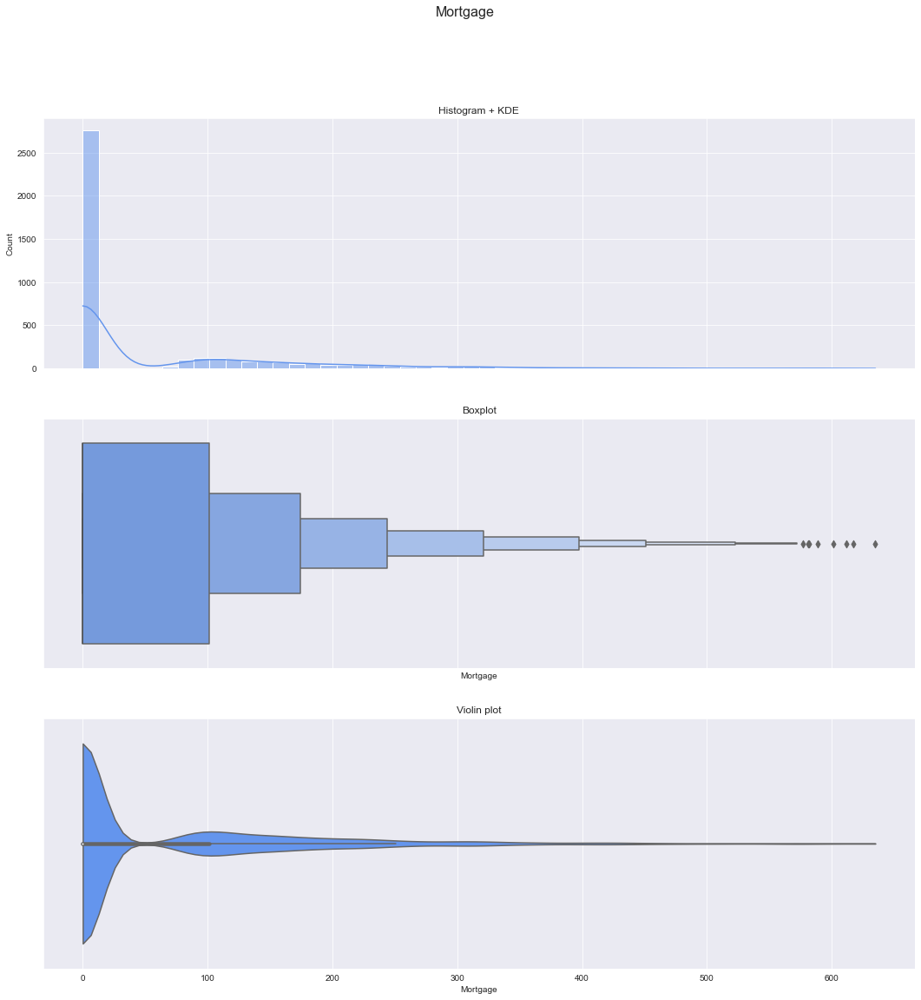

In [55]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

In [56]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [57]:
train_df.loc[train_df['ZIP_Code']<90000]

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
323,51,25,21,9307,4,0.6,3,0,0,0,0,1,1


In [58]:
train_df.drop(357)

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


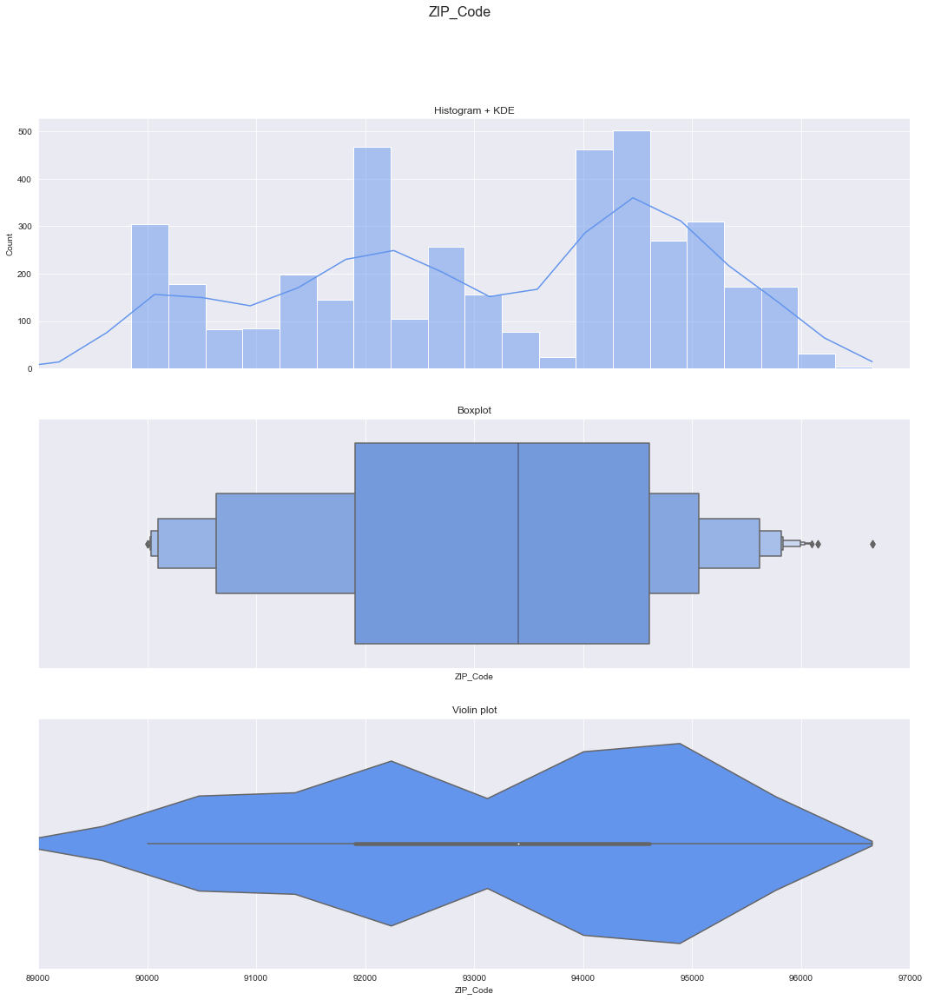

In [59]:
fig, ax = plt.subplots(3, 1, sharex=True, figsize=[18,18])
plt.xlim(89000,97000)
sns.histplot(data=train_df, x='ZIP_Code', kde=True,ax=ax[0],color = 'cornflowerblue')
ax[0].set_title('Histogram + KDE')
sns.boxenplot(data=train_df.drop(357),x='ZIP_Code', ax=ax[1],color = 'cornflowerblue')
ax[1].set_title('Boxplot')
sns.violinplot(data=train_df.drop(357),x='ZIP_Code',saturation=1, ax=ax[2],color = 'cornflowerblue', bw=.15,cut=0)
ax[2].set_title('Violin plot')
fig.suptitle('ZIP_Code', fontsize=16)
plt.show()

In [60]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [61]:
train_df['ZIP_Code'] = train_df['ZIP_Code'].astype(str)

In [62]:
import pandas_bokeh
import pgeocode
import geopandas as gpd
from shapely.geometry import Point
from geopandas import GeoDataFrame
pandas_bokeh.output_notebook()
import plotly.graph_objects as go

nomi = pgeocode.Nominatim('us')

#edf = pd.read_csv('myFile.tsv', sep='\t',header=None, index_col=False ,names=['colC','zipcode','count'])
train_df['Latitude'] = (nomi.query_postal_code(train_df['ZIP_Code'].tolist()).latitude)
train_df['Longitude'] = (nomi.query_postal_code(train_df['ZIP_Code'].tolist()).longitude)

Loading BokehJS ...

In [63]:
fig = go.Figure(data=go.Scattergeo(
        lon = train_df['Longitude'],
        lat = train_df['Latitude'],
        mode = 'markers',
        marker_color  = train_df['target']
        ))

fig.update_layout(
        title = 'colC Distribution',
        geo_scope='usa',
    )
fig.show()

In [64]:
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

In [65]:
street_map = gpd.read_file('../Data/Bank_Prsonal_Loan_signup_modelling/tl_2019_06_cousub/tl_2019_06_cousub.shp')

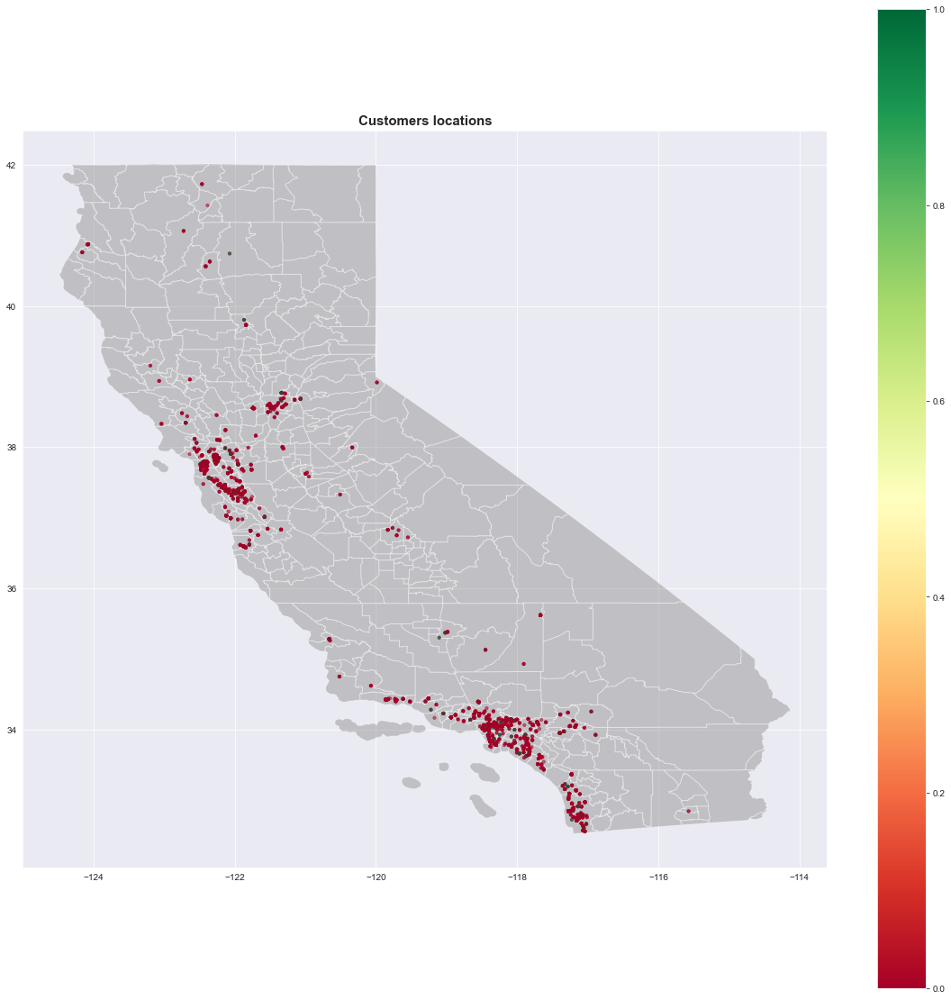

In [66]:
geometry = [Point(xy) for xy in zip(train_df['Longitude'], train_df['Latitude'])]
geo_df = gpd.GeoDataFrame(train_df,geometry = geometry)
fig, ax = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax, alpha=0.4,color='grey')
geo_df.plot(column='target',ax=ax,alpha=0.5, legend=True,markersize=10,cmap='RdYlGn')
plt.title('Customers locations', fontsize=15,fontweight='bold')
#plt.xlim(-74.02,-73.925)
#plt.ylim( 40.7,40.8)
plt.show()

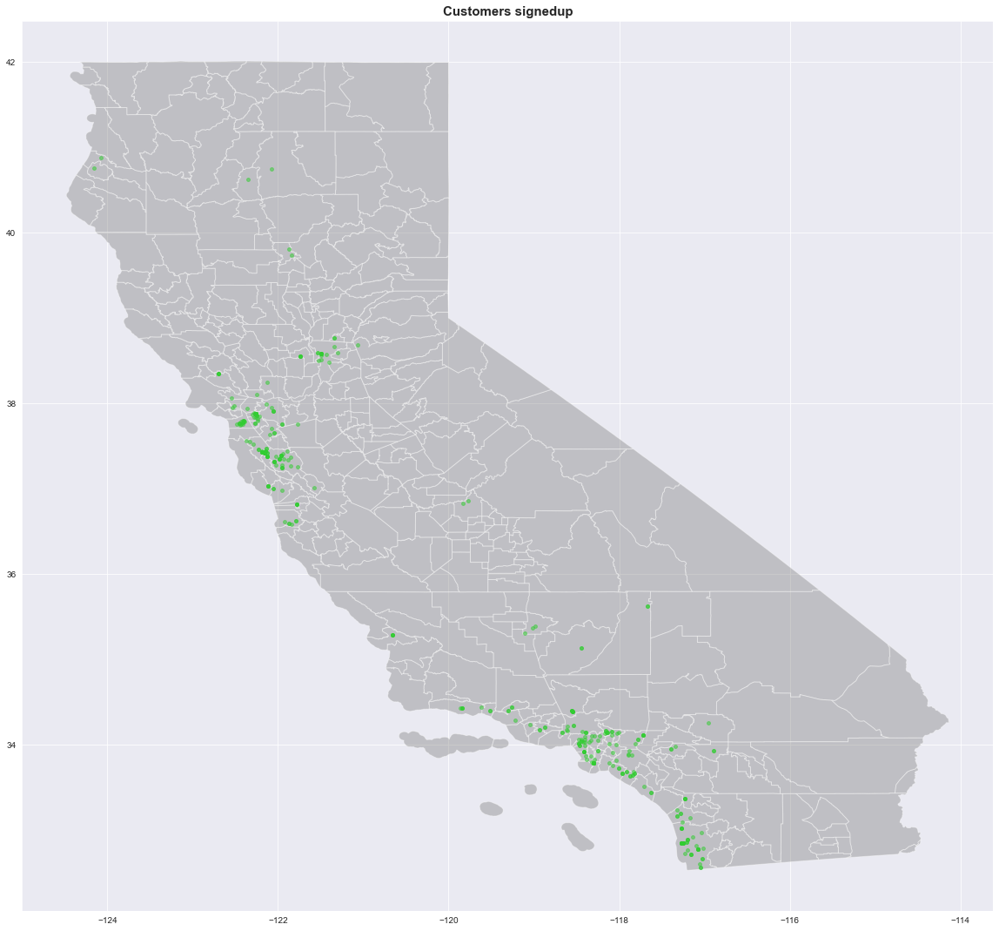

In [67]:
geometry = [Point(xy) for xy in zip(train_df.loc[train_df['target']==1]['Longitude'], train_df.loc[train_df['target']==1]['Latitude'])]
geo_df = gpd.GeoDataFrame(train_df.loc[train_df['target']==1],geometry = geometry)
fig, ax = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax, alpha=0.4,color='grey')
geo_df.plot(column='target',ax=ax,alpha=0.5, legend=True,markersize=15,color='limegreen')
plt.title('Customers signedup', fontsize=15,fontweight='bold')
plt.show()

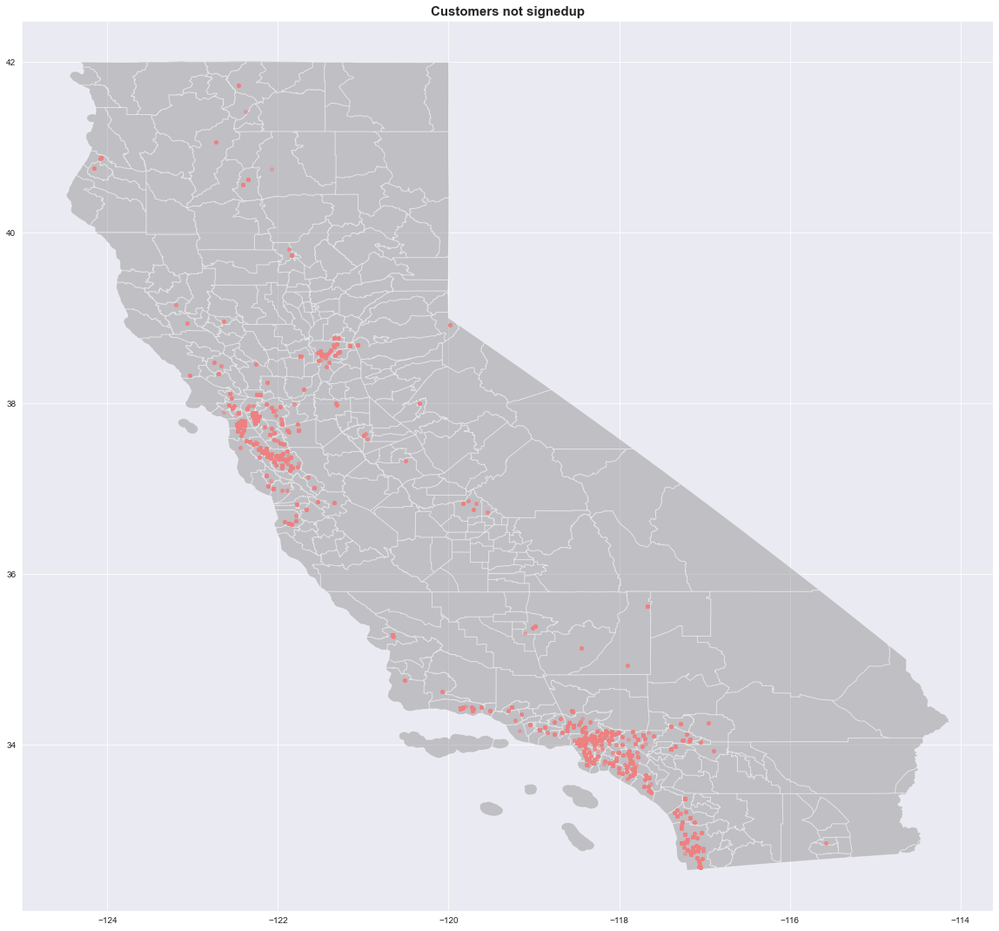

In [68]:
geometry = [Point(xy) for xy in zip(train_df.loc[train_df['target']==0]['Longitude'], train_df.loc[train_df['target']==0]['Latitude'])]
geo_df = gpd.GeoDataFrame(train_df.loc[train_df['target']==0],geometry = geometry)
fig, ax = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax, alpha=0.4,color='grey')
geo_df.plot(column='target',ax=ax,alpha=0.5, legend=True,markersize=15,color='lightcoral')
plt.title('Customers not signedup', fontsize=15,fontweight='bold')
plt.show()

In [69]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard,Latitude,Longitude,geometry
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,33.7866,-118.2987,POINT (-118.29870 33.78660)
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,37.8738,-122.2549,POINT (-122.25490 37.87380)
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,37.7195,-122.4411,POINT (-122.44110 37.71950)
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,34.2283,-118.5368,POINT (-118.53680 34.22830)
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0,32.8919,-117.2035,POINT (-117.20350 32.89190)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0,37.6873,-121.8957,POINT (-121.89570 37.68730)
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0,32.8455,-117.2521,POINT (-117.25210 32.84550)
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0,34.4451,-119.2565,POINT (-119.25650 34.44510)
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0,34.0290,-118.4005,POINT (-118.40050 34.02900)


In [70]:
## I tried to get the location details from zipcode but facing multiple errors. so just leaving it, but you can try

In [71]:
train_df.drop(['Latitude','Longitude','geometry'],axis=1,inplace=True)

In [72]:
continuous_features = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

Age
no.of nulls : 0
% of nulls : 0.0
Skew : -0.02


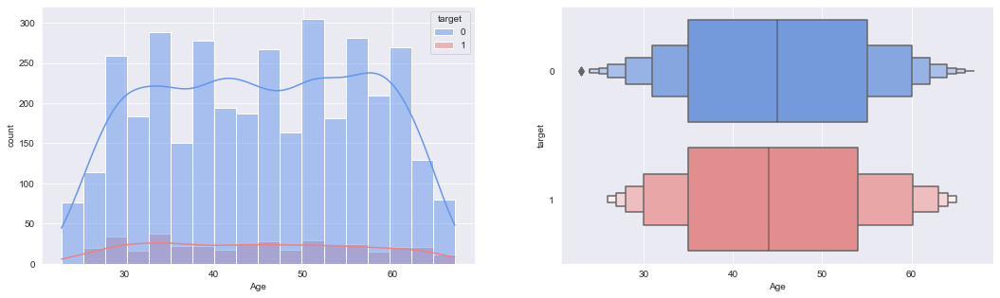

Experience
no.of nulls : 0
% of nulls : 0.0
Skew : -0.02


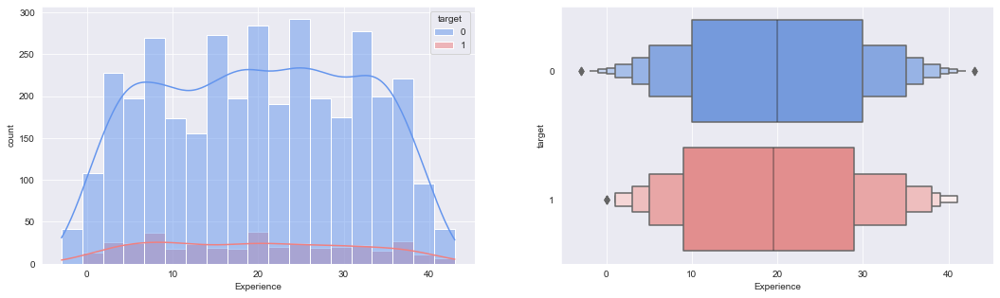

Income
no.of nulls : 0
% of nulls : 0.0
Skew : 0.84


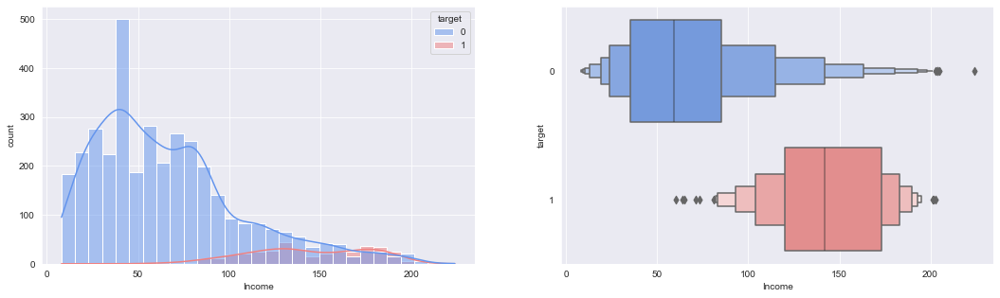

CCAvg
no.of nulls : 0
% of nulls : 0.0
Skew : 1.61


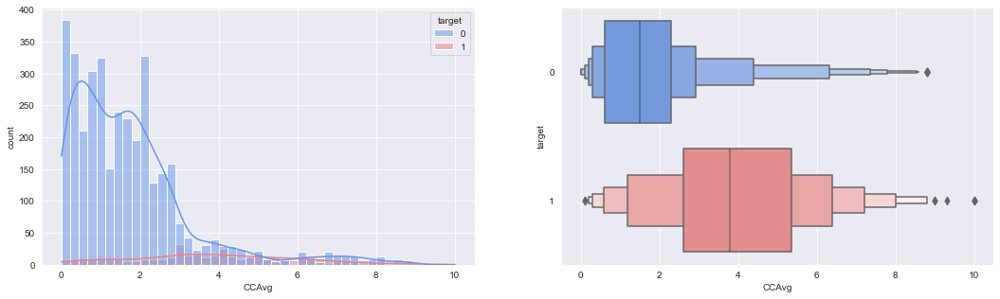

Mortgage
no.of nulls : 0
% of nulls : 0.0
Skew : 2.11


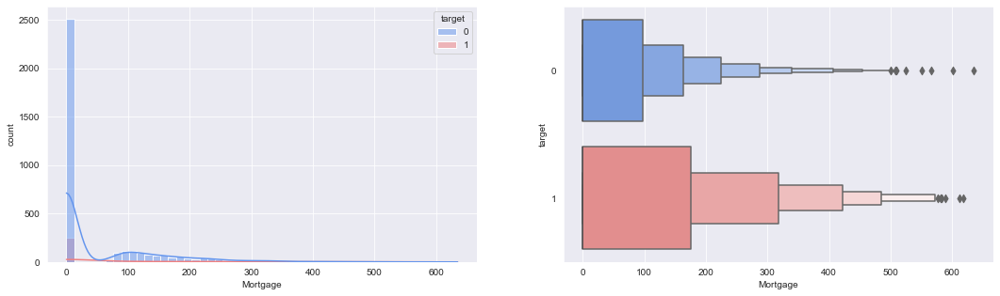

In [73]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

Age
Skew : -0.02


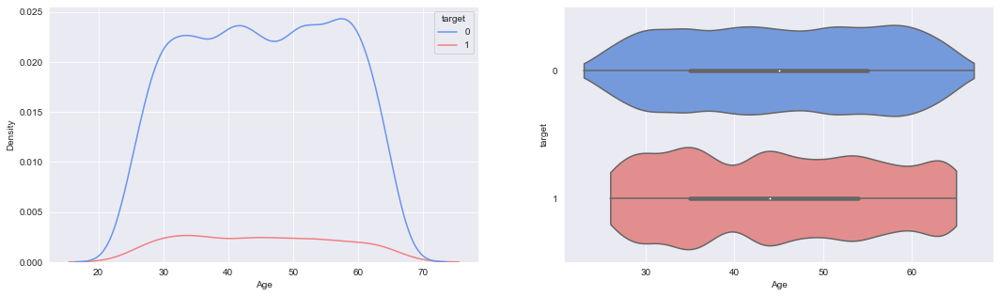

Experience
Skew : -0.02


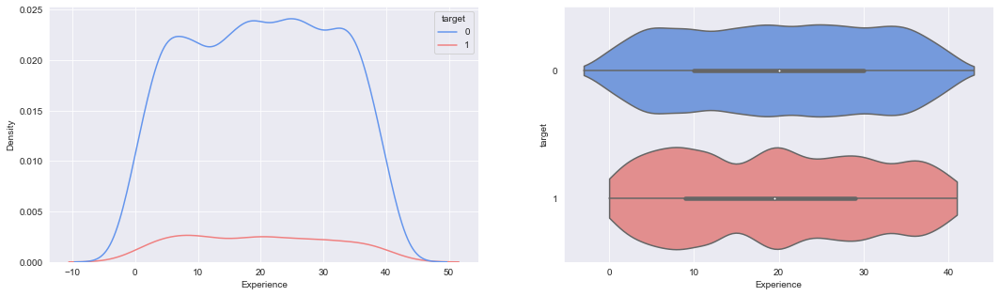

Income
Skew : 0.84


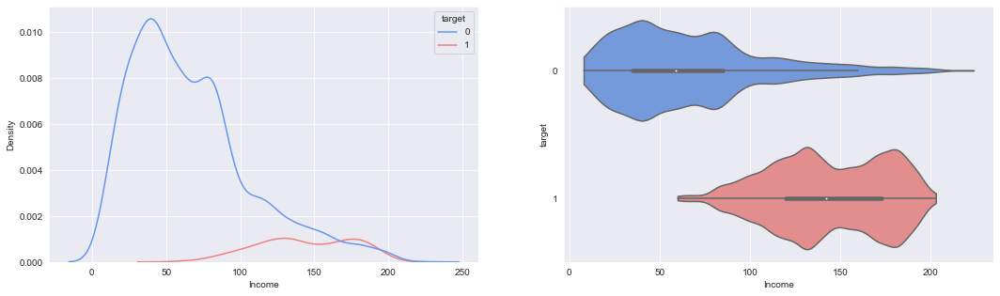

CCAvg
Skew : 1.61


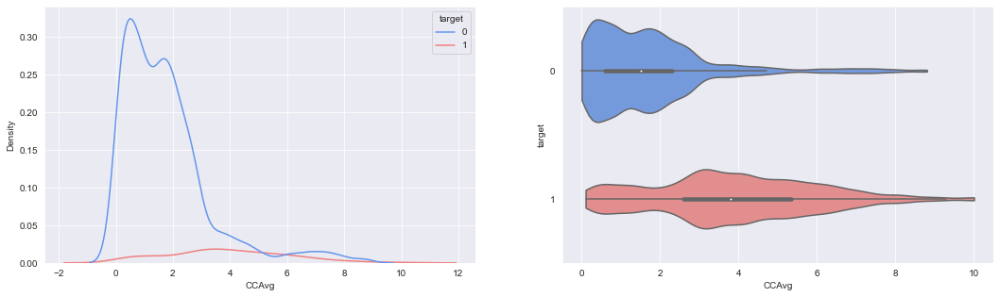

Mortgage
Skew : 2.11


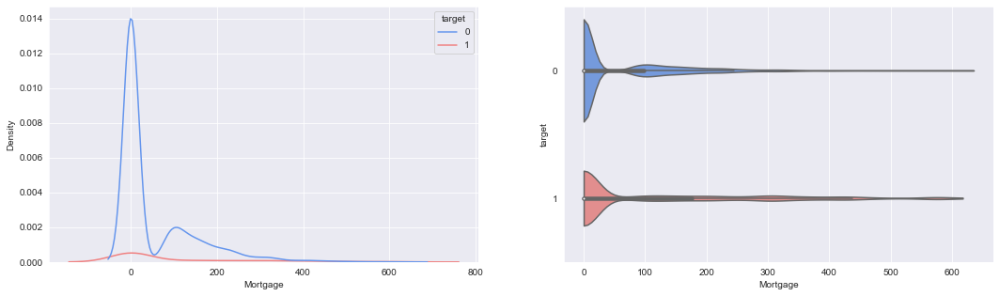

In [74]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [75]:
import scipy.stats as stat
import pylab 

Age
Skew : -0.02
0.0


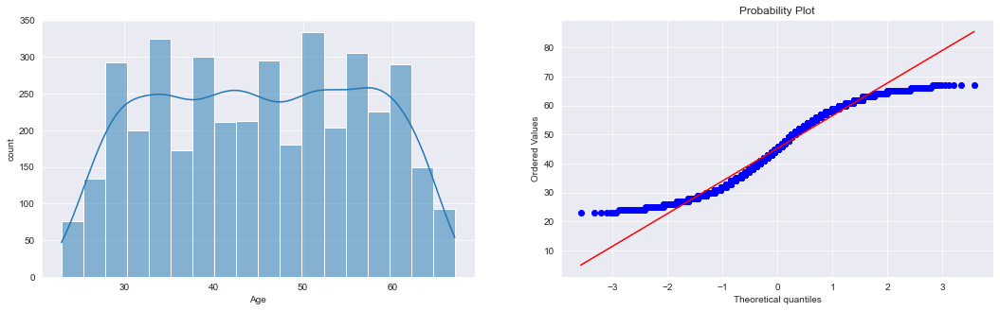

Experience
Skew : -0.02
0.0


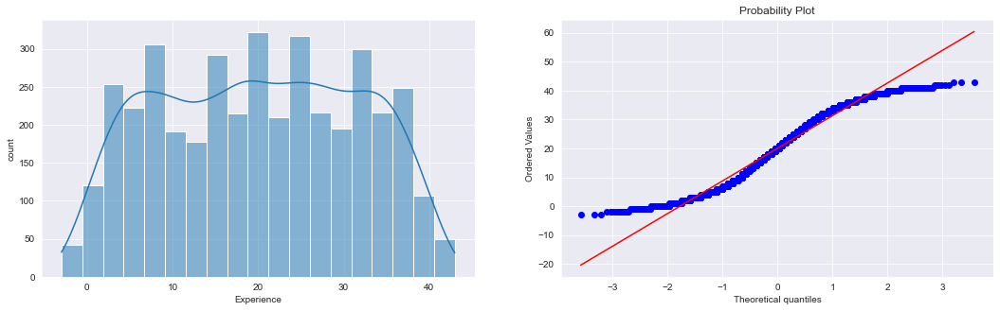

Income
Skew : 0.84
2.1307437403866026e-79


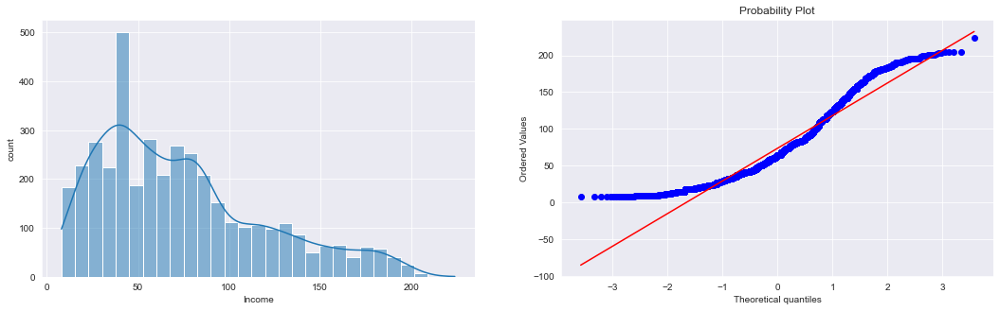

CCAvg
Skew : 1.61
4.106304019621041e-257


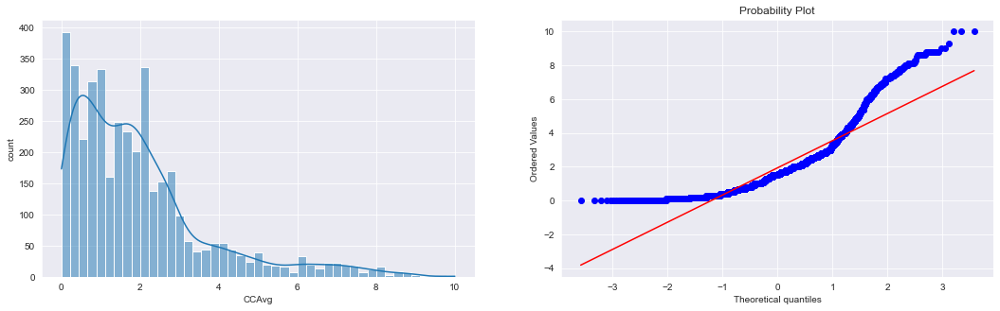

Mortgage
Skew : 2.11
0.0


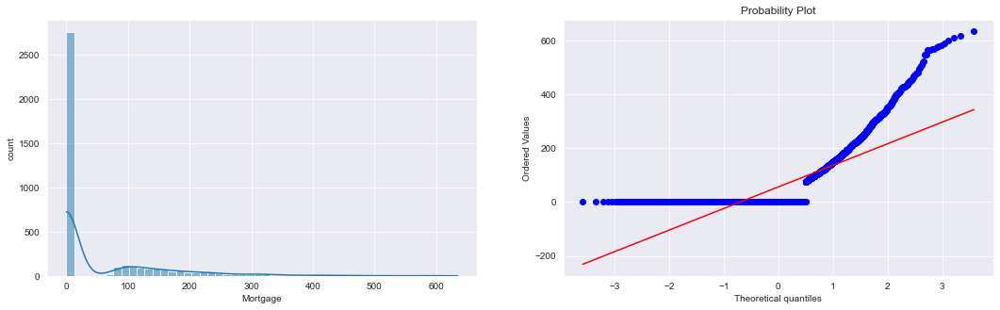

In [76]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

### Observations :

1. From above we can see that customers who's Income is more and customers who's CCAvg spending is more they will more likey to signup for personal loan
2. Age and Experience are uniformaly distributed
3. Income, CCAvg and Mortgageare right skewed

In [77]:
train_df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of Customers signedup')

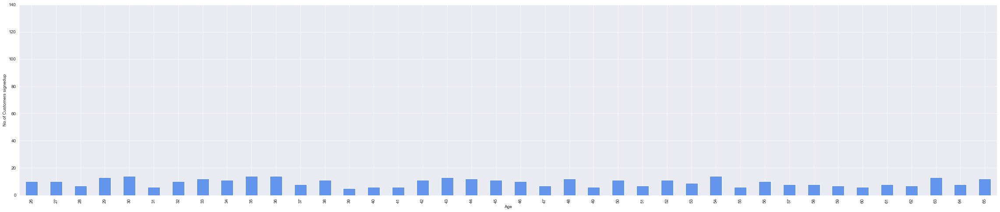

In [78]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==1]['Age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 140)

plt.xlabel('Age')
plt.ylabel('No.of Customers signedup')

# Double click on the plot/graph to zoom in

Text(0, 0.5, 'No.of Customers not signedup')

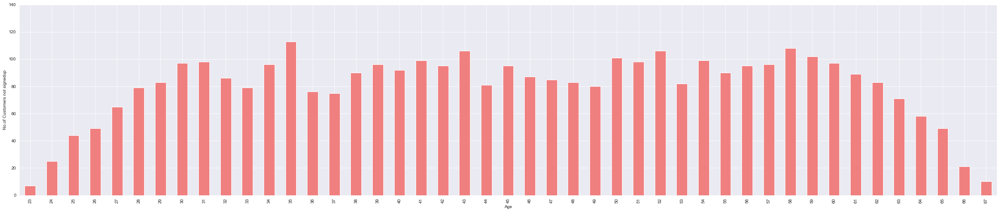

In [79]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==0]['Age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 140)

plt.xlabel('Age')
plt.ylabel('No.of Customers not signedup')

# Double click on the plot/graph to zoom in

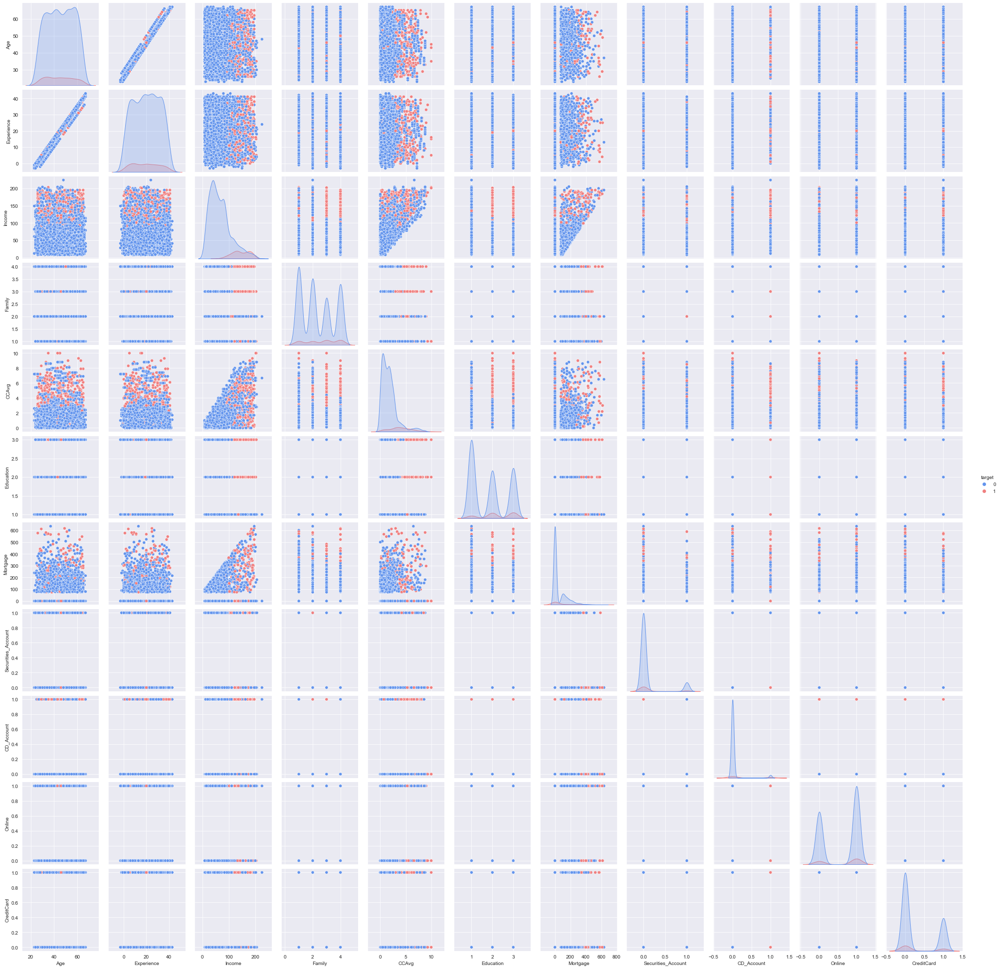

In [80]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

In [81]:
continuous_features

['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

In [82]:
continuous_features = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

Age


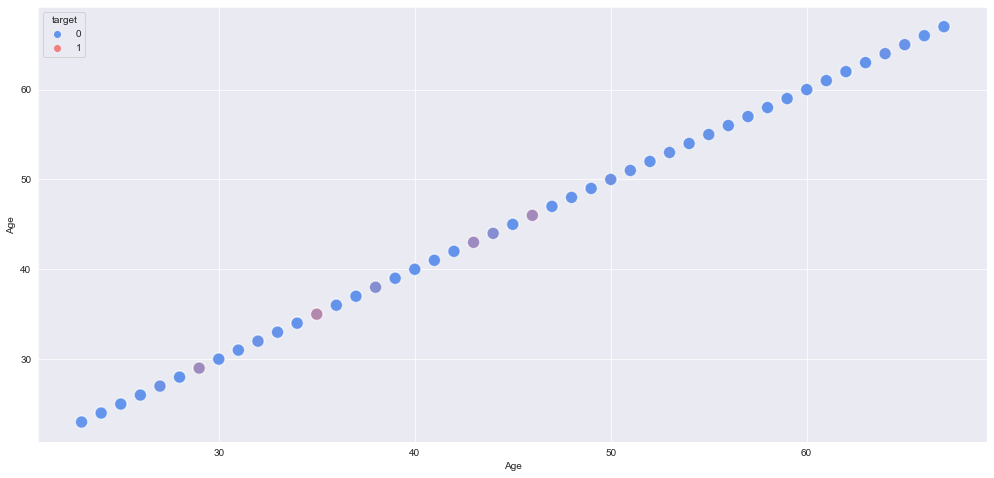

Experience


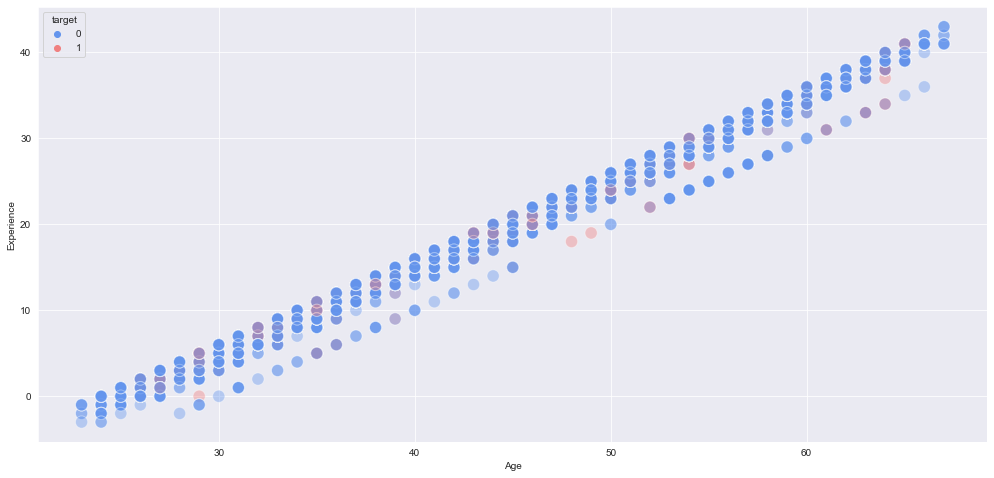

Income


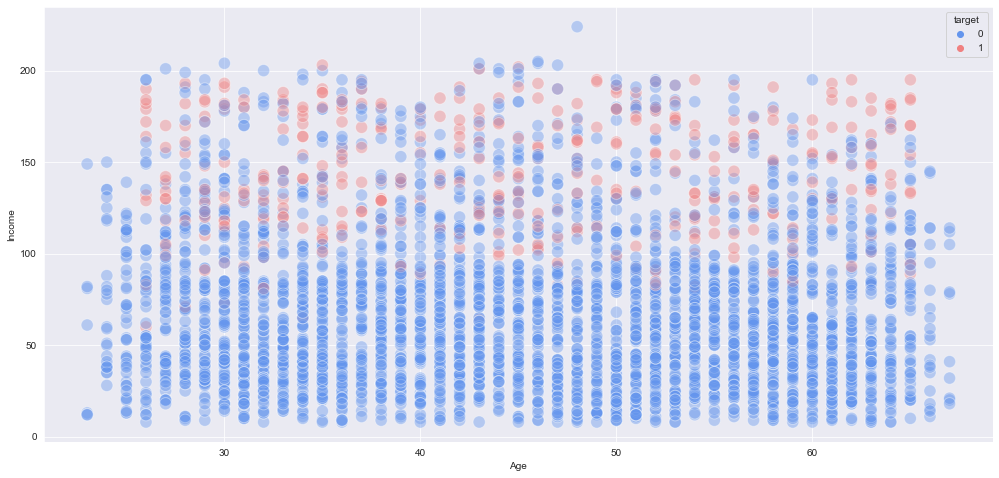

CCAvg


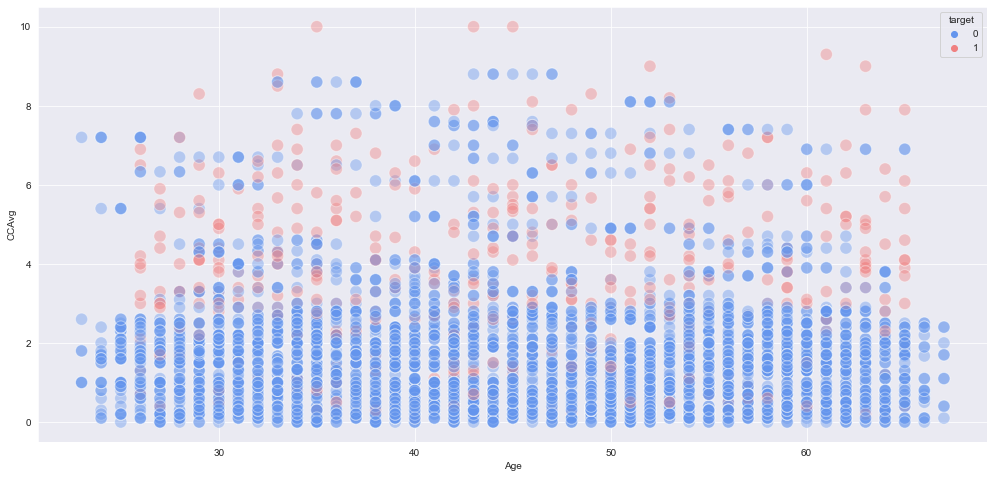

Mortgage


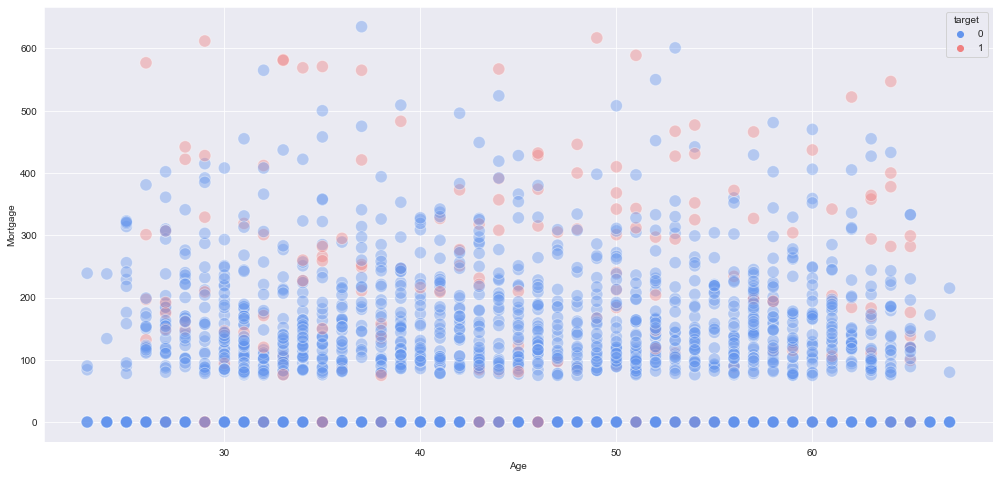

In [83]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Age')
    plt.ylabel(col)
    plt.show()

Age


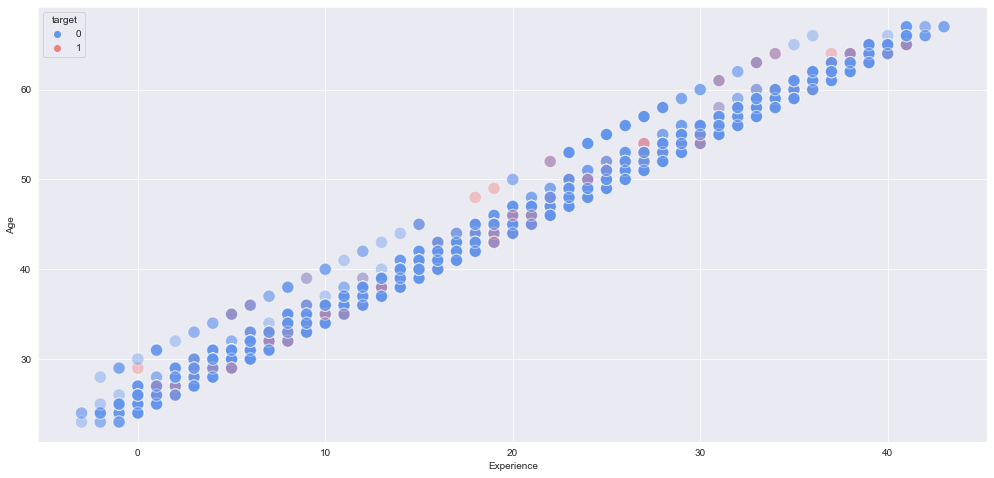

Experience


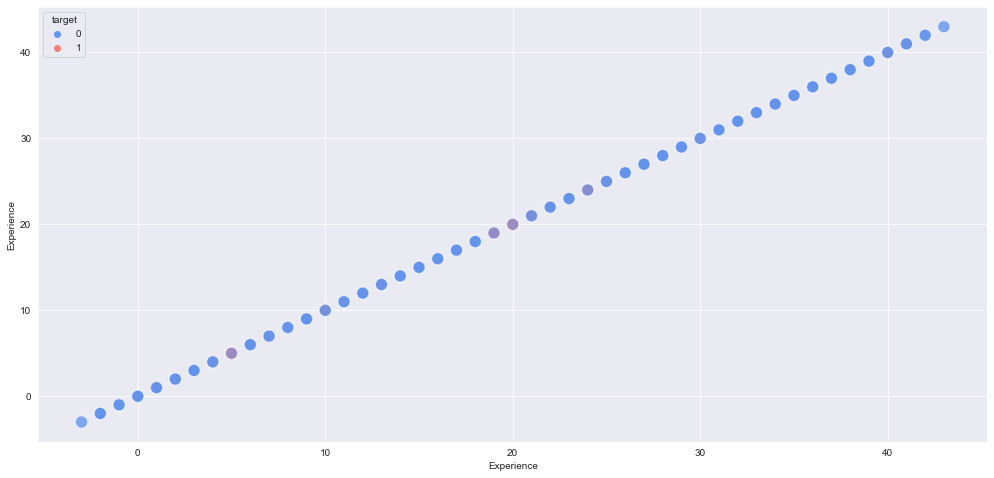

Income


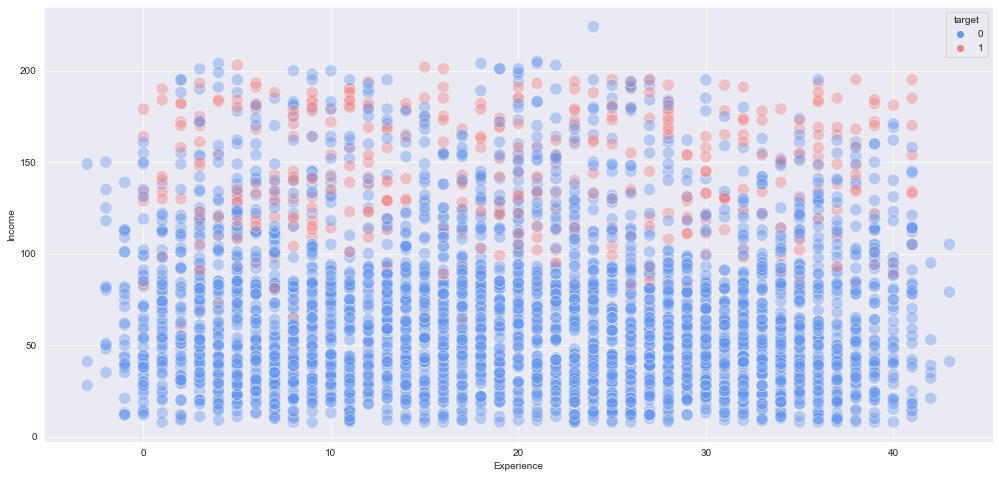

CCAvg


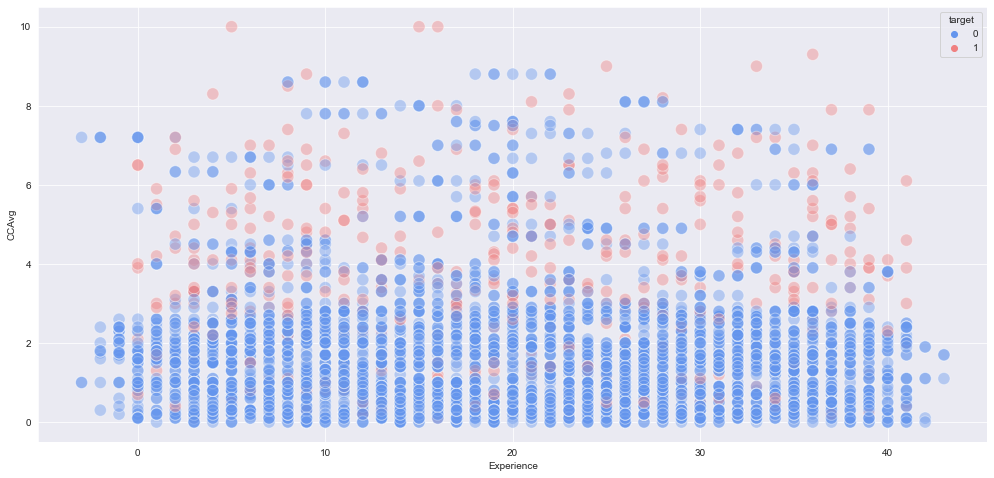

Mortgage


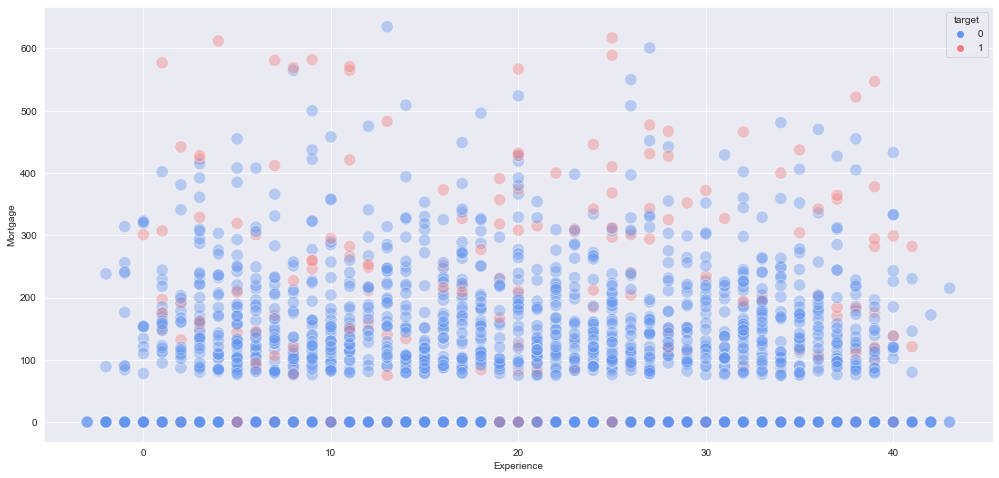

In [84]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Experience',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Experience')
    plt.ylabel(col)
    plt.show()

Age


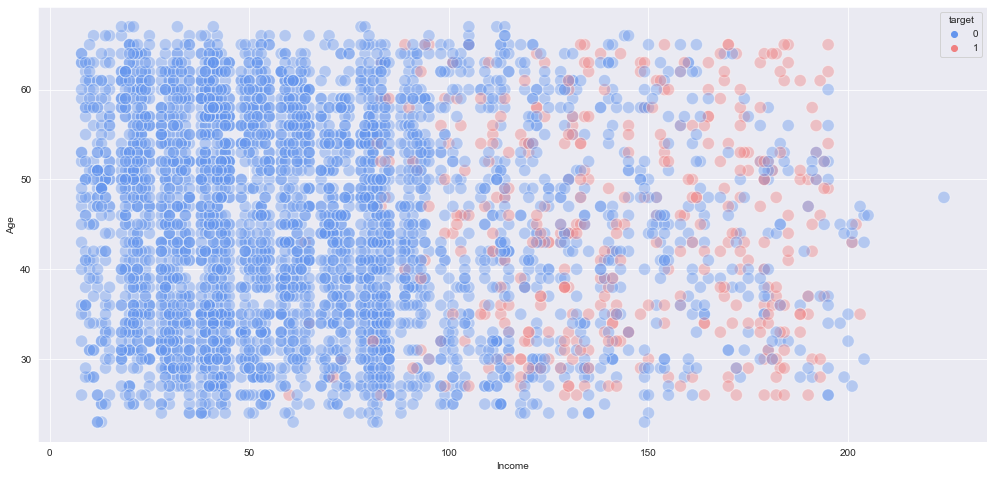

Experience


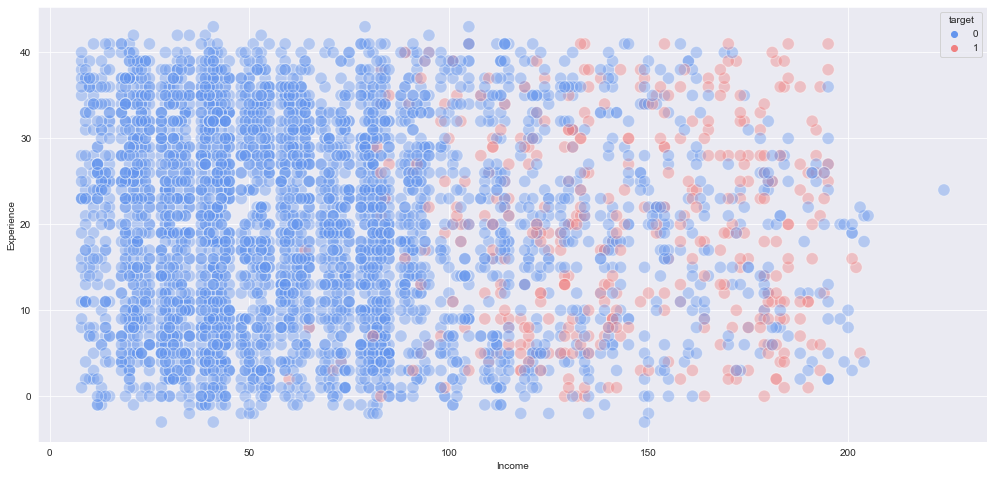

Income


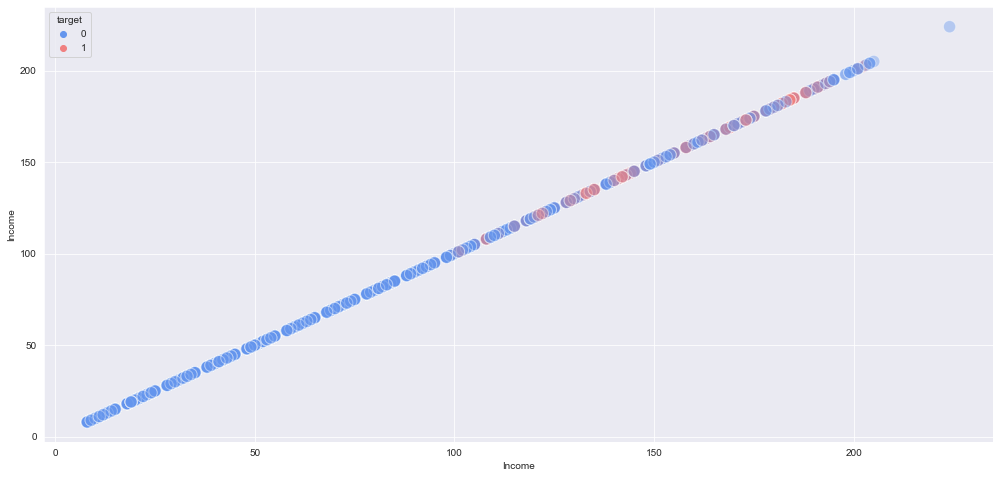

CCAvg


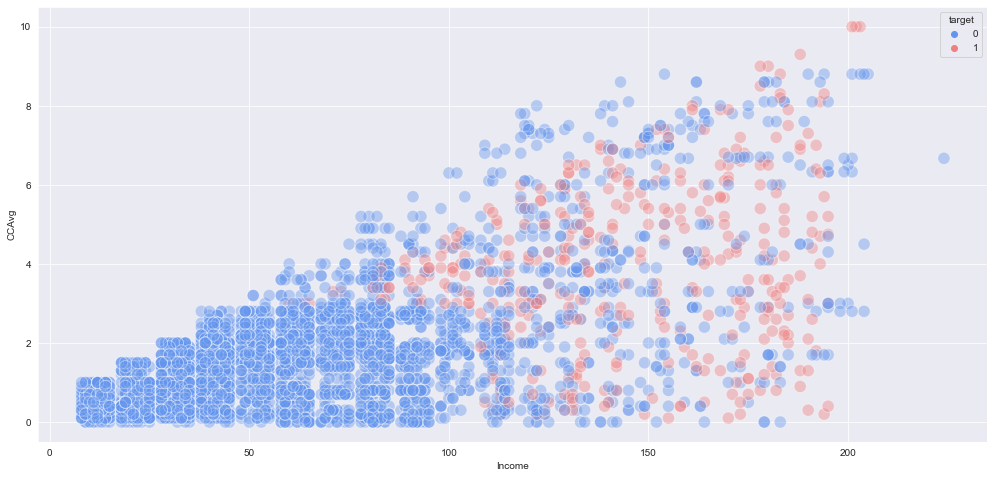

Mortgage


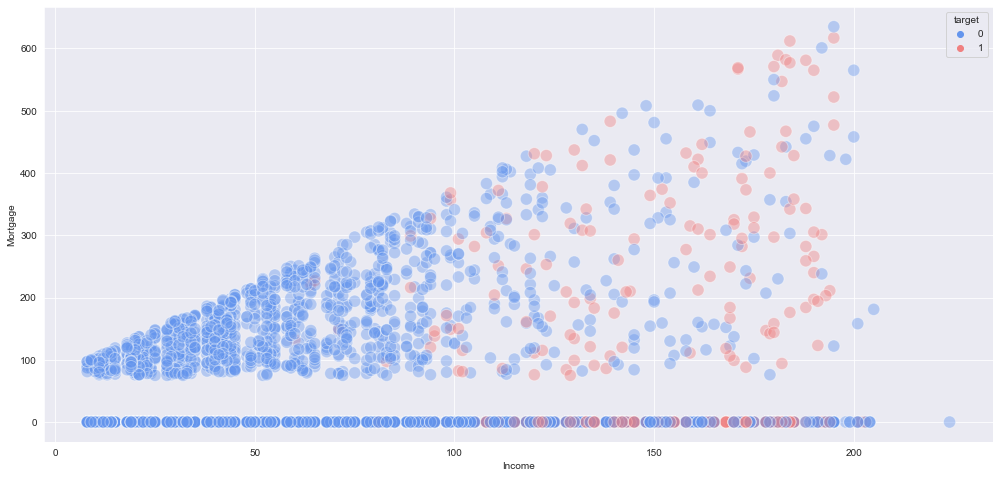

In [85]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Income',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Income')
    plt.ylabel(col)
    plt.show()

Age


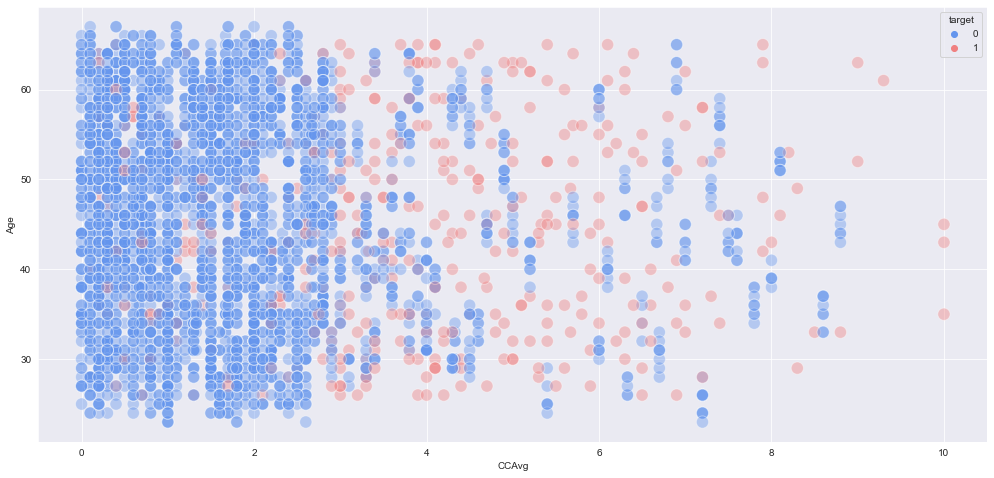

Experience


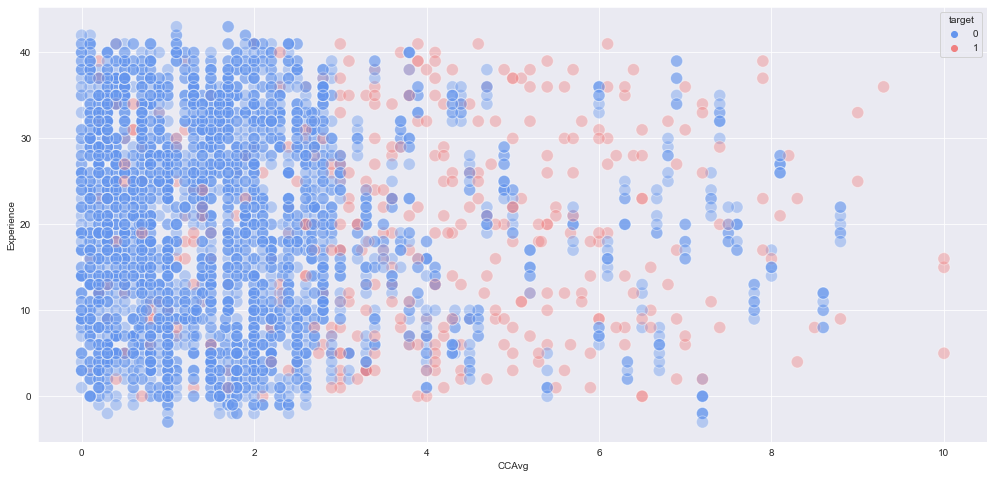

Income


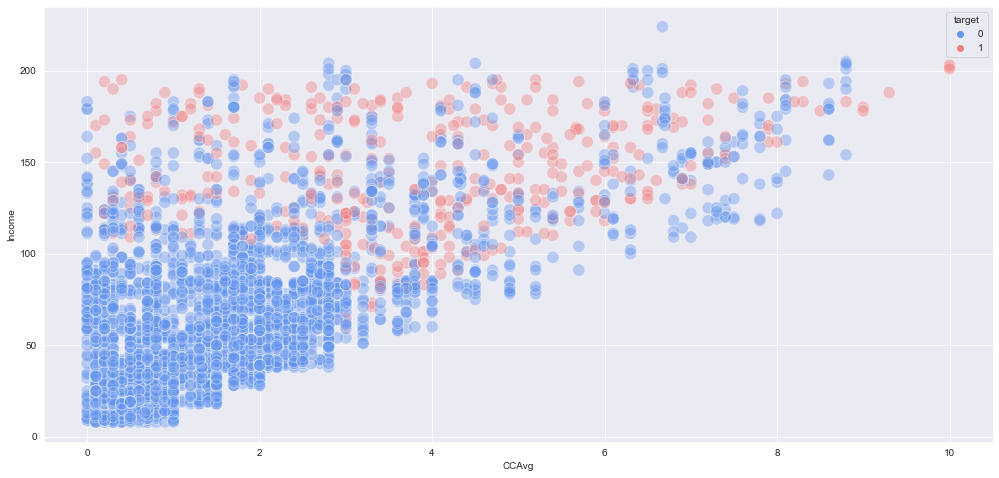

CCAvg


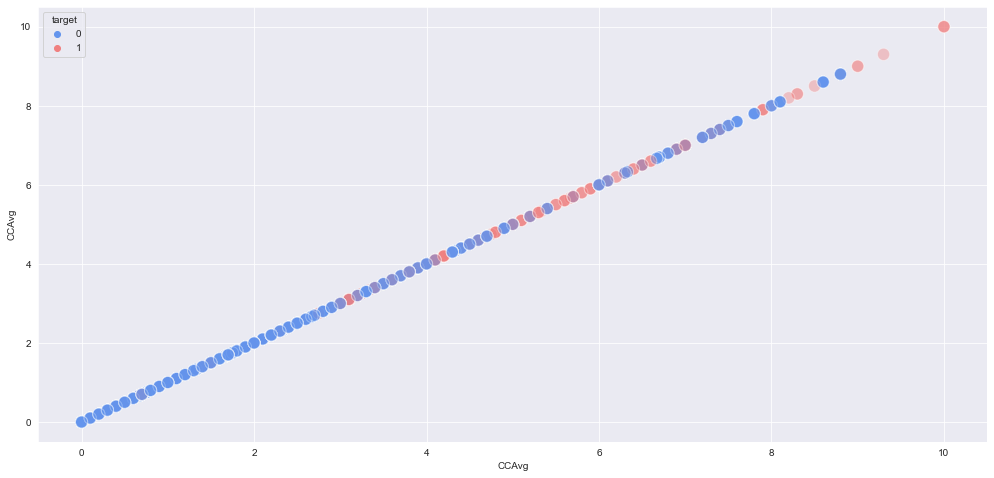

Mortgage


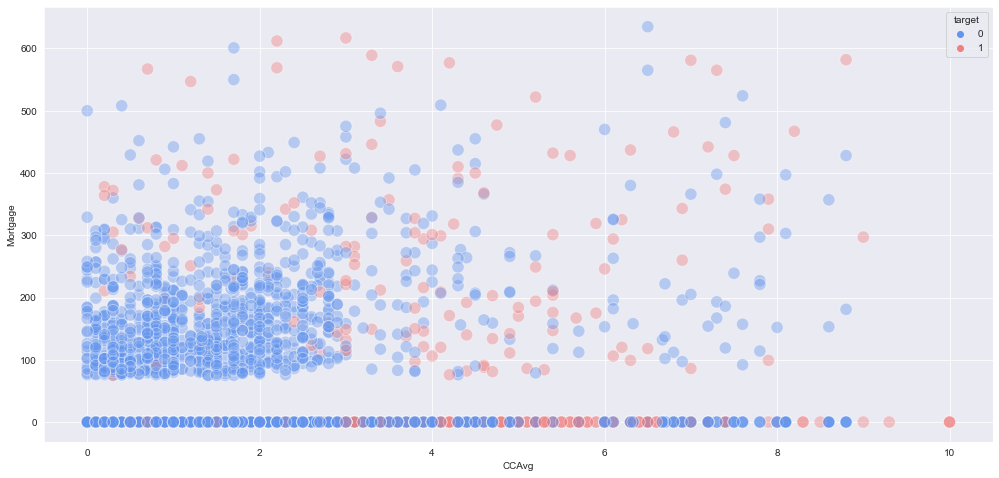

In [86]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='CCAvg',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('CCAvg')
    plt.ylabel(col)
    plt.show()

Age


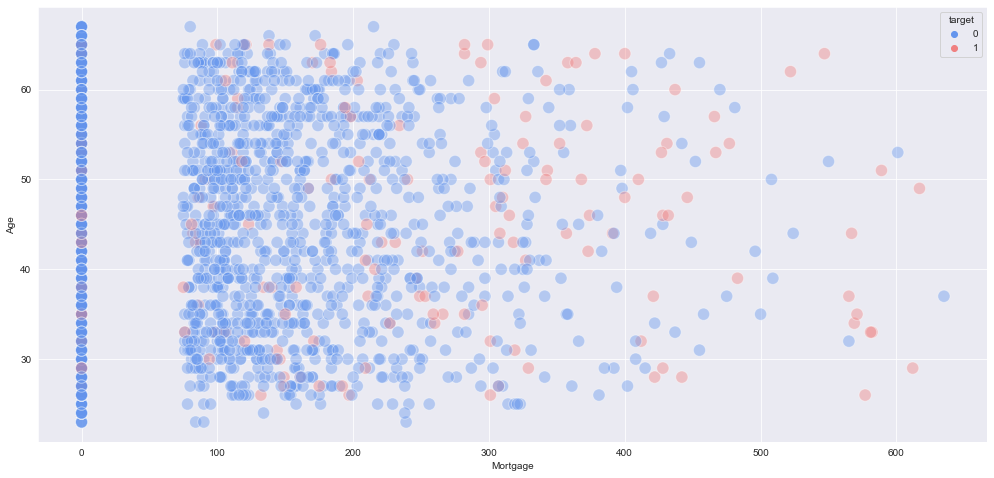

Experience


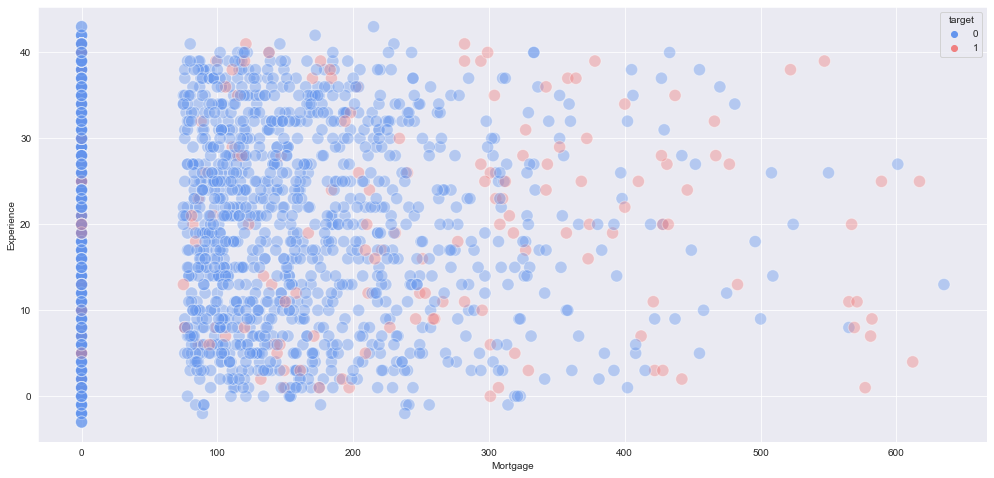

Income


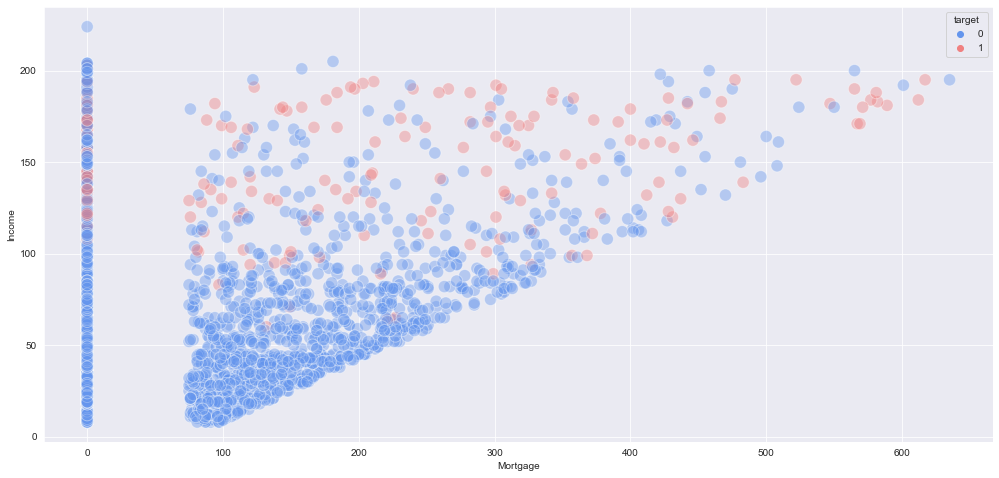

CCAvg


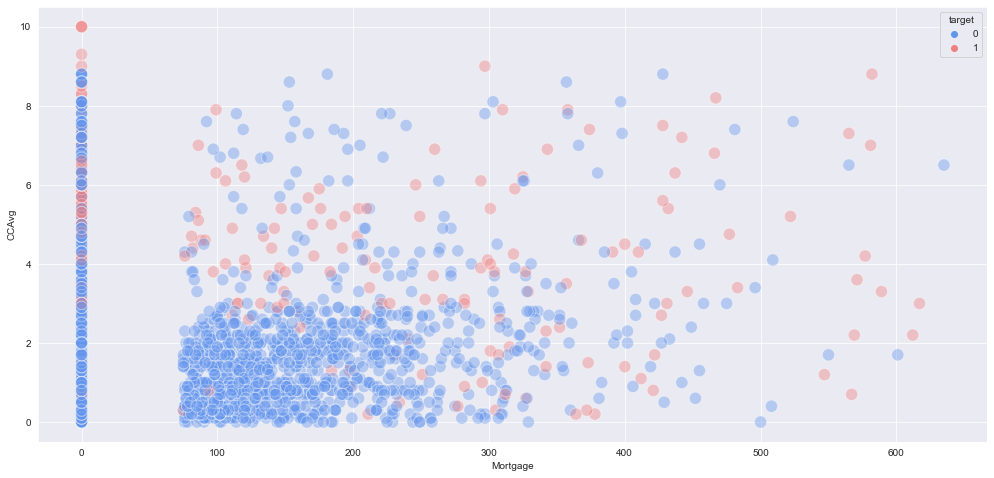

Mortgage


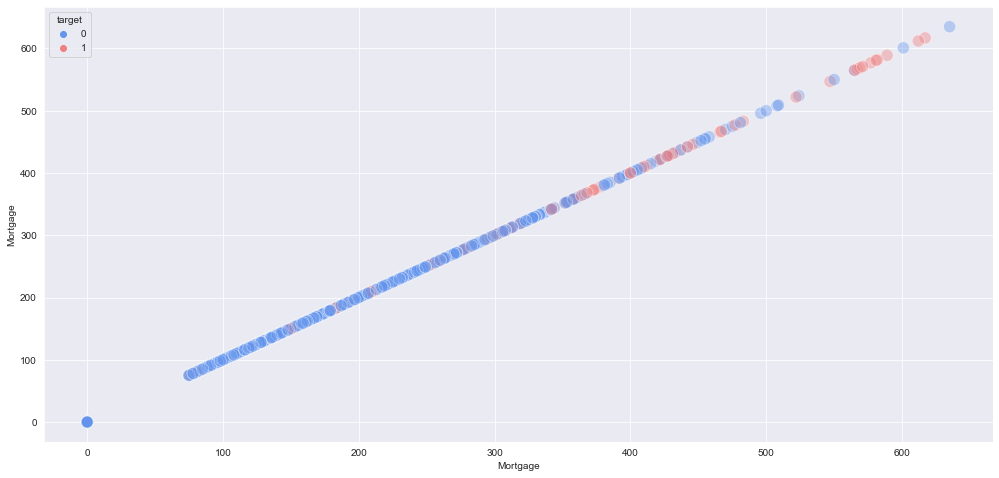

In [87]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Mortgage',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Mortgage')
    plt.ylabel(col)
    plt.show()

In [88]:
train_df.columns

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

In [89]:
fig = px.scatter_3d(train_df, x="CCAvg", y="Income", z="Age", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [90]:
train_df[discrete_features].nunique().sort_values(ascending=False)

Family                4
Education             3
target                2
Securities_Account    2
CD_Account            2
Online                2
CreditCard            2
dtype: int64

In [91]:
discrete_features = ['Family','Education','Securities_Account','CD_Account','Online','CreditCard']

In [92]:
discrete_features

['Family',
 'Education',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

Family


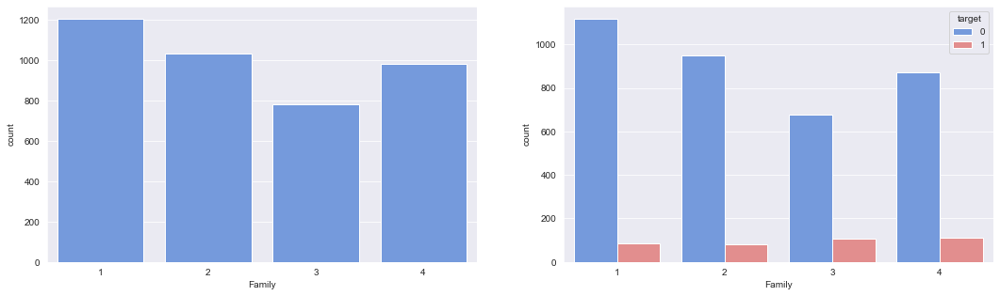

Education


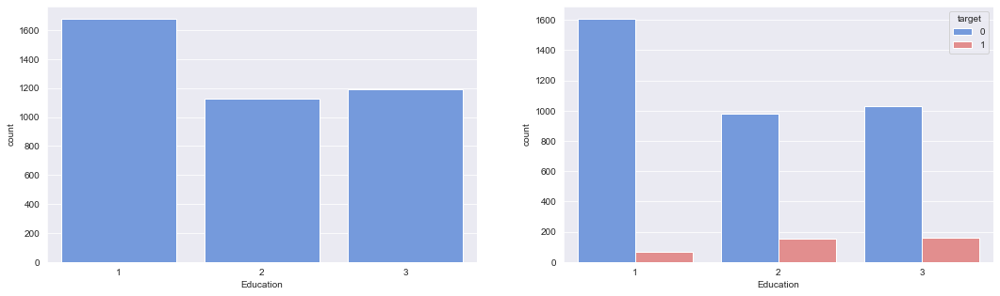

Securities_Account


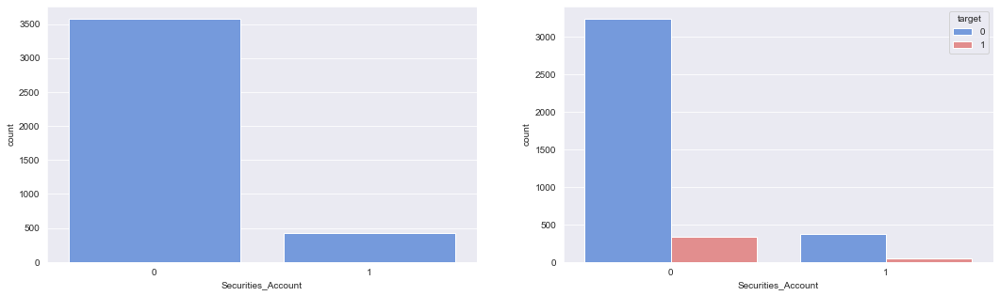

CD_Account


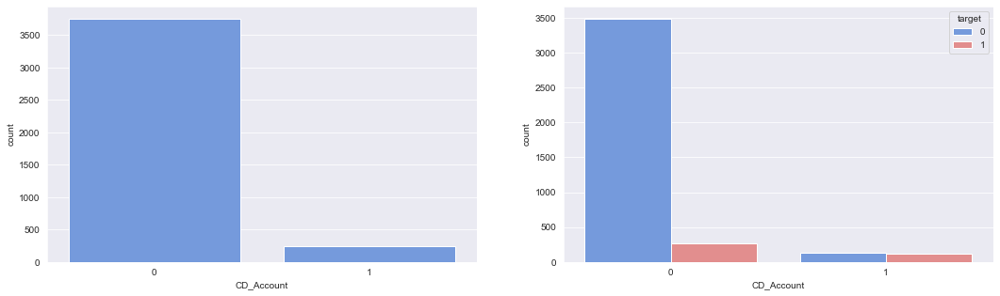

Online


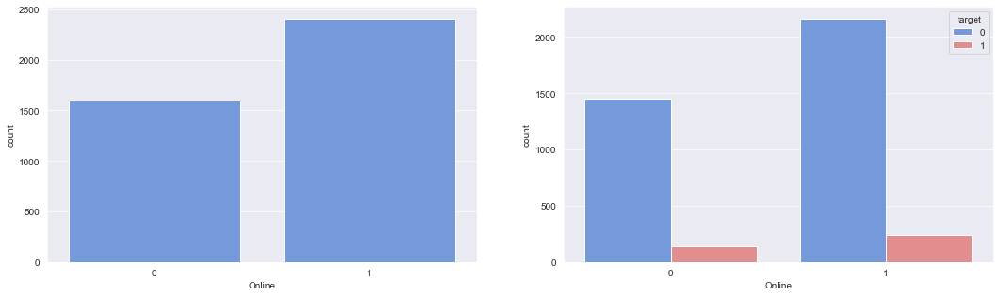

CreditCard


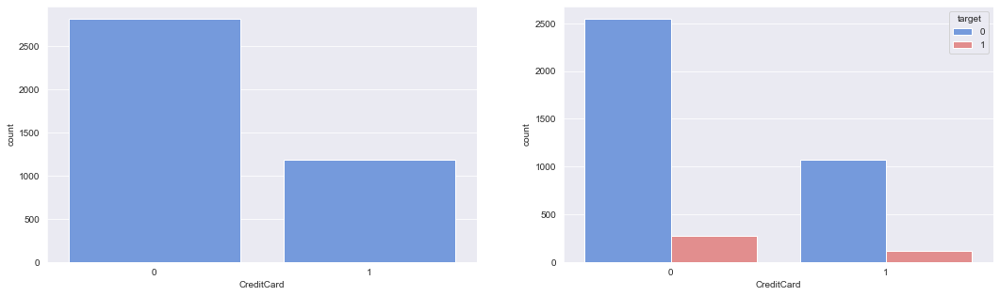

In [93]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=train_df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=train_df, x=col, hue="target",palette=['cornflowerblue','lightcoral'])
    plt.show()

Family


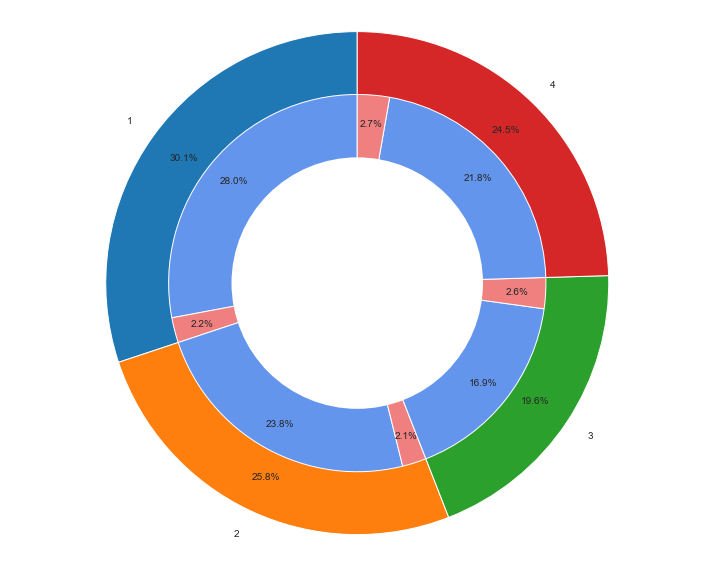

In [94]:
print('Family')
labels = train_df['Family'].value_counts().sort_index().index
sizes = train_df['Family'].value_counts().sort_index().values
#labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Family','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

Education


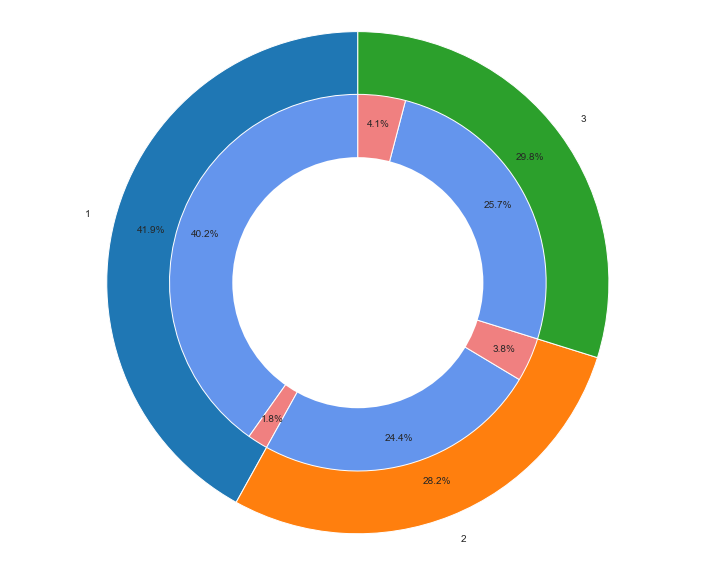

In [95]:
print('Education')
labels = train_df['Education'].value_counts().sort_index().index
sizes = train_df['Education'].value_counts().sort_index().values
#labels_gender = [0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Education','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

Securities_Account


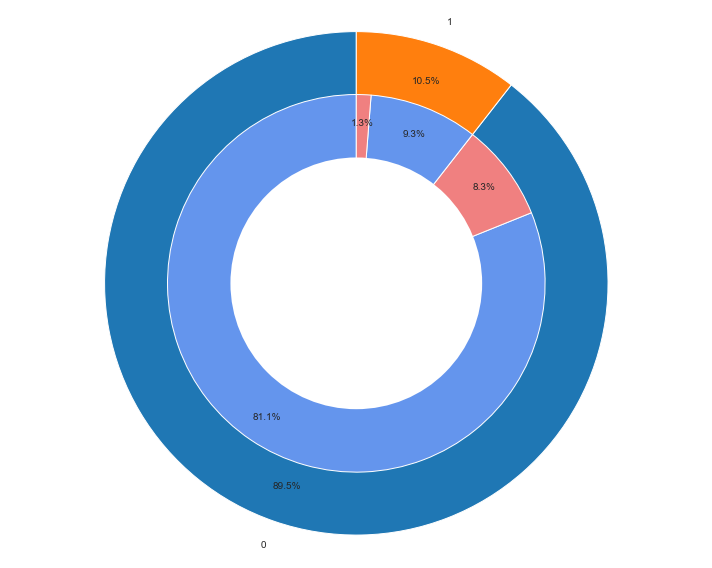

In [96]:
print('Securities_Account')
labels = train_df['Securities_Account'].value_counts().sort_index().index
sizes = train_df['Securities_Account'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['Securities_Account','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

CD_Account


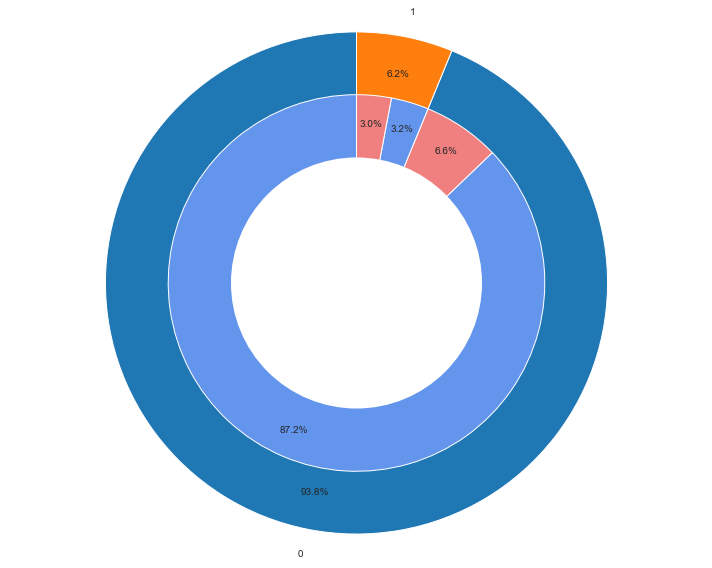

In [97]:
print('CD_Account')
labels = train_df['CD_Account'].value_counts().sort_index().index
sizes = train_df['CD_Account'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['CD_Account','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

Online


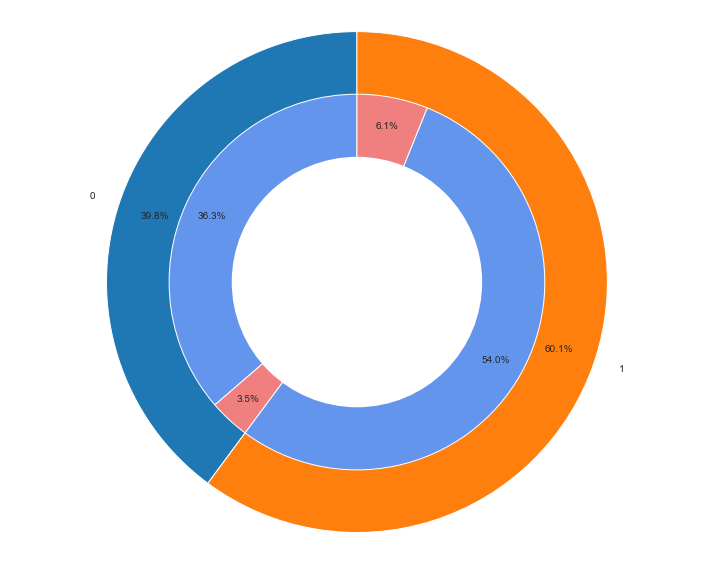

In [98]:
print('Online')
labels = train_df['Online'].value_counts().sort_index().index
sizes = train_df['Online'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['Online','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

CreditCard


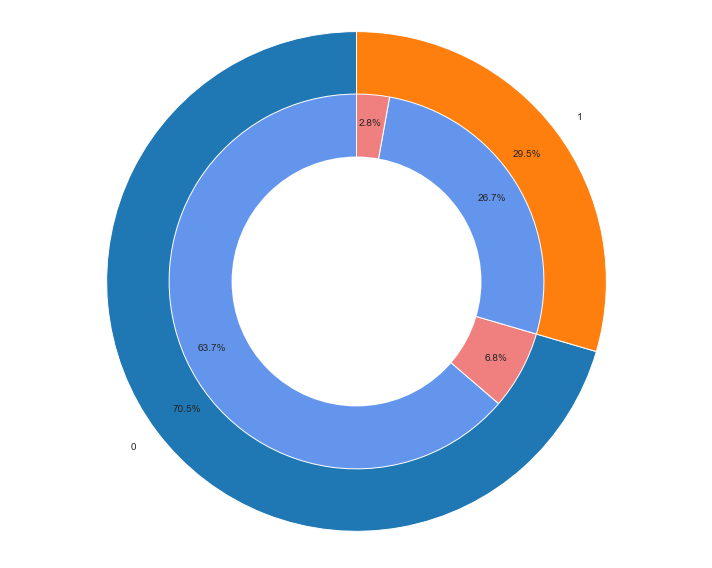

In [99]:
print('CreditCard')
labels = train_df['CreditCard'].value_counts().sort_index().index
sizes = train_df['CreditCard'].value_counts().sort_index().values
#labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['CreditCard','target'])['target'].count().values
#colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

### Observation :

1. From above we can clearly observe that the chances of getting appliying for pernonal is high for the customers who has CD_Account

In [100]:
discrete_features

['Family',
 'Education',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

Family


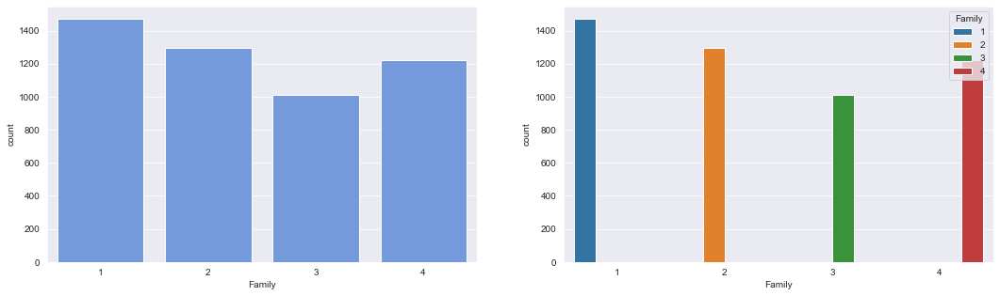

Education


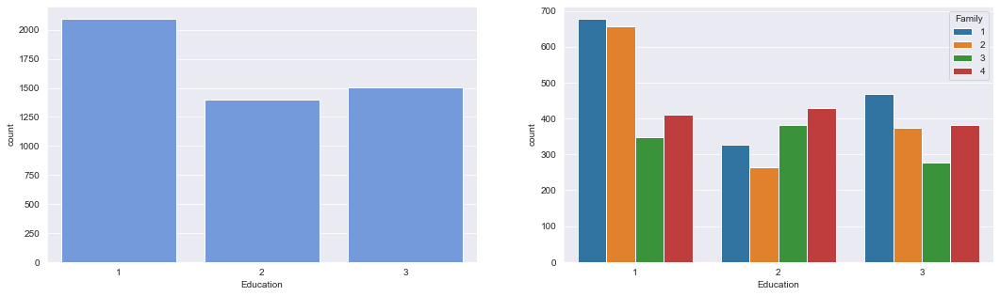

Securities_Account


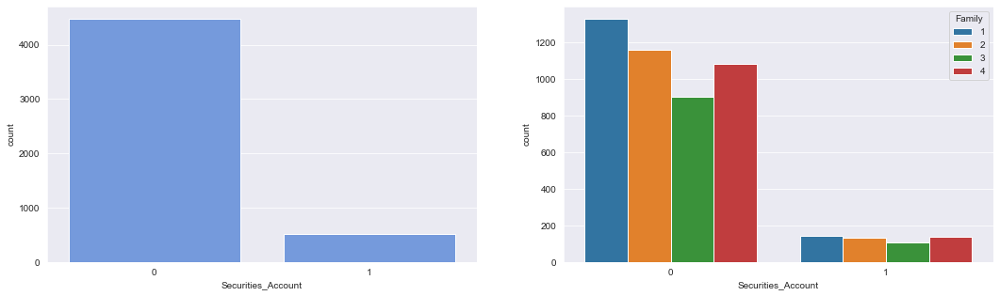

CD_Account


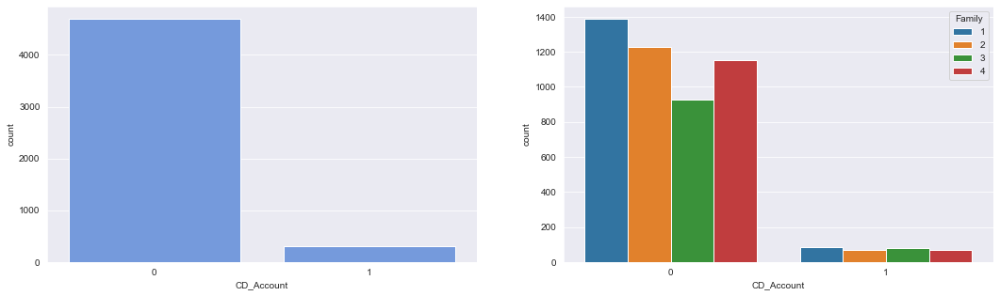

Online


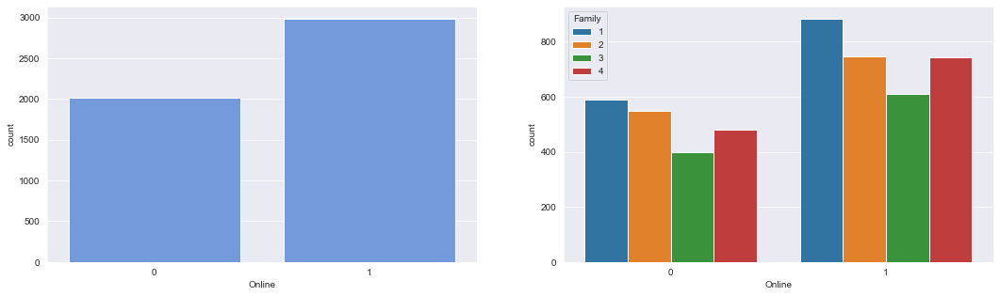

CreditCard


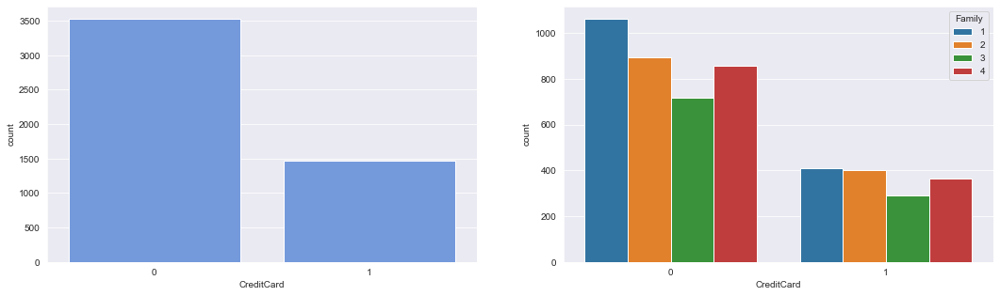

In [101]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Family")
    plt.show()

Family


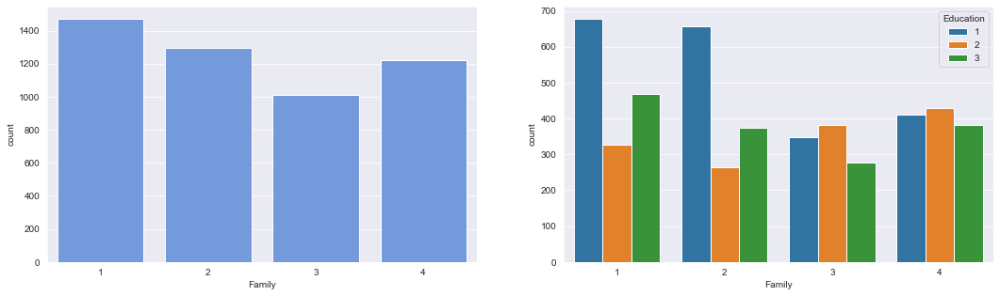

Education


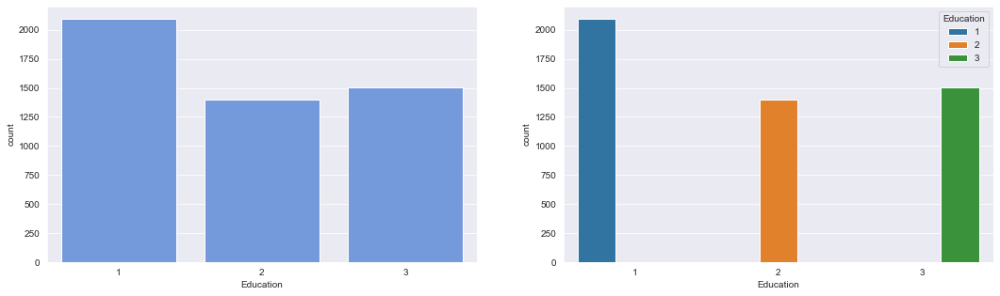

Securities_Account


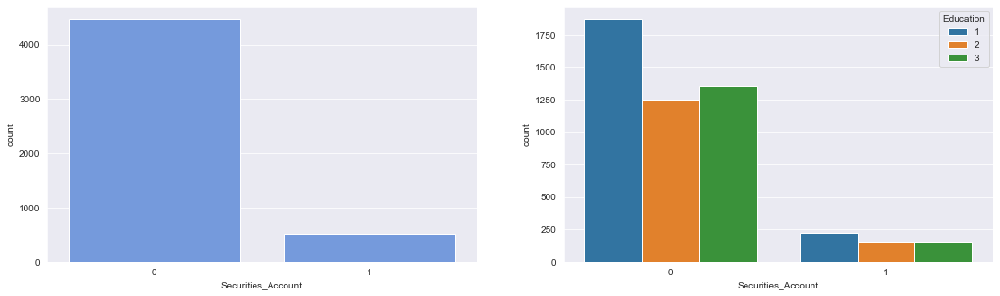

CD_Account


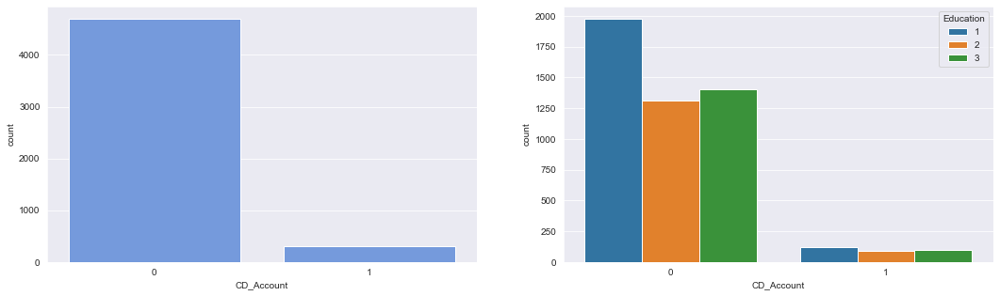

Online


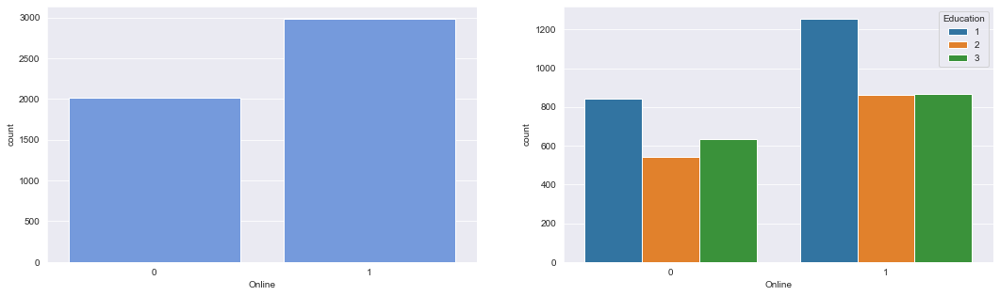

CreditCard


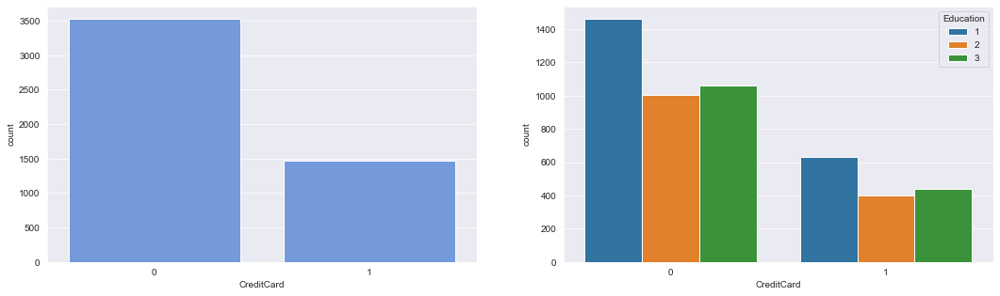

In [102]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Education")
    plt.show()

Family


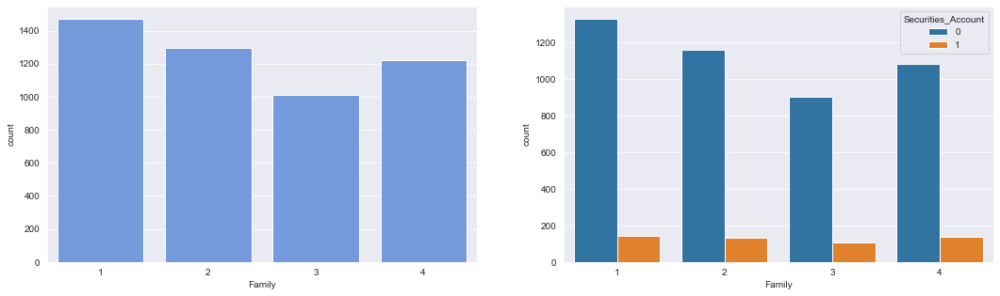

Education


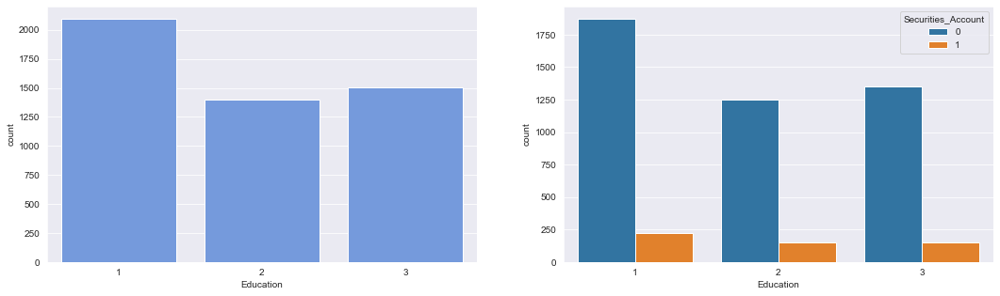

Securities_Account


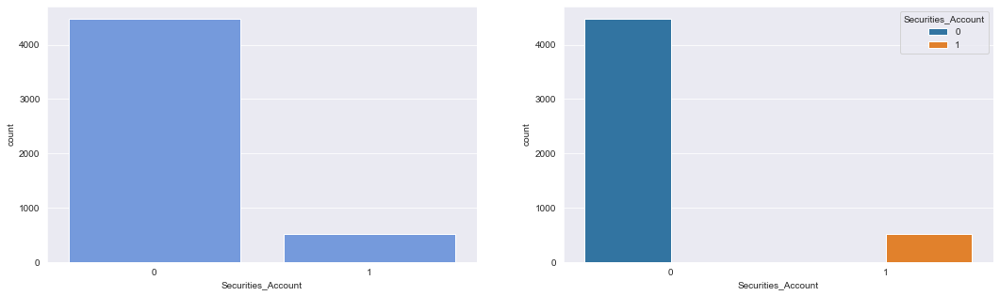

CD_Account


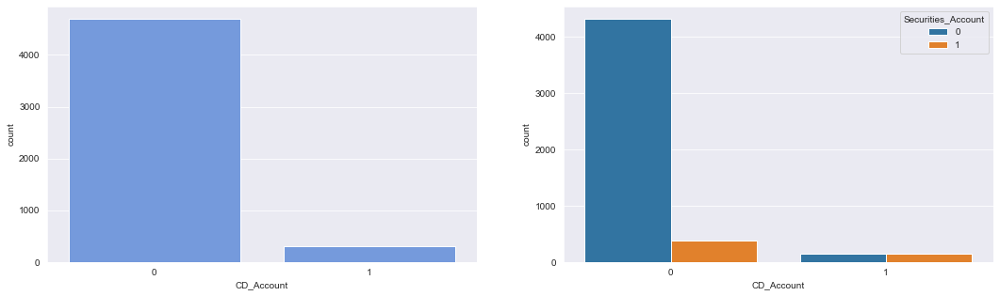

Online


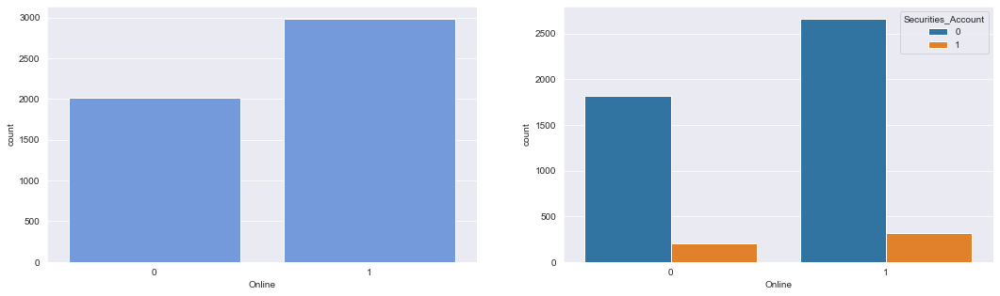

CreditCard


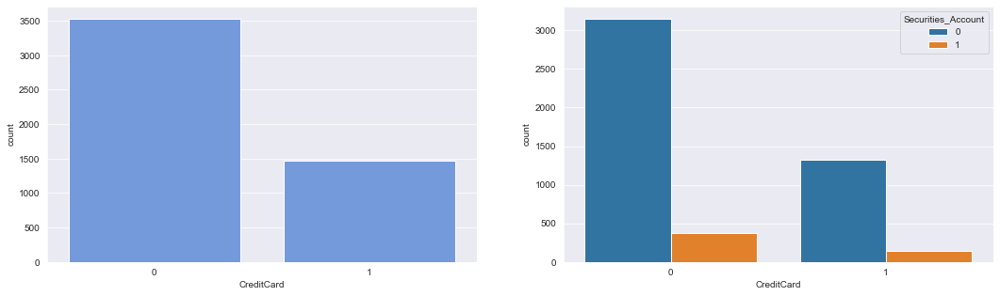

In [103]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Securities_Account")
    plt.show()

Family


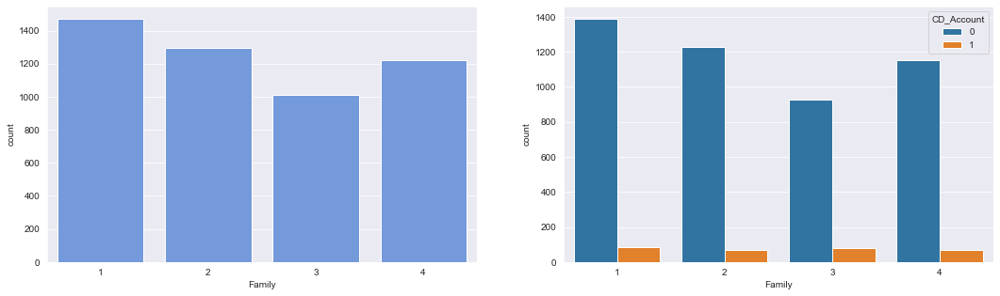

Education


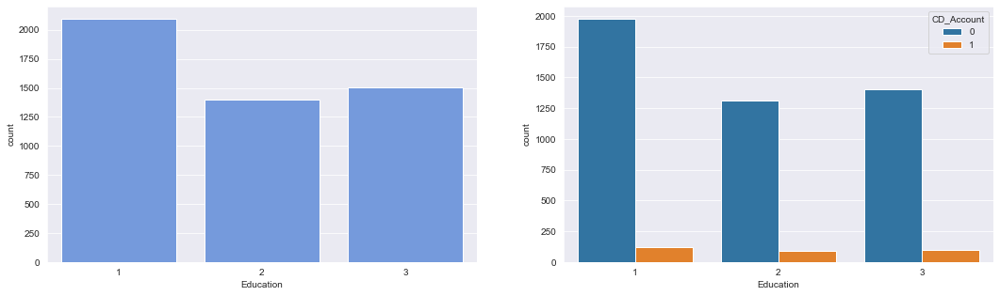

Securities_Account


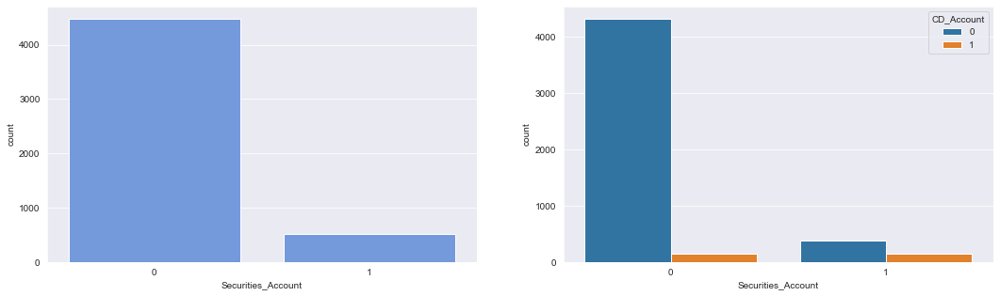

CD_Account


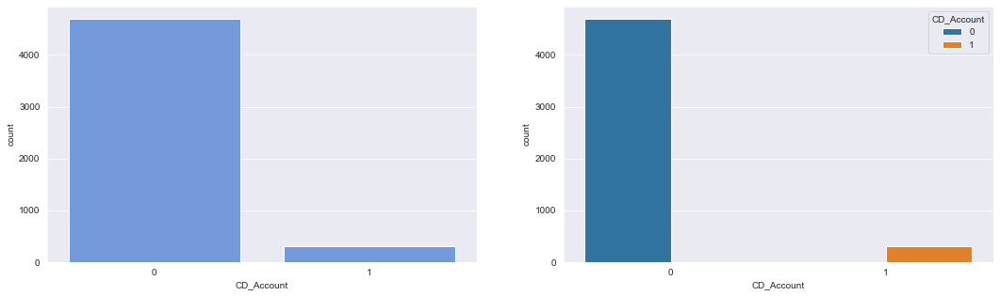

Online


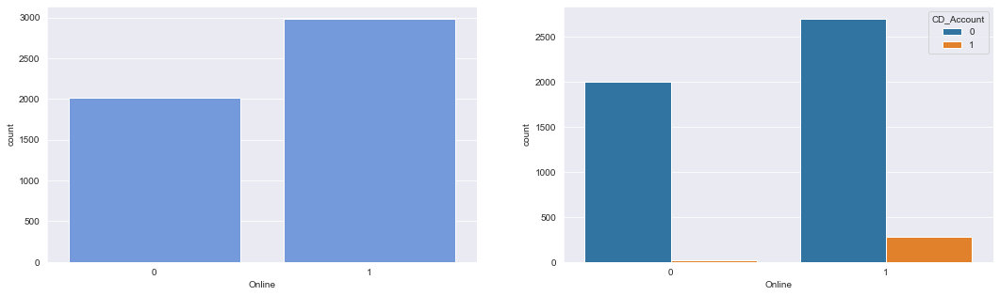

CreditCard


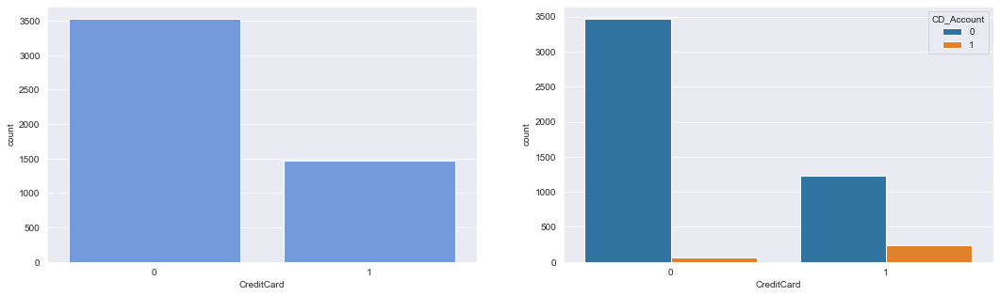

In [104]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="CD_Account")
    plt.show()

Family


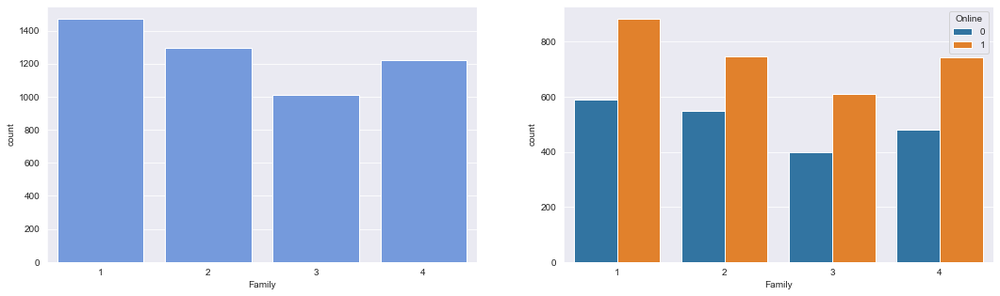

Education


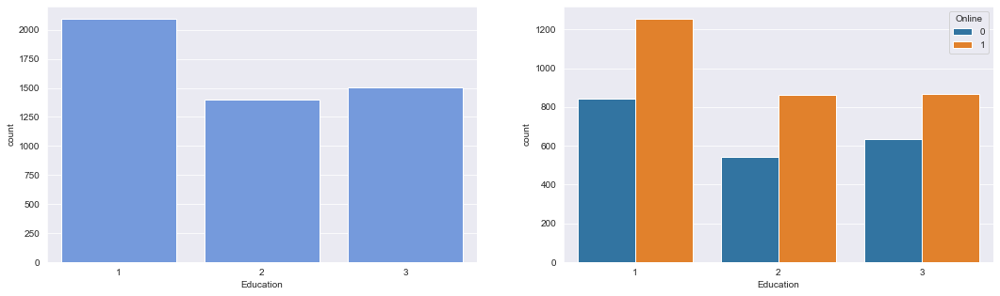

Securities_Account


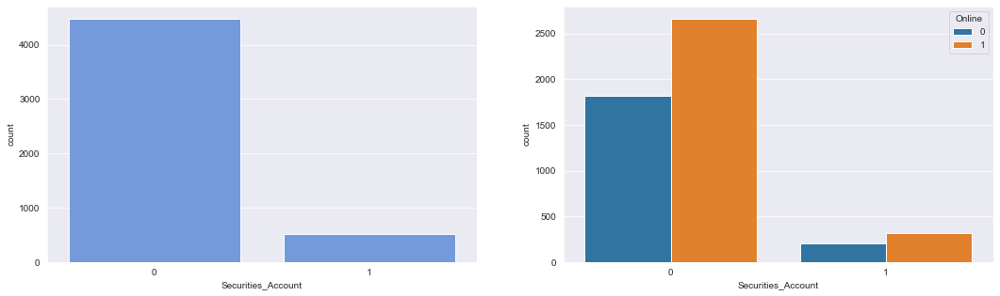

CD_Account


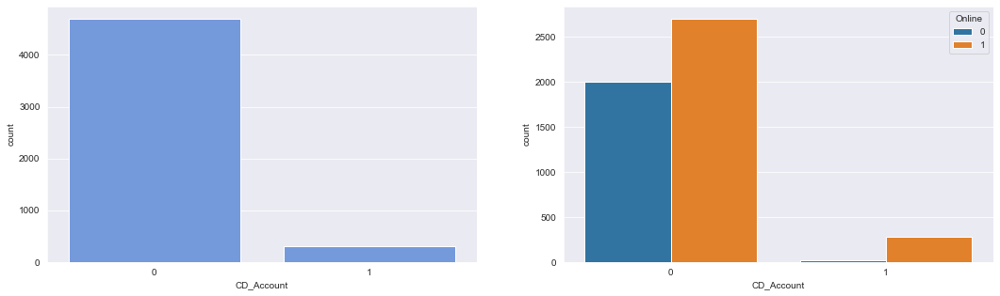

Online


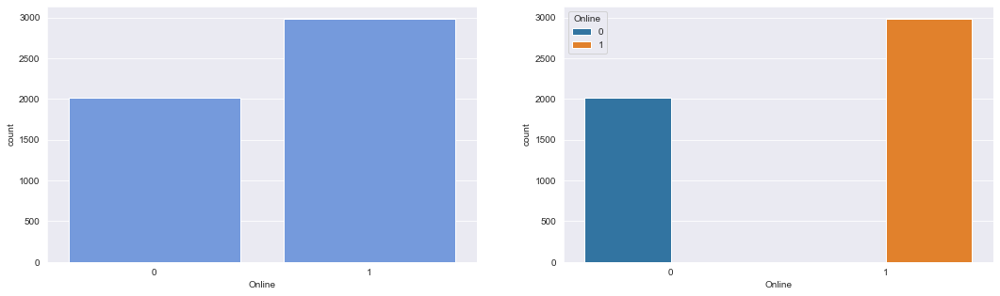

CreditCard


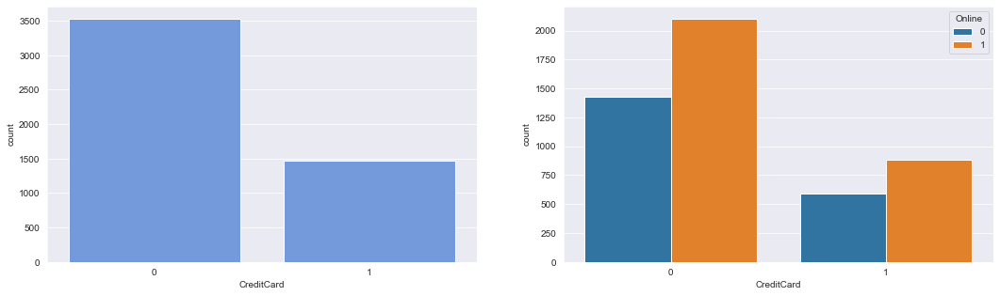

In [105]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Online")
    plt.show()

Family


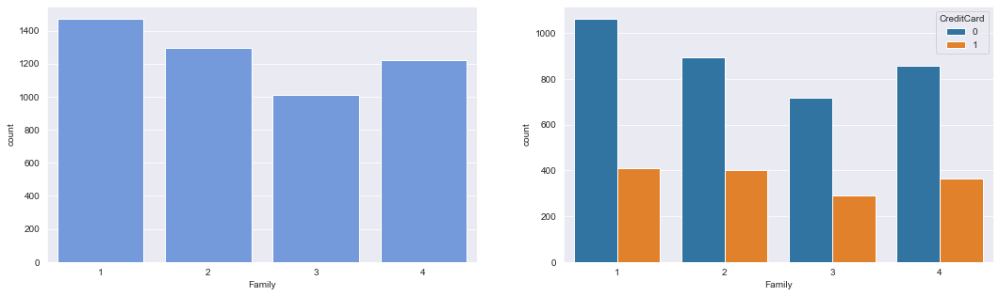

Education


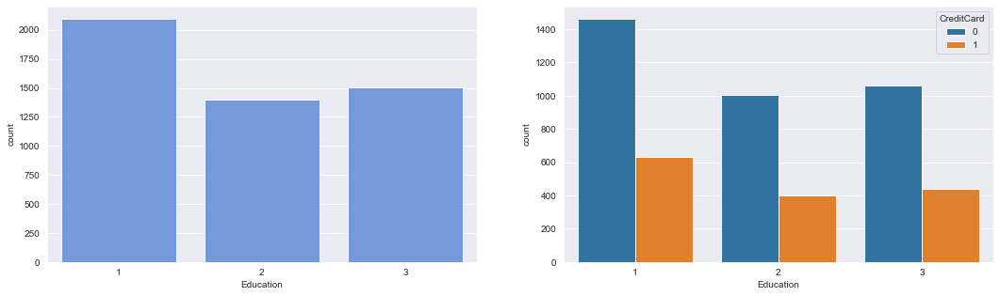

Securities_Account


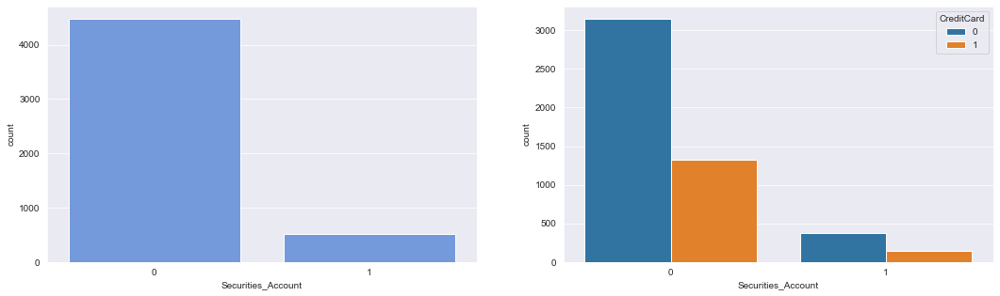

CD_Account


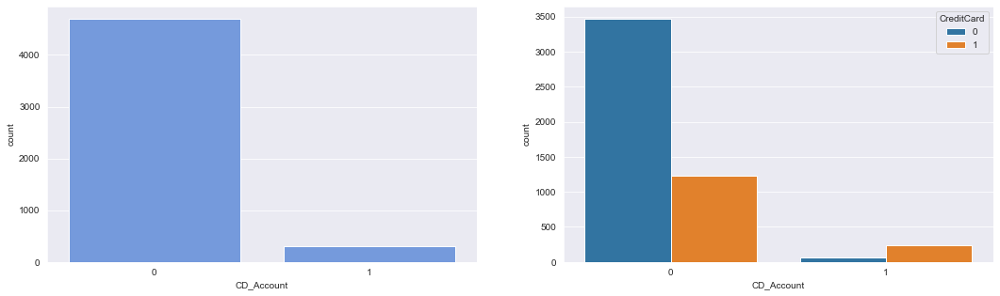

Online


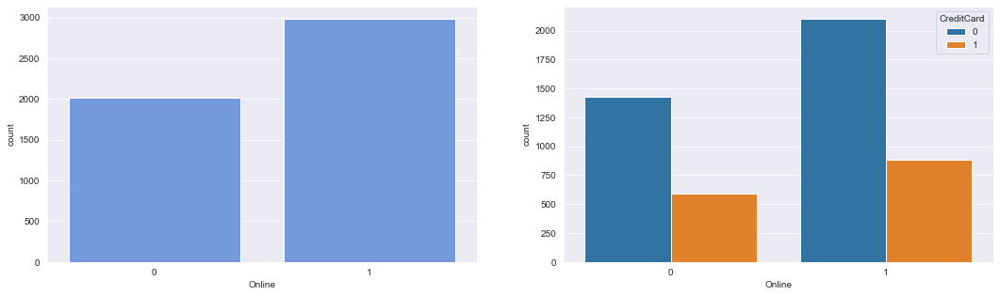

CreditCard


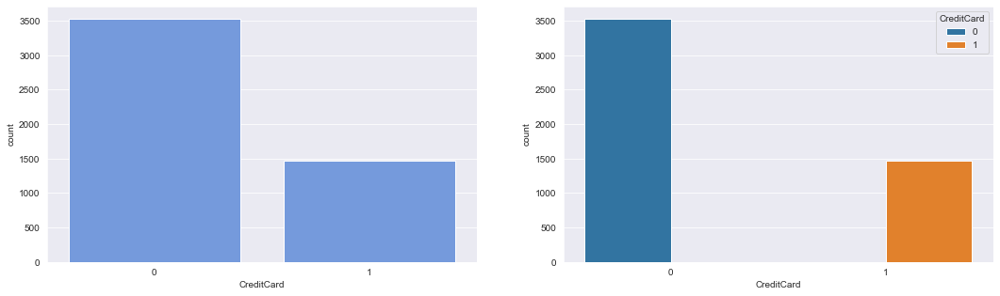

In [106]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="CreditCard")
    plt.show()

In [107]:
continuous_features

['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']

In [108]:
discrete_features

['Family',
 'Education',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

In [109]:
from num2words import num2words

In [110]:
data = train_df.copy()

In [111]:
data

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 4000 non-null   int64  
 1   Experience          4000 non-null   int64  
 2   Income              4000 non-null   int64  
 3   ZIP_Code            4000 non-null   object 
 4   Family              4000 non-null   int64  
 5   CCAvg               4000 non-null   float64
 6   Education           4000 non-null   int64  
 7   Mortgage            4000 non-null   int64  
 8   target              4000 non-null   int64  
 9   Securities_Account  4000 non-null   int64  
 10  CD_Account          4000 non-null   int64  
 11  Online              4000 non-null   int64  
 12  CreditCard          4000 non-null   int64  
dtypes: float64(1), int64(11), object(1)
memory usage: 406.4+ KB


In [113]:
for col in discrete_features:
    data[col] = data[col].apply(lambda x: num2words(x))

In [114]:
data

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,three,1.5,one,0,0,one,zero,zero,zero
1,39,15,11,94720,one,1.0,one,0,0,zero,zero,zero,zero
2,35,9,100,94112,one,2.7,two,0,0,zero,zero,zero,zero
3,35,8,45,91330,four,1.0,two,0,0,zero,zero,zero,one
4,37,13,29,92121,four,0.4,two,155,0,zero,zero,one,zero
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,three,2.0,three,0,0,zero,zero,one,zero
3996,30,4,15,92037,four,0.4,one,85,0,zero,zero,one,zero
3997,63,39,24,93023,two,0.3,three,0,0,zero,zero,zero,zero
3998,65,40,49,90034,three,0.5,two,0,0,zero,zero,one,zero


In [115]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 4000 non-null   int64  
 1   Experience          4000 non-null   int64  
 2   Income              4000 non-null   int64  
 3   ZIP_Code            4000 non-null   object 
 4   Family              4000 non-null   object 
 5   CCAvg               4000 non-null   float64
 6   Education           4000 non-null   object 
 7   Mortgage            4000 non-null   int64  
 8   target              4000 non-null   int64  
 9   Securities_Account  4000 non-null   object 
 10  CD_Account          4000 non-null   object 
 11  Online              4000 non-null   object 
 12  CreditCard          4000 non-null   object 
dtypes: float64(1), int64(5), object(7)
memory usage: 406.4+ KB


In [116]:
discrete_features

['Family',
 'Education',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

In [117]:
train_df[discrete_features].nunique()

Family                4
Education             3
Securities_Account    2
CD_Account            2
Online                2
CreditCard            2
dtype: int64

Age


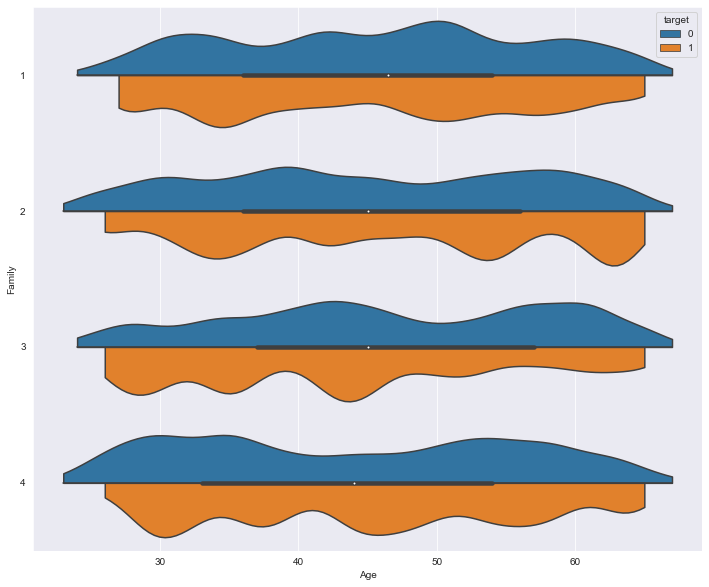

Experience


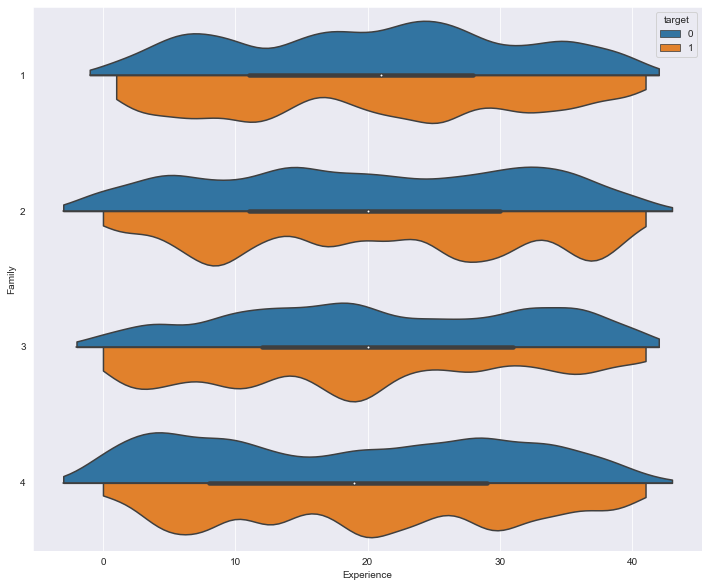

Income


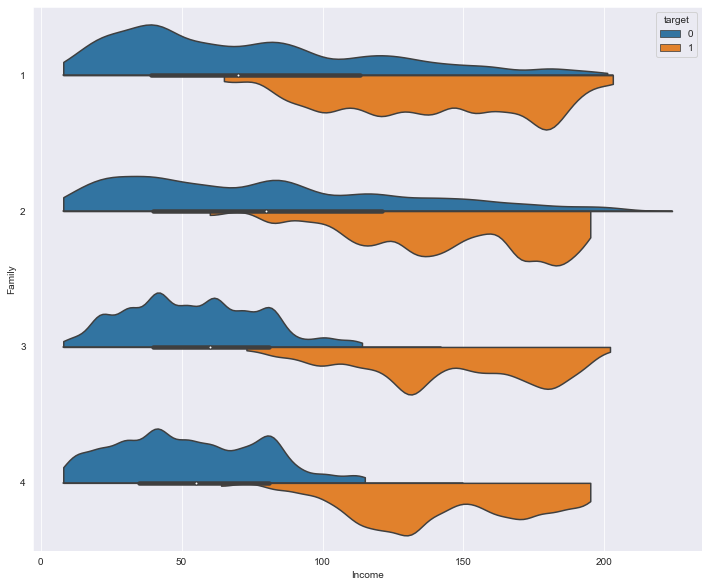

CCAvg


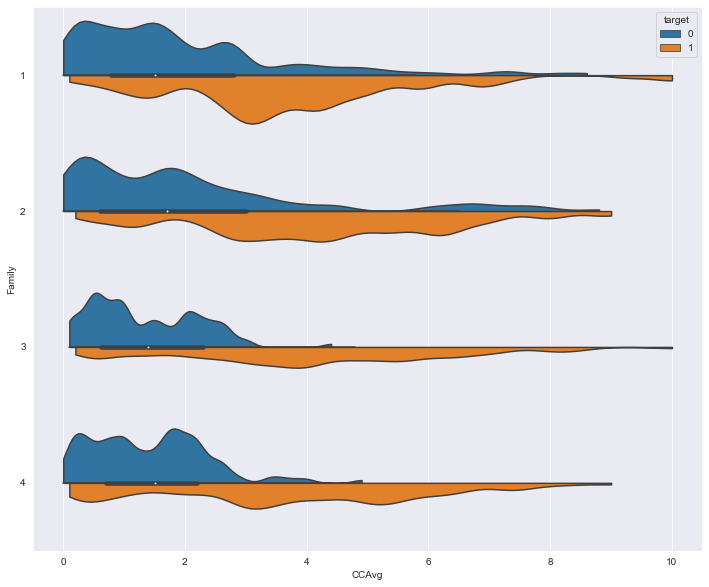

Mortgage


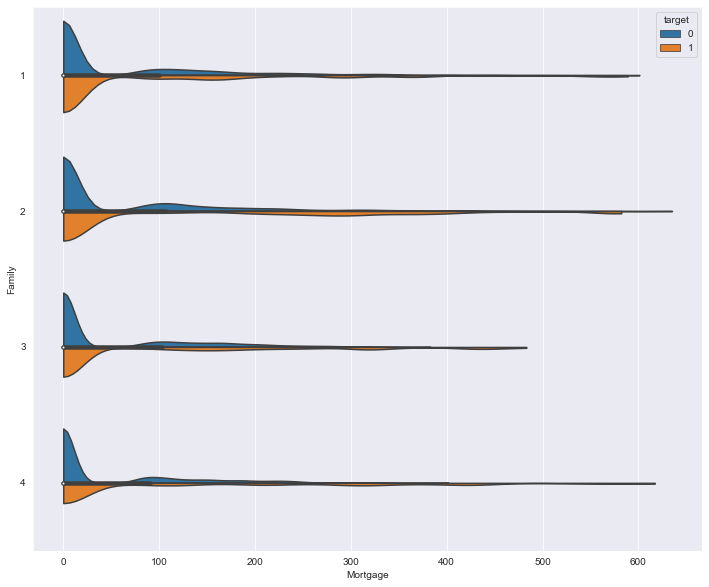

In [118]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,10))
    sns.violinplot(data=train_df, x=col, y="Family", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Family')
    plt.show()

Age


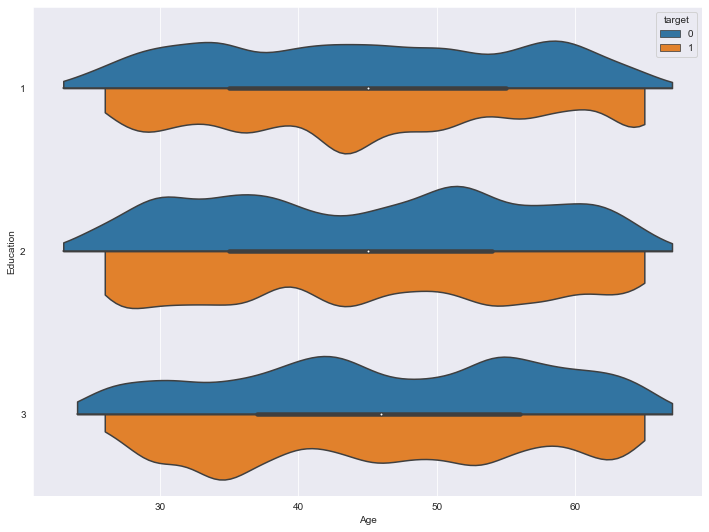

Experience


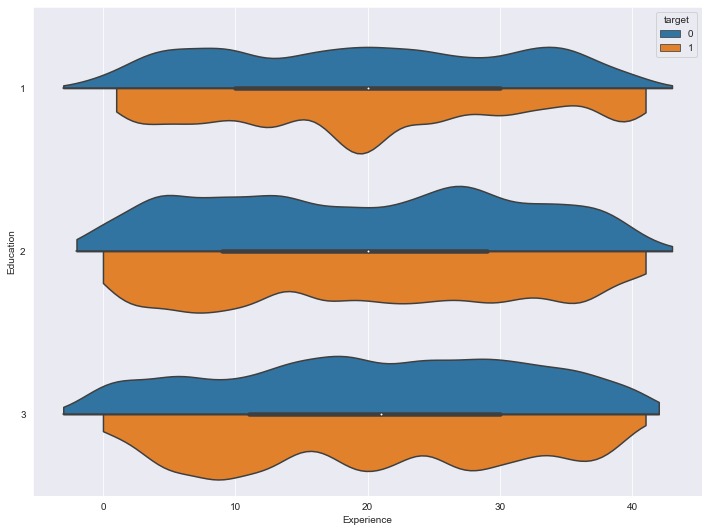

Income


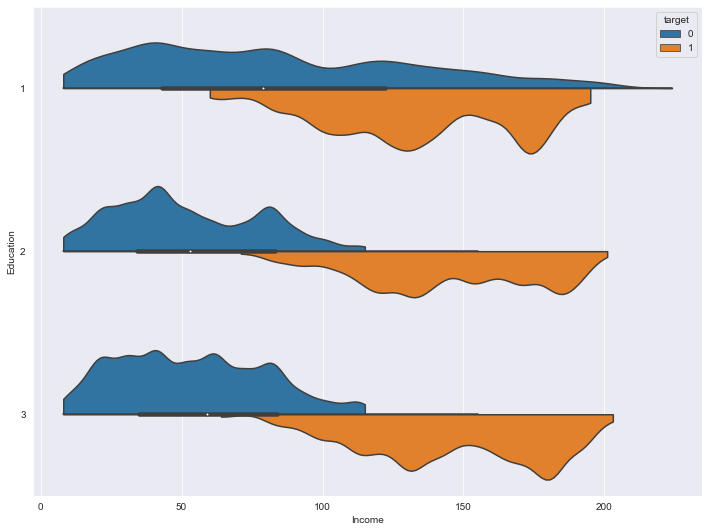

CCAvg


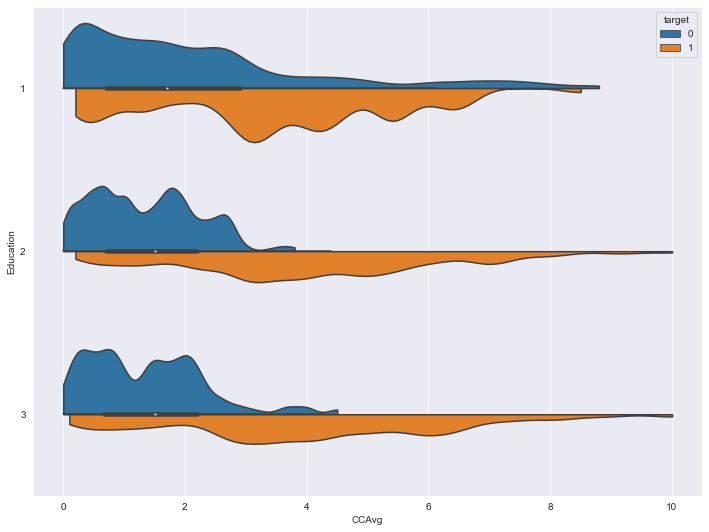

Mortgage


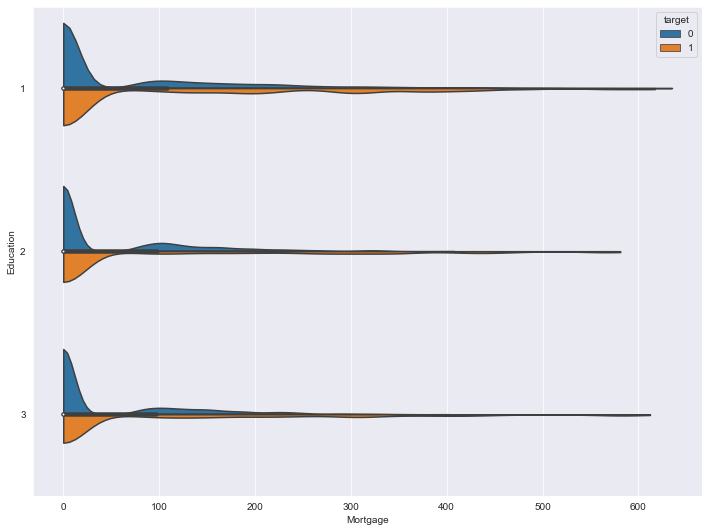

In [119]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="Education", hue="target", split=True,orient='h',bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Education')
    plt.show()

Age


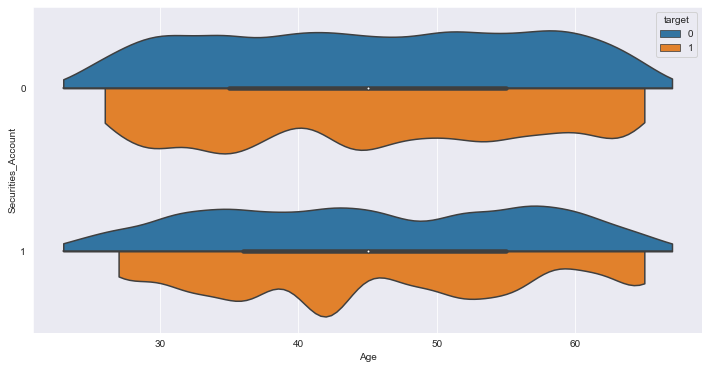

Experience


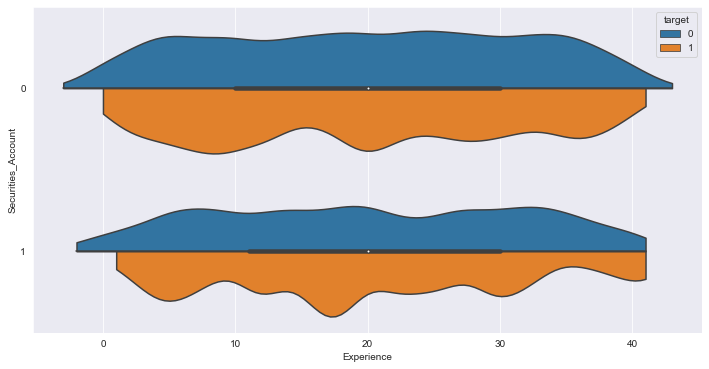

Income


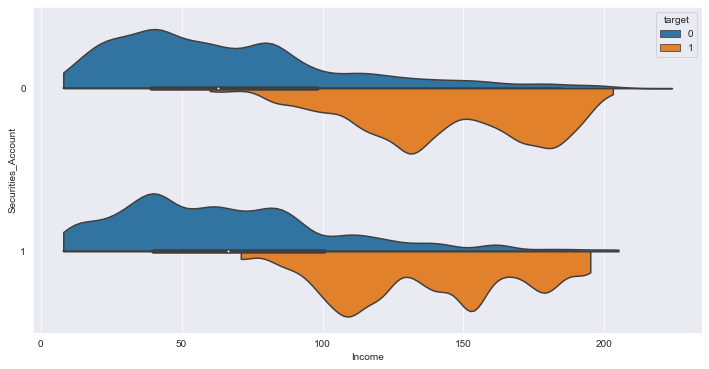

CCAvg


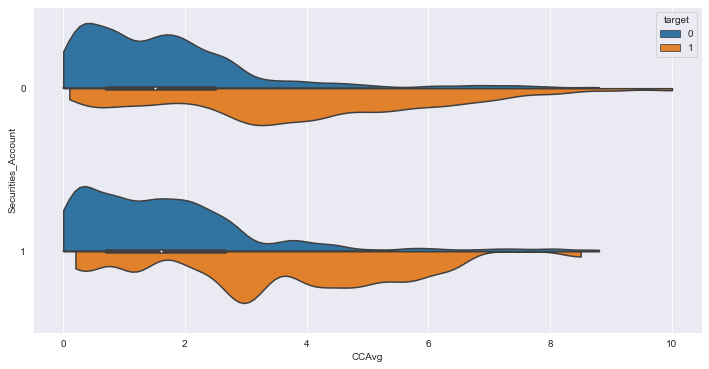

Mortgage


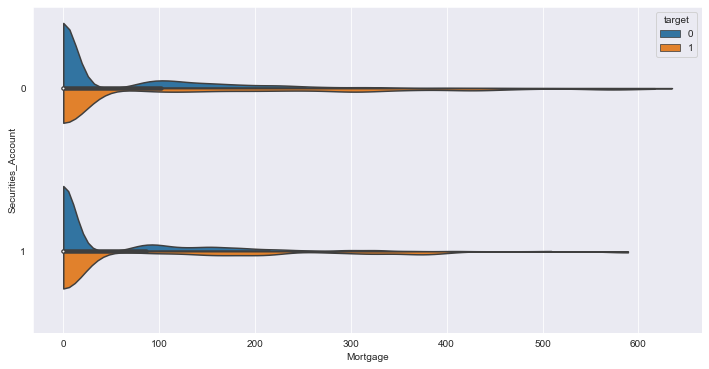

In [120]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="Securities_Account", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Securities_Account')
    plt.show()

Age


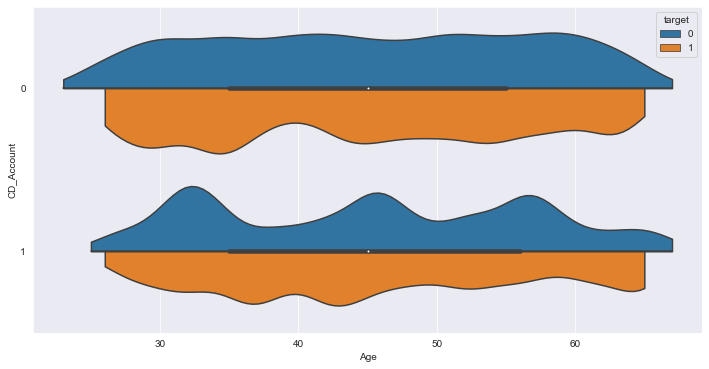

Experience


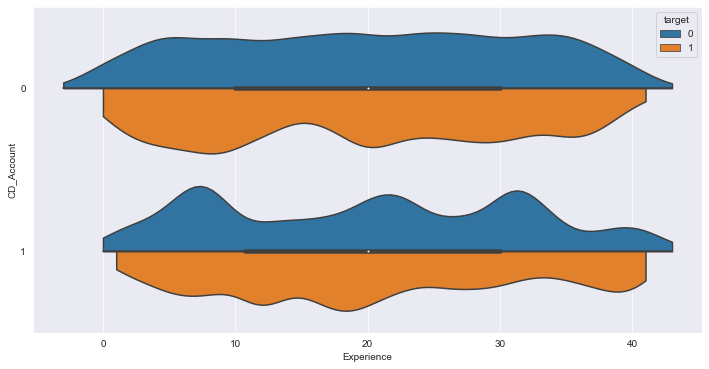

Income


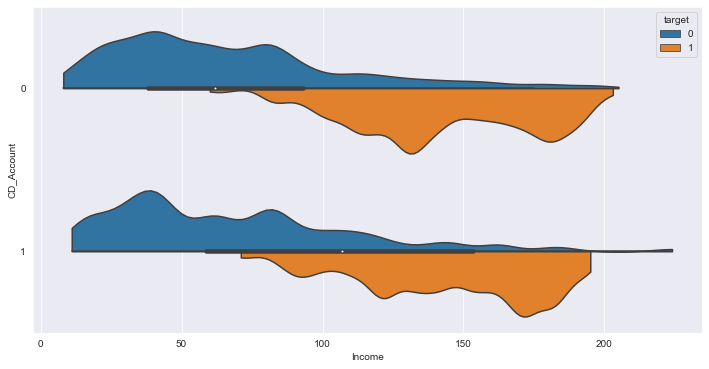

CCAvg


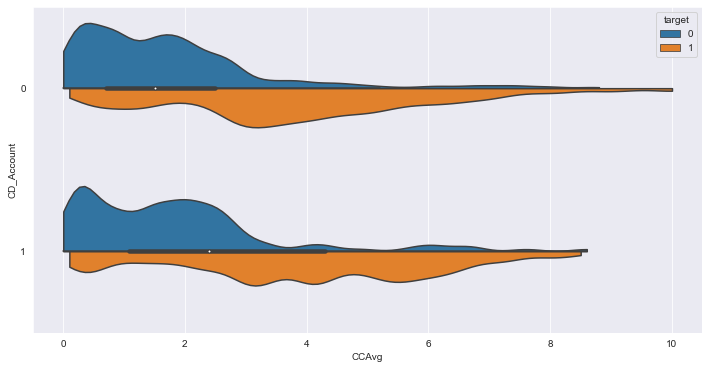

Mortgage


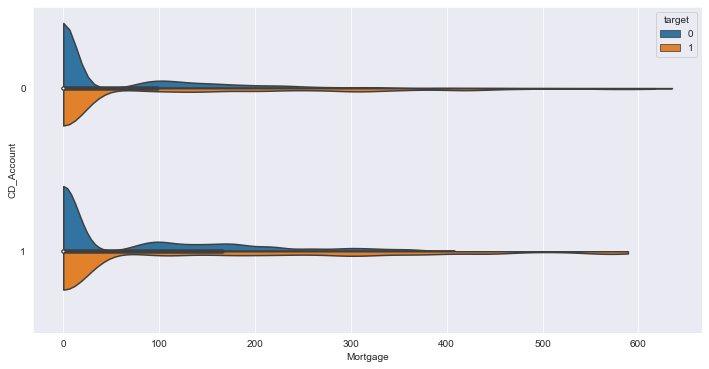

In [121]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="CD_Account", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('CD_Account')
    plt.show()

Age


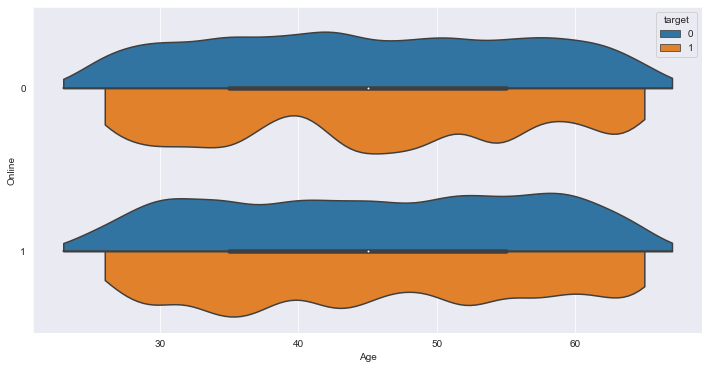

Experience


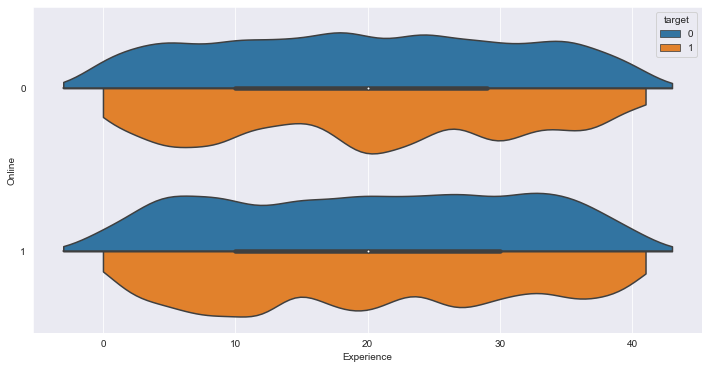

Income


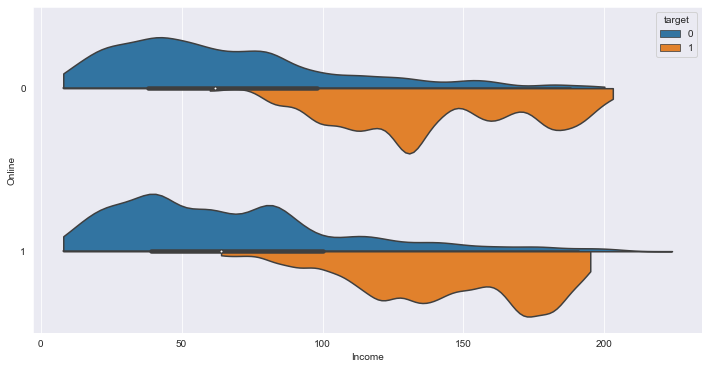

CCAvg


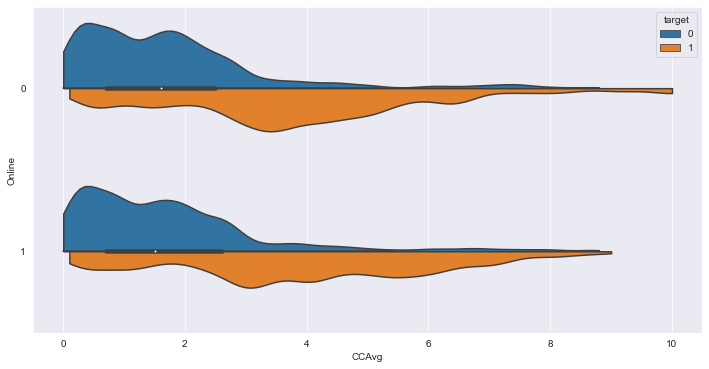

Mortgage


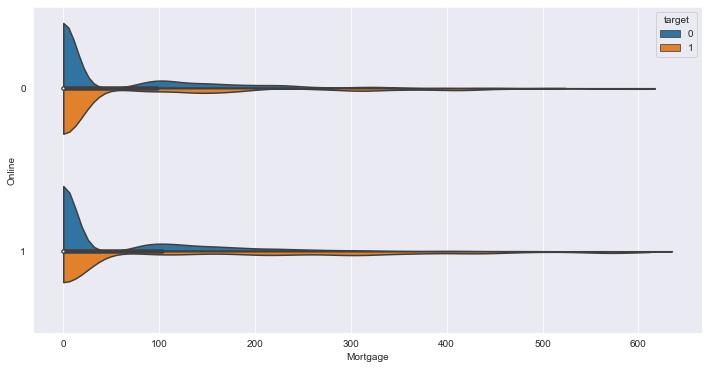

In [122]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="Online", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Online')
    plt.show()

Age


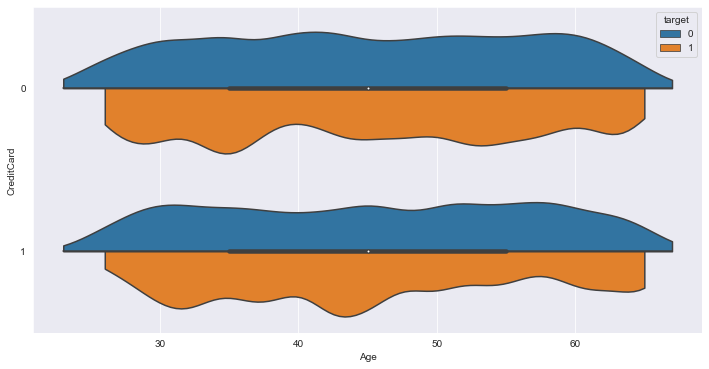

Experience


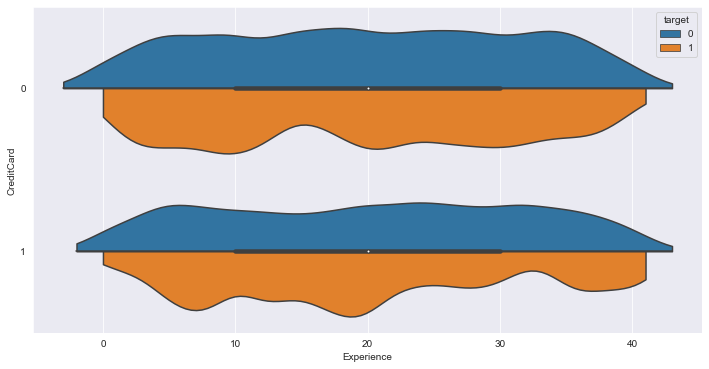

Income


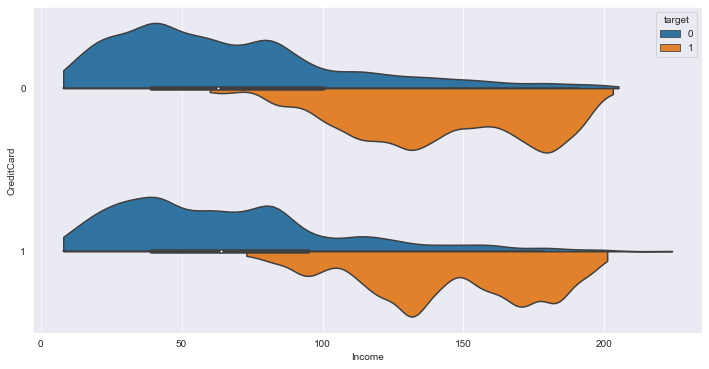

CCAvg


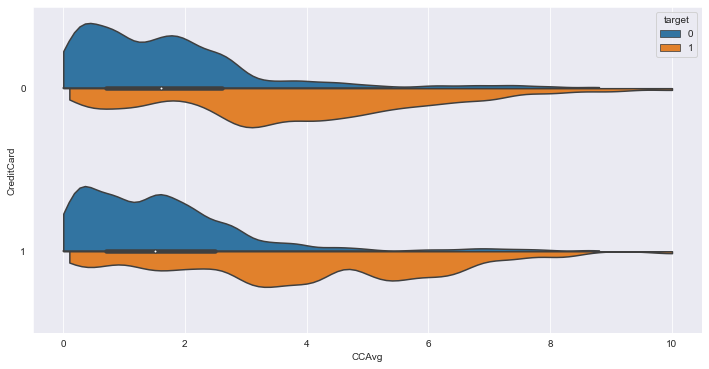

Mortgage


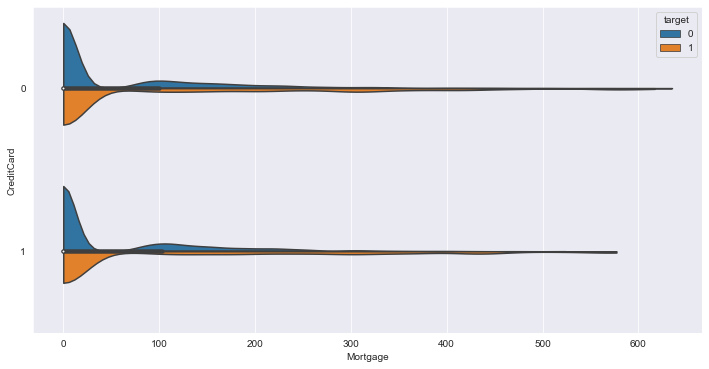

In [123]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="CreditCard", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('CreditCard')
    plt.show()

In [124]:
numerical_features

Index(['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'target', 'Securities_Account', 'CD_Account',
       'Online', 'CreditCard'],
      dtype='object')

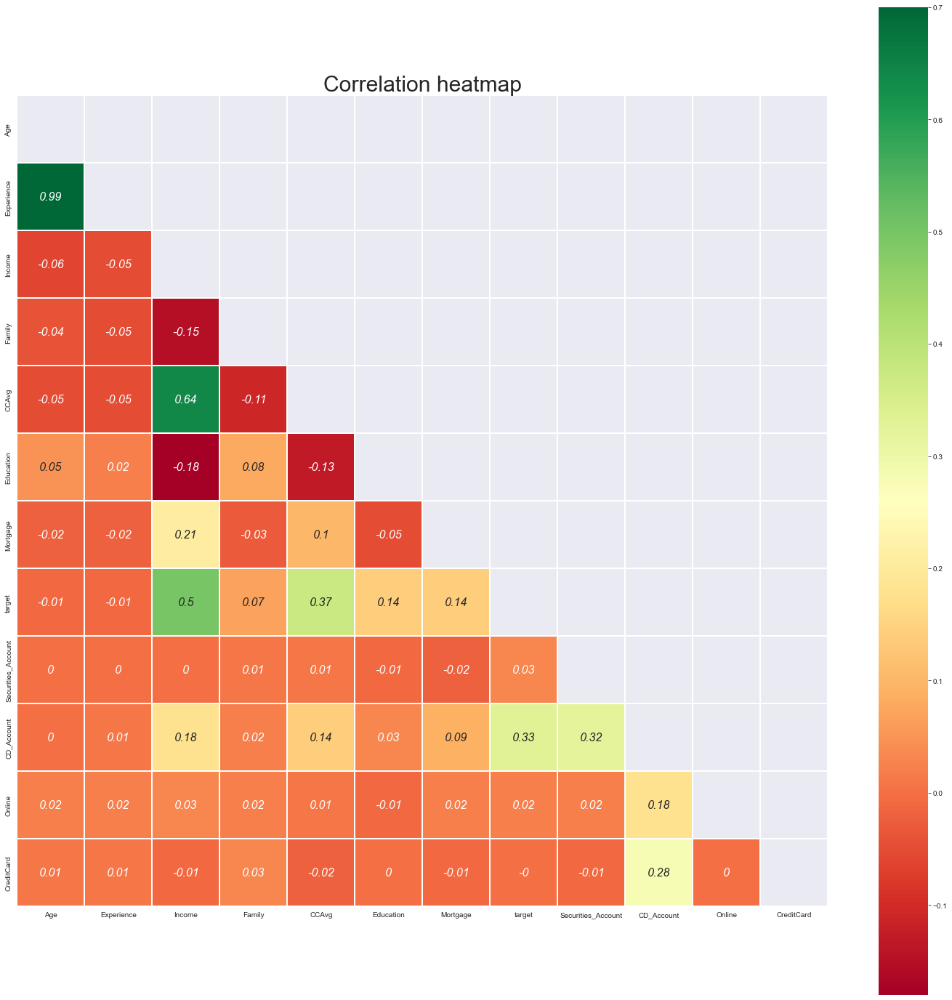

In [125]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is positive correlation between ['Income','CCAvg','CD_Account'] and 'target'

### Multicollinearity

4. there is clear exists the Multicollinearity

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

In [126]:
train_df.niohfldugic()

AttributeError: 'DataFrame' object has no attribute 'niohfldugic'

In [127]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [128]:
val_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,58,32,65,90266,3,2.20,3,0,0,0,0,0,0
1,55,29,79,92373,3,0.80,1,0,0,0,0,1,1
2,51,27,62,94063,2,3.20,3,118,0,0,0,0,1
3,39,15,62,93955,3,2.33,1,131,0,0,1,1,1
4,31,5,18,94111,4,0.30,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,40,14,74,90245,4,1.40,2,0,0,0,0,1,0
496,28,4,88,94024,1,5.40,1,0,0,0,0,1,0
497,52,26,158,94920,2,3.70,3,251,1,0,0,0,1
498,37,11,69,91911,3,2.10,1,0,0,1,0,0,0


In [129]:
test_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,46,20,158,90064,1,2.4,1,0,0,0,0,1,1
1,60,35,8,94143,1,0.1,1,0,0,0,0,1,0
2,54,28,159,90245,2,0.5,1,461,0,0,0,1,0
3,44,19,61,94080,3,2.7,2,0,0,0,0,0,0
4,53,28,31,90245,4,0.1,3,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
496,32,8,78,90401,4,0.1,2,0,0,0,0,1,0
497,63,39,72,93106,3,2.0,3,190,0,1,0,1,0
498,27,2,45,94305,2,1.7,2,0,0,0,0,0,1


In [130]:
# writing the train_df to a file

train_df.to_csv('../Data/Bank_Prsonal_Loan_signup_modelling/train_df.csv',index=False)

In [131]:
# writing the val_df to a file

val_df.to_csv('../Data/Bank_Prsonal_Loan_signup_modelling/val_df.csv',index=False)

In [132]:
# writing the test_df to a file

test_df.to_csv('../Data/Bank_Prsonal_Loan_signup_modelling/test_df.csv',index=False)

# Feature Engineering

In [133]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [134]:
train_df = pd.read_csv('../Data/Bank_Prsonal_Loan_signup_modelling/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [135]:
val_df = pd.read_csv('../Data/Bank_Prsonal_Loan_signup_modelling/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [136]:
test_df = pd.read_csv('../Data/Bank_Prsonal_Loan_signup_modelling/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [137]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [138]:
val_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,58,32,65,90266,3,2.20,3,0,0,0,0,0,0
1,55,29,79,92373,3,0.80,1,0,0,0,0,1,1
2,51,27,62,94063,2,3.20,3,118,0,0,0,0,1
3,39,15,62,93955,3,2.33,1,131,0,0,1,1,1
4,31,5,18,94111,4,0.30,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,40,14,74,90245,4,1.40,2,0,0,0,0,1,0
496,28,4,88,94024,1,5.40,1,0,0,0,0,1,0
497,52,26,158,94920,2,3.70,3,251,1,0,0,0,1
498,37,11,69,91911,3,2.10,1,0,0,1,0,0,0


In [139]:
test_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,46,20,158,90064,1,2.4,1,0,0,0,0,1,1
1,60,35,8,94143,1,0.1,1,0,0,0,0,1,0
2,54,28,159,90245,2,0.5,1,461,0,0,0,1,0
3,44,19,61,94080,3,2.7,2,0,0,0,0,0,0
4,53,28,31,90245,4,0.1,3,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
496,32,8,78,90401,4,0.1,2,0,0,0,0,1,0
497,63,39,72,93106,3,2.0,3,190,0,1,0,1,0
498,27,2,45,94305,2,1.7,2,0,0,0,0,0,1


In [140]:
train_df['target'].value_counts(normalize=True)

0    0.904
1    0.096
Name: target, dtype: float64

In [141]:
numerical_features = ['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Securities_Account', 'CD_Account', 'Online',
       'CreditCard']

numerical_features

['Age',
 'Experience',
 'Income',
 'ZIP_Code',
 'Family',
 'CCAvg',
 'Education',
 'Mortgage',
 'Securities_Account',
 'CD_Account',
 'Online',
 'CreditCard']

In [142]:
categorical_features

Index([], dtype='object')

In [143]:
len(numerical_features)

12

In [144]:
len(categorical_features)

0

In [145]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [146]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Age', 'Experience',
                                                   'Income', 'ZIP_Code',
                                                   'Family', 'CCAvg',
                                                   'Education', 'Mortgage',
                                                   'Securities_Account',
                                                   'CD_Account', 'Online',
                                                   'CreditCard']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', RobustScaler())])

In [147]:
X_train

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,1,0


In [148]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
3995    0
3996    0
3997    0
3998    0
3999    0
Name: target, Length: 4000, dtype: int64

In [149]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [150]:
X_train_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.0,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.0,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.0,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.0,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,1.377915,1.533025,0.169189,0.457764,0.103505,0.289739,0.485345,0.000000,0.000000,0.0,0.0,0.0
3996,-0.881254,-0.956178,-1.280189,-0.436566,0.959519,-0.723641,-0.514655,0.980866,0.000000,0.0,0.0,0.0
3997,1.215660,1.362699,-0.882052,-0.069863,0.000000,-0.867910,0.485345,0.000000,0.000000,0.0,-1.0,0.0
3998,1.600503,1.533025,-0.244890,-1.408157,0.103505,-0.622259,0.000000,0.000000,0.000000,0.0,0.0,0.0


In [151]:
y_train.value_counts()

0    3616
1     384
Name: target, dtype: int64

In [152]:
X_val

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
0,58,32,65,90266,3,2.20,3,0,0,0,0,0
1,55,29,79,92373,3,0.80,1,0,0,0,1,1
2,51,27,62,94063,2,3.20,3,118,0,0,0,1
3,39,15,62,93955,3,2.33,1,131,0,1,1,1
4,31,5,18,94111,4,0.30,2,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
495,40,14,74,90245,4,1.40,2,0,0,0,1,0
496,28,4,88,94024,1,5.40,1,0,0,0,1,0
497,52,26,158,94920,2,3.70,3,251,0,0,0,1
498,37,11,69,91911,3,2.10,1,0,1,0,0,0


In [153]:
y_val

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    1
498    0
499    0
Name: target, Length: 500, dtype: int64

In [154]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [155]:
X_val_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.696616,0.631299,0.040353,-0.972000,0.103505,0.400689,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
1,0.496527,0.456011,0.214652,-0.242250,0.103505,-0.380384,-0.514655,0.000000,0.000000,0.000000,0.0,1.0
2,0.275865,0.344042,-0.016892,0.129071,0.000000,0.793764,0.485345,1.022770,0.000000,0.000000,-1.0,1.0
3,-0.294458,-0.245963,-0.016892,0.060545,0.103505,0.458421,-0.514655,1.037494,0.000000,10.398675,0.0,1.0
4,-0.784886,-0.848814,-1.218586,0.187184,0.959519,-0.867910,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.245972,-0.292865,0.150988,-1.015152,0.959519,-0.059535,0.000000,0.000000,0.000000,0.000000,0.0,0.0
496,-1.109494,-0.956178,0.390439,0.093297,-0.896495,1.233016,-0.514655,0.000000,0.000000,0.000000,0.0,0.0
497,0.330610,0.293079,1.099731,0.676873,0.000000,0.896728,0.485345,1.152831,0.000000,0.000000,-1.0,1.0
498,-0.394819,-0.434829,0.072323,-0.497693,0.103505,0.352344,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0


In [156]:
X_test

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
0,46,20,158,90064,1,2.4,1,0,0,0,1,1
1,60,35,8,94143,1,0.1,1,0,0,0,1,0
2,54,28,159,90245,2,0.5,1,461,0,0,1,0
3,44,19,61,94080,3,2.7,2,0,0,0,0,0
4,53,28,31,90245,4,0.1,3,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,25,1,49,91107,4,1.6,1,0,1,0,0,0
496,32,8,78,90401,4,0.1,2,0,0,0,1,0
497,63,39,72,93106,3,2.0,3,190,1,0,1,0
498,27,2,45,94305,2,1.7,2,0,0,0,0,1


In [157]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [158]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [159]:
X_test_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.047808,0.000000,1.099731,-1.267499,-0.896495,0.484712,-0.514655,0.000000,0.000000,0.0,0.0,1.0
1,0.871361,0.874498,-3.880702,0.243539,-0.896495,-1.344299,-0.514655,0.000000,0.000000,0.0,0.0,0.0
2,0.438486,0.399905,1.110753,-1.015152,0.000000,-0.622259,-0.514655,1.305220,0.000000,0.0,0.0,0.0
3,-0.045089,-0.051909,-0.036615,0.141376,0.103505,0.634544,0.000000,0.000000,0.000000,0.0,-1.0,0.0
4,0.384060,0.399905,-0.685114,-1.015152,0.959519,-1.344299,0.485345,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,-1.619564,-1.333123,-0.244890,-0.756670,0.959519,0.056432,-0.514655,0.000000,10.398675,0.0,-1.0,0.0
496,-0.706541,-0.616932,0.191352,-0.913823,0.959519,-1.344299,0.000000,0.000000,0.000000,0.0,0.0,0.0
497,1.215660,1.362699,0.119570,-0.046540,0.103505,0.289739,0.485345,1.096774,10.398675,0.0,0.0,0.0
498,-1.246382,-1.202077,-0.288038,0.319665,0.000000,0.114956,0.000000,0.000000,0.000000,0.0,-1.0,1.0


In [160]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [161]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3616
           1       0.82      0.57      0.67       384

    accuracy                           0.95      4000
   macro avg       0.89      0.78      0.82      4000
weighted avg       0.94      0.95      0.94      4000

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       450
           1       0.90      0.54      0.68        50

    accuracy                           0.95       500
   macro avg       0.93      0.77      0.82       500
weighted avg       0.95      0.95      0.94       500

train_score :  0.94675
val_score :  0.948
RidgeClassifier
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3616
           1       0.87      0.27      0.41       384

    accuracy                           0.93      4000
   macro avg       0.90      0.63      0.69      40

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3616
           1       1.00      1.00      1.00       384

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       450
           1       0.98      0.94      0.96        50

    accuracy                           0.99       500
   macro avg       0.99      0.97      0.98       500
weighted avg       0.99      0.99      0.99       500

train_score :  1.0
val_score :  0.992


In [162]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.817488,0.946750,0.888012,0.778519,0.821914,0.948000
1,RidgeClassifier,0.682091,0.926000,0.900248,0.632040,0.685441,0.920000
2,SGDClassifier,0.801188,0.944750,0.860392,0.799525,0.826333,0.948000
3,SVC,0.794871,0.953000,0.940364,0.774993,0.834179,0.948000
4,GaussianNB,0.718532,0.917750,0.772177,0.692651,0.723378,0.914000
5,KNeighborsClassifier,0.804176,0.963250,0.948273,0.830706,0.878455,0.934000
6,DecisionTreeClassifier,0.942210,1.000000,1.000000,1.000000,1.000000,0.988000
7,RandomForestClassifier,0.953120,1.000000,1.000000,1.000000,1.000000,0.994000
8,AdaBoostClassifier,0.894791,0.971500,0.941999,0.887641,0.912566,0.960000
9,ExtraTreesClassifier,0.896618,1.000000,1.000000,1.000000,1.000000,0.974000


In [163]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
11,XGBClassifier,0.957118,1.0,1.0,1.0,1.0,0.992
10,GradientBoostingClassifier,0.954166,0.994,0.993012,0.972241,0.982345,0.988
7,RandomForestClassifier,0.95312,1.0,1.0,1.0,1.0,0.994
6,DecisionTreeClassifier,0.94221,1.0,1.0,1.0,1.0,0.988
9,ExtraTreesClassifier,0.896618,1.0,1.0,1.0,1.0,0.974
8,AdaBoostClassifier,0.894791,0.9715,0.941999,0.887641,0.912566,0.96
0,LogisticRegression,0.817488,0.94675,0.888012,0.778519,0.821914,0.948
5,KNeighborsClassifier,0.804176,0.96325,0.948273,0.830706,0.878455,0.934
2,SGDClassifier,0.801188,0.94475,0.860392,0.799525,0.826333,0.948
3,SVC,0.794871,0.953,0.940364,0.774993,0.834179,0.948


In [164]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
7,RandomForestClassifier,0.95312,1.0,1.0,1.0,1.0,0.994
11,XGBClassifier,0.957118,1.0,1.0,1.0,1.0,0.992
6,DecisionTreeClassifier,0.94221,1.0,1.0,1.0,1.0,0.988
10,GradientBoostingClassifier,0.954166,0.994,0.993012,0.972241,0.982345,0.988
9,ExtraTreesClassifier,0.896618,1.0,1.0,1.0,1.0,0.974
8,AdaBoostClassifier,0.894791,0.9715,0.941999,0.887641,0.912566,0.96
0,LogisticRegression,0.817488,0.94675,0.888012,0.778519,0.821914,0.948
2,SGDClassifier,0.801188,0.94475,0.860392,0.799525,0.826333,0.948
3,SVC,0.794871,0.953,0.940364,0.774993,0.834179,0.948
5,KNeighborsClassifier,0.804176,0.96325,0.948273,0.830706,0.878455,0.934


In [165]:
# writing results to a file

results.to_csv('../Data/Bank_Prsonal_Loan_signup_modelling/results.csv',index=False)

## Handling Imbalanced dataset

In [166]:
X_train_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.0,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.0,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.0,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.0,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,1.377915,1.533025,0.169189,0.457764,0.103505,0.289739,0.485345,0.000000,0.000000,0.0,0.0,0.0
3996,-0.881254,-0.956178,-1.280189,-0.436566,0.959519,-0.723641,-0.514655,0.980866,0.000000,0.0,0.0,0.0
3997,1.215660,1.362699,-0.882052,-0.069863,0.000000,-0.867910,0.485345,0.000000,0.000000,0.0,-1.0,0.0
3998,1.600503,1.533025,-0.244890,-1.408157,0.103505,-0.622259,0.000000,0.000000,0.000000,0.0,0.0,0.0


In [167]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
3995    0
3996    0
3997    0
3998    0
3999    0
Name: target, Length: 4000, dtype: int64

In [168]:
y_train.value_counts()

0    3616
1     384
Name: target, dtype: int64

In [169]:
y_train.value_counts(normalize=True)

0    0.904
1    0.096
Name: target, dtype: float64

In [170]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [171]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.853194,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.078876,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.345356,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-1.166803,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [172]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
7227    1
7228    1
7229    1
7230    1
7231    1
Name: target, Length: 7232, dtype: int64

In [173]:
y_train_balanced.value_counts()

0    3616
1    3616
Name: target, dtype: int64

In [174]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [175]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3616
           1       0.82      0.57      0.67       384

    accuracy                           0.95      4000
   macro avg       0.89      0.78      0.82      4000
weighted avg       0.94      0.95      0.94      4000

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       450
           1       0.90      0.54      0.68        50

    accuracy                           0.95       500
   macro avg       0.93      0.77      0.82       500
weighted avg       0.95      0.95      0.94       500

train_score :  0.94675
val_score :  0.948
RidgeClassifier
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3616
           1       0.87      0.27      0.41       384

    accuracy                           0.93      4000
   macro avg       0.90      0.63      0.69      40

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3616
           1       1.00      1.00      1.00       384

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       450
           1       0.98      0.94      0.96        50

    accuracy                           0.99       500
   macro avg       0.99      0.97      0.98       500
weighted avg       0.99      0.99      0.99       500

train_score :  1.0
val_score :  0.992


In [176]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.817488,0.946750,0.888012,0.778519,0.821914,0.948000
1,RidgeClassifier,0.682091,0.926000,0.900248,0.632040,0.685441,0.920000
2,SGDClassifier,0.797260,0.946000,0.866591,0.800217,0.829152,0.954000
3,SVC,0.794871,0.953000,0.940364,0.774993,0.834179,0.948000
4,GaussianNB,0.718532,0.917750,0.772177,0.692651,0.723378,0.914000
5,KNeighborsClassifier,0.804176,0.963250,0.948273,0.830706,0.878455,0.934000
6,DecisionTreeClassifier,0.940223,1.000000,1.000000,1.000000,1.000000,0.980000
7,RandomForestClassifier,0.955437,1.000000,1.000000,1.000000,1.000000,0.992000
8,AdaBoostClassifier,0.894791,0.971500,0.941999,0.887641,0.912566,0.960000
9,ExtraTreesClassifier,0.895617,1.000000,1.000000,1.000000,1.000000,0.978000


In [177]:
results2.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
11,XGBClassifier,0.957118,1.0,1.0,1.0,1.0,0.992
7,RandomForestClassifier,0.955437,1.0,1.0,1.0,1.0,0.992
10,GradientBoostingClassifier,0.954166,0.994,0.993012,0.972241,0.982345,0.988
6,DecisionTreeClassifier,0.940223,1.0,1.0,1.0,1.0,0.98
9,ExtraTreesClassifier,0.895617,1.0,1.0,1.0,1.0,0.978
8,AdaBoostClassifier,0.894791,0.9715,0.941999,0.887641,0.912566,0.96
0,LogisticRegression,0.817488,0.94675,0.888012,0.778519,0.821914,0.948
5,KNeighborsClassifier,0.804176,0.96325,0.948273,0.830706,0.878455,0.934
2,SGDClassifier,0.79726,0.946,0.866591,0.800217,0.829152,0.954
3,SVC,0.794871,0.953,0.940364,0.774993,0.834179,0.948


In [178]:
results2.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
7,RandomForestClassifier,0.955437,1.0,1.0,1.0,1.0,0.992
11,XGBClassifier,0.957118,1.0,1.0,1.0,1.0,0.992
10,GradientBoostingClassifier,0.954166,0.994,0.993012,0.972241,0.982345,0.988
6,DecisionTreeClassifier,0.940223,1.0,1.0,1.0,1.0,0.98
9,ExtraTreesClassifier,0.895617,1.0,1.0,1.0,1.0,0.978
8,AdaBoostClassifier,0.894791,0.9715,0.941999,0.887641,0.912566,0.96
2,SGDClassifier,0.79726,0.946,0.866591,0.800217,0.829152,0.954
0,LogisticRegression,0.817488,0.94675,0.888012,0.778519,0.821914,0.948
3,SVC,0.794871,0.953,0.940364,0.774993,0.834179,0.948
5,KNeighborsClassifier,0.804176,0.96325,0.948273,0.830706,0.878455,0.934


In [179]:
# writing results to a file

results2.to_csv('../Data/Indian_Loan_Default_Prediction/results2.csv',index=False)

## Hyperparameter Tuning

In [180]:
model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [181]:
# Not doing any hyper parameter tuning becoz with XGBClassifier default parameters giving the best results

## Feature Importance

In [182]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.853194,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.078876,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.345356,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-1.166803,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [183]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
7227    1
7228    1
7229    1
7230    1
7231    1
Name: target, Length: 7232, dtype: int64

#### Here we are using RandomForestClassifier to get the feature importance values we can use models which have the feature_importance_ attribute. All model more or less gives the similar results.

In [184]:
model = XGBClassifier()
model.fit(X_train_balanced,y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [185]:
model.feature_importances_

array([0.01184982, 0.0070987 , 0.49606574, 0.0078783 , 0.09301549,
       0.06783923, 0.21820658, 0.01512068, 0.01754295, 0.03409091,
       0.01936118, 0.01193052], dtype=float32)

In [186]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

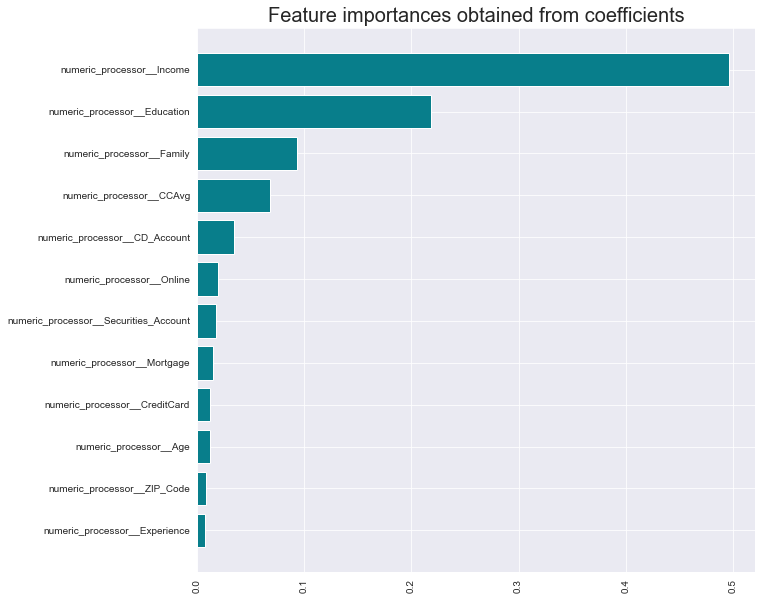

In [187]:
plt.figure(figsize = (10,10))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [188]:
X_train_balanced.nunique().sort_values(ascending=False)

numeric_processor__ZIP_Code              3650
numeric_processor__Income                3344
numeric_processor__CCAvg                 3250
numeric_processor__Experience            3042
numeric_processor__Age                   3014
numeric_processor__Education             1658
numeric_processor__Mortgage              1571
numeric_processor__Family                1504
numeric_processor__CreditCard             337
numeric_processor__Online                 305
numeric_processor__Securities_Account       2
numeric_processor__CD_Account               2
dtype: int64

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [189]:
train_df

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
0,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
1,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
2,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
3,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
4,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
3996,30,4,15,92037,4,0.4,1,85,0,0,0,1,0
3997,63,39,24,93023,2,0.3,3,0,0,0,0,0,0
3998,65,40,49,90034,3,0.5,2,0,0,0,0,1,0


In [190]:
train_df.corr()

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,target,Securities_Account,CD_Account,Online,CreditCard
Age,1.000000,0.994179,-0.060031,-0.037594,-0.043945,-0.049479,0.046310,-0.020047,-0.011998,0.001342,0.004676,0.017621,0.010904
Experience,0.994179,1.000000,-0.052020,-0.037683,-0.050063,-0.048794,0.018657,-0.016899,-0.011794,0.000980,0.006935,0.017309,0.012219
Income,-0.060031,-0.052020,1.000000,-0.023668,-0.152257,0.640941,-0.183046,0.205025,0.497046,0.003527,0.175481,0.027954,-0.010110
ZIP_Code,-0.037594,-0.037683,-0.023668,1.000000,0.006045,-0.008675,-0.005735,-0.003930,-0.006464,0.010338,0.018363,0.013263,0.010287
Family,-0.043945,-0.050063,-0.152257,0.006045,1.000000,-0.107106,0.080356,-0.029957,0.067835,0.008844,0.018451,0.020679,0.025819
CCAvg,-0.049479,-0.048794,0.640941,-0.008675,-0.107106,1.000000,-0.128061,0.104282,0.365972,0.011846,0.137530,0.006276,-0.017957
Education,0.046310,0.018657,-0.183046,-0.005735,0.080356,-0.128061,1.000000,-0.050301,0.141250,-0.012455,0.029760,-0.006865,0.002743
Mortgage,-0.020047,-0.016899,0.205025,-0.003930,-0.029957,0.104282,-0.050301,1.000000,0.138076,-0.021367,0.092315,0.022708,-0.009192
target,-0.011998,-0.011794,0.497046,-0.006464,0.067835,0.365972,0.141250,0.138076,1.000000,0.026211,0.334983,0.022575,-0.000700
Securities_Account,0.001342,0.000980,0.003527,0.010338,0.008844,0.011846,-0.012455,-0.021367,0.026211,1.000000,0.316662,0.020224,-0.011767


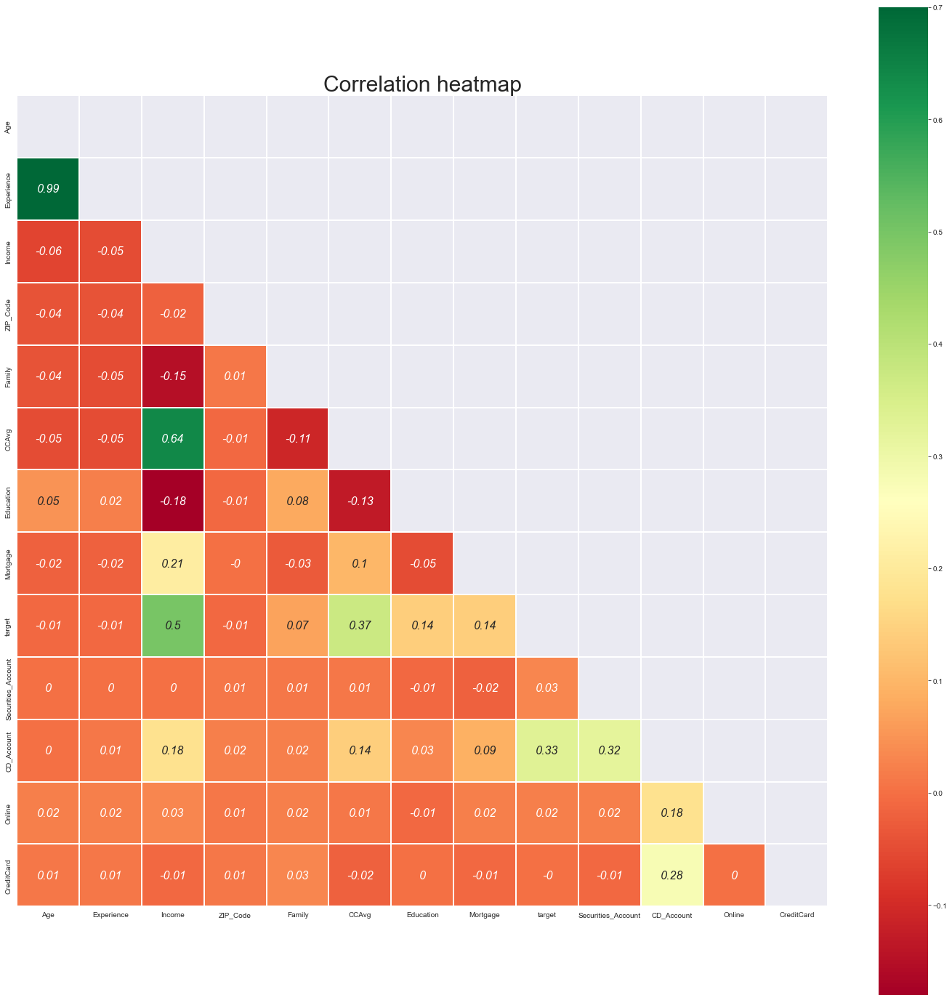

In [191]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [192]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [193]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

1
{'numeric_processor__Experience'}


In [194]:
# See there are 1 features with correlataion more than 0.8

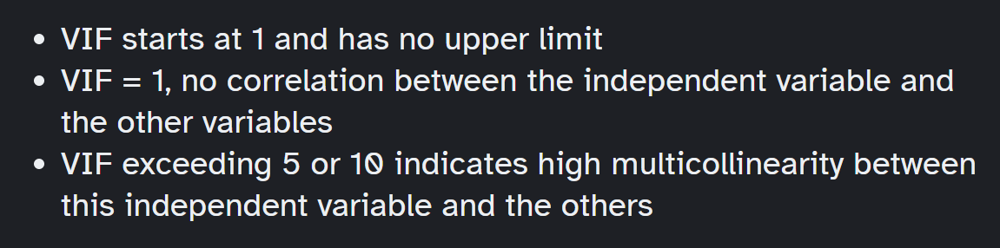

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [195]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
0,numeric_processor__Age,33.779633
1,numeric_processor__Experience,33.755154
9,numeric_processor__CD_Account,2.334158
2,numeric_processor__Income,1.985266
5,numeric_processor__CCAvg,1.747121
11,numeric_processor__CreditCard,1.746726
8,numeric_processor__Securities_Account,1.445520
10,numeric_processor__Online,1.375961
7,numeric_processor__Mortgage,1.263927
6,numeric_processor__Education,1.046854


In [196]:
VIF_features = ['numeric_processor__Age']

In [197]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.drop(VIF_features, axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.drop(VIF_features, axis = 1).values, i) for i in range(len(X_train_balanced.drop(VIF_features, axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

,feature,VIF
8,numeric_processor__CD_Account,2.332407
1,numeric_processor__Income,1.980589
10,numeric_processor__CreditCard,1.746672
4,numeric_processor__CCAvg,1.736799
7,numeric_processor__Securities_Account,1.444948
9,numeric_processor__Online,1.373354
6,numeric_processor__Mortgage,1.263871
5,numeric_processor__Education,1.020007
2,numeric_processor__ZIP_Code,1.015807
3,numeric_processor__Family,1.015025


In [198]:
vif_data.shape

(11, 2)

In [199]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.853194,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.078876,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.345356,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-1.166803,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [200]:
X_train_multi = X_train_balanced.drop(VIF_features, axis = 1)

In [201]:
X_val_multi = X_val_FE.drop(VIF_features, axis = 1)

In [202]:
X_test_multi = X_test_FE.drop(VIF_features, axis = 1)

In [203]:
X_train_multi

,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [204]:
X_val_multi

,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.631299,0.040353,-0.972000,0.103505,0.400689,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
1,0.456011,0.214652,-0.242250,0.103505,-0.380384,-0.514655,0.000000,0.000000,0.000000,0.0,1.0
2,0.344042,-0.016892,0.129071,0.000000,0.793764,0.485345,1.022770,0.000000,0.000000,-1.0,1.0
3,-0.245963,-0.016892,0.060545,0.103505,0.458421,-0.514655,1.037494,0.000000,10.398675,0.0,1.0
4,-0.848814,-1.218586,0.187184,0.959519,-0.867910,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
495,-0.292865,0.150988,-1.015152,0.959519,-0.059535,0.000000,0.000000,0.000000,0.000000,0.0,0.0
496,-0.956178,0.390439,0.093297,-0.896495,1.233016,-0.514655,0.000000,0.000000,0.000000,0.0,0.0
497,0.293079,1.099731,0.676873,0.000000,0.896728,0.485345,1.152831,0.000000,0.000000,-1.0,1.0
498,-0.434829,0.072323,-0.497693,0.103505,0.352344,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0


In [205]:
X_test_multi

,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,1.099731,-1.267499,-0.896495,0.484712,-0.514655,0.000000,0.000000,0.0,0.0,1.0
1,0.874498,-3.880702,0.243539,-0.896495,-1.344299,-0.514655,0.000000,0.000000,0.0,0.0,0.0
2,0.399905,1.110753,-1.015152,0.000000,-0.622259,-0.514655,1.305220,0.000000,0.0,0.0,0.0
3,-0.051909,-0.036615,0.141376,0.103505,0.634544,0.000000,0.000000,0.000000,0.0,-1.0,0.0
4,0.399905,-0.685114,-1.015152,0.959519,-1.344299,0.485345,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
495,-1.333123,-0.244890,-0.756670,0.959519,0.056432,-0.514655,0.000000,10.398675,0.0,-1.0,0.0
496,-0.616932,0.191352,-0.913823,0.959519,-1.344299,0.000000,0.000000,0.000000,0.0,0.0,0.0
497,1.362699,0.119570,-0.046540,0.103505,0.289739,0.485345,1.096774,10.398675,0.0,0.0,0.0
498,-1.202077,-0.288038,0.319665,0.000000,0.114956,0.000000,0.000000,0.000000,0.0,-1.0,1.0


In [206]:
model = XGBClassifier()
model.fit(X_train_multi,y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [207]:
model.feature_names_in_

array(['numeric_processor__Experience', 'numeric_processor__Income',
       'numeric_processor__ZIP_Code', 'numeric_processor__Family',
       'numeric_processor__CCAvg', 'numeric_processor__Education',
       'numeric_processor__Mortgage',
       'numeric_processor__Securities_Account',
       'numeric_processor__CD_Account', 'numeric_processor__Online',
       'numeric_processor__CreditCard'], dtype='<U37')

In [208]:
y_train_pred = model.predict(X_train_multi)
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3616
           1       1.00      1.00      1.00      3616

    accuracy                           1.00      7232
   macro avg       1.00      1.00      1.00      7232
weighted avg       1.00      1.00      1.00      7232



In [209]:
y_val_pred = model.predict(X_val_multi)
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       450
           1       0.91      0.98      0.94        50

    accuracy                           0.99       500
   macro avg       0.95      0.98      0.97       500
weighted avg       0.99      0.99      0.99       500



#### See even if we remove 1 features we are able to get the same results and there is no impact on the performance of the Model

### VarianceThreshold

In [210]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.853194,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.078876,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.345356,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-1.166803,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [211]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

VarianceThreshold()

In [212]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [213]:
variances

,Feature,variance
6,numeric_processor__Education,0.152326
11,numeric_processor__CreditCard,0.197405
10,numeric_processor__Online,0.226182
7,numeric_processor__Mortgage,0.265292
4,numeric_processor__Family,0.425087
3,numeric_processor__ZIP_Code,0.489033
1,numeric_processor__Experience,0.496566
0,numeric_processor__Age,0.524952
2,numeric_processor__Income,0.628723
5,numeric_processor__CCAvg,0.837112


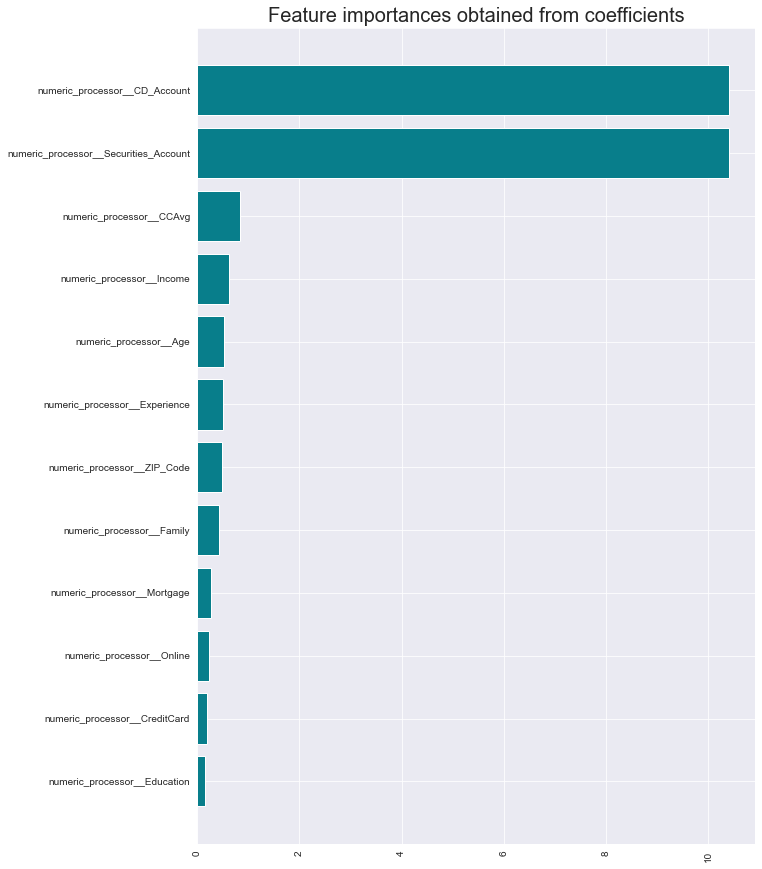

In [214]:
plt.figure(figsize = (10,15))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [215]:
variances['Feature'].values[-4:].tolist()

['numeric_processor__Income',
 'numeric_processor__CCAvg',
 'numeric_processor__Securities_Account',
 'numeric_processor__CD_Account']

In [216]:
X_train_balanced[variances['Feature'].values[-2:].tolist()]

,numeric_processor__Securities_Account,numeric_processor__CD_Account
0,10.398675,0.000000
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
...,...,...
7227,0.000000,0.000000
7228,0.000000,0.000000
7229,0.000000,10.398675
7230,10.398675,0.000000


In [217]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
7227    1
7228    1
7229    1
7230    1
7231    1
Name: target, Length: 7232, dtype: int64

In [218]:
model = XGBClassifier()
model.fit(X_train_balanced[variances['Feature'].values[-5:].tolist()],y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [219]:
model.feature_names_in_

array(['numeric_processor__Age', 'numeric_processor__Income',
       'numeric_processor__CCAvg',
       'numeric_processor__Securities_Account',
       'numeric_processor__CD_Account'], dtype='<U37')

In [220]:
y_train_pred = model.predict(X_train_balanced[variances['Feature'].values[-5:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3616
           1       0.99      1.00      1.00      3616

    accuracy                           1.00      7232
   macro avg       1.00      1.00      1.00      7232
weighted avg       1.00      1.00      1.00      7232



In [221]:
y_val_pred = model.predict(X_val_FE[variances['Feature'].values[-5:].tolist()])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       450
           1       0.70      0.76      0.73        50

    accuracy                           0.94       500
   macro avg       0.84      0.86      0.85       500
weighted avg       0.95      0.94      0.94       500



#### See with just 4 features having high variance we are able to get the 94 validation accurcy. using the technique VarianceThreshold

### Mutual Information for Classification

In [222]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

array([0.43005974, 0.43093719, 0.53333047, 0.3333028 , 0.18754844,
       0.50578809, 0.23156113, 0.09926196, 0.        , 0.07105153,
       0.03215553, 0.03497062])

In [223]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

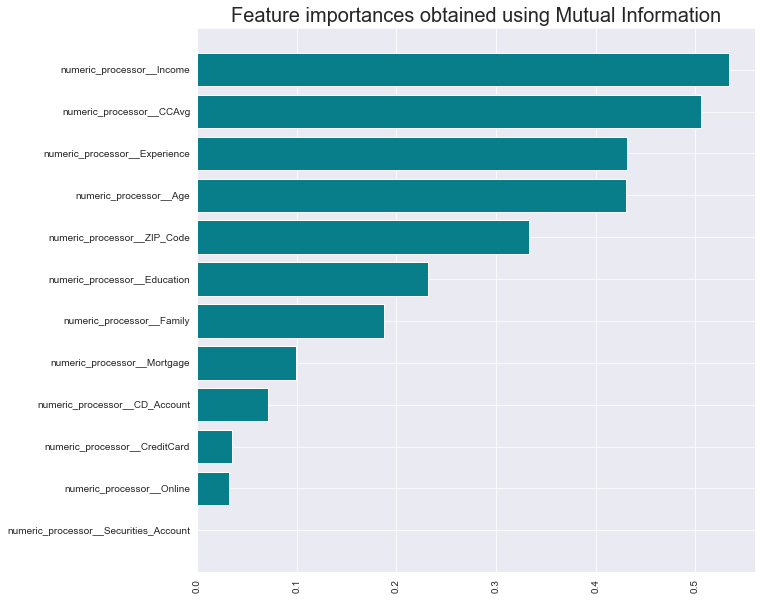

In [224]:
plt.figure(figsize = (10,10))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [225]:
mutual_info_df

,Feature,MI
8,numeric_processor__Securities_Account,0.000000
10,numeric_processor__Online,0.032156
11,numeric_processor__CreditCard,0.034971
9,numeric_processor__CD_Account,0.071052
7,numeric_processor__Mortgage,0.099262
4,numeric_processor__Family,0.187548
6,numeric_processor__Education,0.231561
3,numeric_processor__ZIP_Code,0.333303
0,numeric_processor__Age,0.430060
1,numeric_processor__Experience,0.430937


In [226]:
mutual_info_df['Feature'].values[-4:].tolist()

['numeric_processor__Age',
 'numeric_processor__Experience',
 'numeric_processor__CCAvg',
 'numeric_processor__Income']

In [227]:
model = XGBClassifier()
model.fit(X_train_balanced[mutual_info_df['Feature'].values[-5:].tolist()],y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [228]:
model.feature_names_in_

array(['numeric_processor__ZIP_Code', 'numeric_processor__Age',
       'numeric_processor__Experience', 'numeric_processor__CCAvg',
       'numeric_processor__Income'], dtype='<U29')

In [229]:
y_train_pred = model.predict(X_train_balanced[mutual_info_df['Feature'].values[-5:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3616
           1       1.00      1.00      1.00      3616

    accuracy                           1.00      7232
   macro avg       1.00      1.00      1.00      7232
weighted avg       1.00      1.00      1.00      7232



In [230]:
y_val_pred = model.predict(X_val_FE[mutual_info_df['Feature'].values[-5:].tolist()])
    
print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       450
           1       0.66      0.78      0.72        50

    accuracy                           0.94       500
   macro avg       0.82      0.87      0.84       500
weighted avg       0.94      0.94      0.94       500



#### See with just 4 features having high MI gain values, we are able to get the 94% validation accurcy. using the technique VarianceThreshold

## PCA

In [231]:
# we are not going to do PCA because we are having few features only.

## Building the final Model

In [232]:
X_train_balanced

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.000000,-0.051909,-0.597612,-1.177616,0.103505,0.000000,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0
1,-0.294458,-0.245963,-1.560330,0.611529,-0.896495,-0.246053,-0.514655,0.000000,0.000000,0.000000,-1.0,0.0
2,-0.503473,-0.551162,0.524345,0.191995,-0.896495,0.634544,0.000000,0.000000,0.000000,0.000000,-1.0,0.0
3,-0.503473,-0.616932,-0.288038,-0.657356,0.959519,-0.246053,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
4,-0.394819,-0.341048,-0.755943,-0.334475,0.959519,-0.723641,0.000000,1.062385,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7227,-0.853194,-0.824534,0.675293,-0.257149,0.959519,0.765390,0.485345,0.000000,0.000000,0.000000,0.0,0.0
7228,0.078876,0.113588,1.454251,-0.222857,-0.642650,1.554435,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
7229,-0.345356,-0.331509,0.929478,-0.205620,0.103505,0.913519,0.485345,0.000000,0.000000,10.398675,0.0,1.0
7230,-1.166803,-0.995432,0.595481,0.297731,-0.896495,0.782795,0.021436,0.000000,10.398675,0.000000,-1.0,0.0


In [233]:
y_train_balanced

0       0
1       0
2       0
3       0
4       0
       ..
7227    1
7228    1
7229    1
7230    1
7231    1
Name: target, Length: 7232, dtype: int64

In [234]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Age', 'Experience',
                                                   'Income', 'ZIP_Code',
                                                   'Family', 'CCAvg',
                                                   'Education', 'Mortgage',
                                                   'Securities_Account',
                                                   'CD_Account', 'Online',
                                                   'CreditCard']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', RobustScaler())])

In [235]:
model = XGBClassifier()

In [236]:
model.fit(X_train_balanced,y_train_balanced)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [237]:
X_val_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.696616,0.631299,0.040353,-0.972000,0.103505,0.400689,0.485345,0.000000,0.000000,0.000000,-1.0,0.0
1,0.496527,0.456011,0.214652,-0.242250,0.103505,-0.380384,-0.514655,0.000000,0.000000,0.000000,0.0,1.0
2,0.275865,0.344042,-0.016892,0.129071,0.000000,0.793764,0.485345,1.022770,0.000000,0.000000,-1.0,1.0
3,-0.294458,-0.245963,-0.016892,0.060545,0.103505,0.458421,-0.514655,1.037494,0.000000,10.398675,0.0,1.0
4,-0.784886,-0.848814,-1.218586,0.187184,0.959519,-0.867910,0.000000,0.000000,0.000000,0.000000,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.245972,-0.292865,0.150988,-1.015152,0.959519,-0.059535,0.000000,0.000000,0.000000,0.000000,0.0,0.0
496,-1.109494,-0.956178,0.390439,0.093297,-0.896495,1.233016,-0.514655,0.000000,0.000000,0.000000,0.0,0.0
497,0.330610,0.293079,1.099731,0.676873,0.000000,0.896728,0.485345,1.152831,0.000000,0.000000,-1.0,1.0
498,-0.394819,-0.434829,0.072323,-0.497693,0.103505,0.352344,-0.514655,0.000000,10.398675,0.000000,-1.0,0.0


In [238]:
y_val

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    1
498    0
499    0
Name: target, Length: 500, dtype: int64

In [239]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val_FE)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3616
           1       1.00      1.00      1.00      3616

    accuracy                           1.00      7232
   macro avg       1.00      1.00      1.00      7232
weighted avg       1.00      1.00      1.00      7232

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       450
           1       0.94      0.96      0.95        50

    accuracy                           0.99       500
   macro avg       0.97      0.98      0.97       500
weighted avg       0.99      0.99      0.99       500



In [240]:
X_test_FE

,numeric_processor__Age,numeric_processor__Experience,numeric_processor__Income,numeric_processor__ZIP_Code,numeric_processor__Family,numeric_processor__CCAvg,numeric_processor__Education,numeric_processor__Mortgage,numeric_processor__Securities_Account,numeric_processor__CD_Account,numeric_processor__Online,numeric_processor__CreditCard
0,0.047808,0.000000,1.099731,-1.267499,-0.896495,0.484712,-0.514655,0.000000,0.000000,0.0,0.0,1.0
1,0.871361,0.874498,-3.880702,0.243539,-0.896495,-1.344299,-0.514655,0.000000,0.000000,0.0,0.0,0.0
2,0.438486,0.399905,1.110753,-1.015152,0.000000,-0.622259,-0.514655,1.305220,0.000000,0.0,0.0,0.0
3,-0.045089,-0.051909,-0.036615,0.141376,0.103505,0.634544,0.000000,0.000000,0.000000,0.0,-1.0,0.0
4,0.384060,0.399905,-0.685114,-1.015152,0.959519,-1.344299,0.485345,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
495,-1.619564,-1.333123,-0.244890,-0.756670,0.959519,0.056432,-0.514655,0.000000,10.398675,0.0,-1.0,0.0
496,-0.706541,-0.616932,0.191352,-0.913823,0.959519,-1.344299,0.000000,0.000000,0.000000,0.0,0.0,0.0
497,1.215660,1.362699,0.119570,-0.046540,0.103505,0.289739,0.485345,1.096774,10.398675,0.0,0.0,0.0
498,-1.246382,-1.202077,-0.288038,0.319665,0.000000,0.114956,0.000000,0.000000,0.000000,0.0,-1.0,1.0


In [241]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    0
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [242]:
y_test_pred = model.predict(X_test_FE)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       454
           1       0.93      0.93      0.93        46

    accuracy                           0.99       500
   macro avg       0.96      0.96      0.96       500
weighted avg       0.99      0.99      0.99       500



#### We got 99% accuracy on test data with our final 'XGBClassifier' model

### Save Trained Model Using joblib

In [243]:
import joblib

In [244]:
joblib.dump(model, '../Models/bank_personal_loan_model')

['../Models/bank_personal_loan_model']

In [245]:
joblib.dump(final_pipe, '../Pipelines/bank_personal_loan_pipeline')

['../Pipelines/bank_personal_loan_pipeline']

### Load Saved Model

In [246]:
model = joblib.load('../Models/bank_personal_loan_model')

In [247]:
final_pipe = joblib.load('../Pipelines/bank_personal_loan_pipeline')

In [248]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['Age', 'Experience',
                                                   'Income', 'ZIP_Code',
                                                   'Family', 'CCAvg',
                                                   'Education', 'Mortgage',
                                                   'Securities_Account',
                                                   'CD_Account', 'Online',
                                                   'CreditCard']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  Index([], dtype='object'))])),
                ('scaler', RobustScaler())])

In [249]:
test = pd.DataFrame(columns=X_test.columns)
test.loc[0] = [63,37,191,94131,2,4.3,3,205,0,0,0,0]
test

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
0,63.0,37.0,191.0,94131.0,2.0,4.3,3.0,205.0,0.0,0.0,0.0,0.0


In [250]:
final_pipe.transform(test)

array([[ 1.21566032,  1.0935471 ,  1.68339918,  0.2288411 ,  0.        ,
         1.02879852,  0.48534519,  1.10935655,  0.        ,  0.        ,
        -1.        ,  0.        ]])

In [251]:
model.predict(final_pipe.transform(test))

array([1])

In [252]:
X_test.iloc[15:25]

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard
15,63,37,191,94131,2,4.3,3,205,0,0,0,0
16,60,35,18,92120,1,1.5,2,0,0,0,1,1
17,65,39,18,94923,2,0.4,1,0,1,1,1,1
18,36,12,65,95051,3,2.6,2,0,0,0,1,0
19,29,3,65,94132,4,1.8,2,244,0,0,0,0
20,42,18,153,93955,3,5.6,1,416,0,0,0,0
21,53,27,64,93407,4,2.6,1,0,0,0,1,1
22,35,11,90,94720,2,0.0,1,0,0,0,0,0
23,52,27,81,90024,4,3.8,2,0,0,0,0,1
24,33,7,51,94040,4,2.1,3,0,0,0,0,1


In [253]:
final_pipe.transform(X_test.iloc[15:25])

array([[ 1.21566032,  1.0935471 ,  1.68339918,  0.2288411 ,  0.        ,
         1.02879852,  0.48534519,  1.10935655,  0.        ,  0.        ,
        -1.        ,  0.        ],
       [ 0.87136103,  0.87449845, -1.21858637, -0.3478961 , -0.89649476,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  1.        ],
       [ 1.60050315,  1.36269869, -1.21858637,  0.68113213,  0.        ,
        -0.72364073, -0.51465481,  0.        , 10.39867517, 10.39867517,
         0.        ,  1.        ],
       [-0.44174812, -0.38764526,  0.04035332,  0.80451473,  0.10350524,
         0.57817877,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ],
       [-0.99146966, -1.07060052,  0.04035332,  0.23373015,  0.95951894,
         0.17990158,  0.        ,  1.14648753,  0.        ,  0.        ,
        -1.        ,  0.        ],
       [-0.14641663, -0.10318976,  1.04542118,  0.06054533,  0.10350524,
         1.25100124, -

In [254]:
model.predict(final_pipe.transform(X_test.iloc[15:25]))

array([1, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [255]:
y_test[15:25]

15    1
16    0
17    0
18    0
19    0
20    1
21    0
22    0
23    0
24    0
Name: target, dtype: int64

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [ ]:
X_train.columns

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

In [ ]:
final_pipe

X_train

y_train

X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

X_train_FE

y_train.value_counts()

X_test

y_test

X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

X_test_FE

models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Test_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_test_pred = model.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results

results.style.highlight_max(color = 'lightgreen', axis = 0)

results.sort_values(by='Test_Accuracy',ascending=False)

# writing results to a file

results.to_csv('results.csv',index=False)







## Handling Imbalanced dataset

X_train_FE

y_train

y_train.value_counts()

y_train.value_counts(normalize=True)

smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_res, y_res = smote.fit_resample(X_train_FE, y_train)

X_res

y_res

y_res.value_counts()

results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Test_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_res, y_res, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_res, y_res)
    y_train_pred = model.predict(X_res)
    train_score = accuracy_score(y_res,y_train_pred)
    
    precision = precision_score(y_res,y_train_pred,average='macro')
    recall = recall_score(y_res,y_train_pred,average='macro')
    f1 = f1_score(y_res,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_res,y_train_pred))
    
    y_test_pred = model.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results2

results2.style.highlight_max(color = 'lightgreen', axis = 0)

results2.sort_values(by='Test_Accuracy',ascending=False)

results2.sort_values(by='cv_results',ascending=False)

# writing results to a file

results2.to_csv('results2.csv',index=False)







## Hyperparameter Tuning

model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

model_params = {
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score',
                                            'Test_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_res, y_res)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_res)
    train_score = accuracy_score(y_res,y_train_pred)
    
    precision = precision_score(y_res,y_train_pred,average='macro')
    recall = recall_score(y_res,y_train_pred,average='macro')
    f1 = f1_score(y_res,y_train_pred,average='macro')
    print(classification_report(y_res,y_train_pred))

    y_test_pred = clf.predict(X_test_FE)
    test_score = accuracy_score(y_test,y_test_pred)
    
    print('train_score - ',train_score)
    print('test_score - ',test_score)
    
    results3 = results3.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Test_Accuracy':test_score}),ignore_index=True )

results3

results3.style.highlight_max(color = 'lightgreen', axis = 0)

results3.sort_values(by='Test_Accuracy',ascending=False)

results3.sort_values(by='cv_results',ascending=False)

# writing results to a file

results3.to_csv('results3.csv',index=False)











## Building the final Model

#### Condidering all the results 'GradientBoostingClassifier' gives us the overall best model

model = GradientBoostingClassifier(n_estimators=400,max_depth=8,learning_rate=0.01)

model.fit(X_res, y_res)

y_train_pred = model.predict(X_res)
train_score = accuracy_score(y_res,y_train_pred)
    
precision = precision_score(y_res,y_train_pred,average='macro')
recall = recall_score(y_res,y_train_pred,average='macro')
f1 = f1_score(y_res,y_train_pred,average='macro')
    
print(classification_report(y_res,y_train_pred))
    
y_test_pred = model.predict(X_test_FE)
test_score = accuracy_score(y_test,y_test_pred)
print("test accuracy : ",test_score)



### Save Trained Model Using joblib

import joblib

joblib.dump(model, 'model_GB')

### Load Saved Model

model = joblib.load('model_GB')

final_pipe

test = pd.DataFrame(columns=X_test.columns)
test.loc[0] = [1,1,'0',0,0,3814,1483,124,300,1,'Semiurban']
test

final_pipe.transform(test)

model.predict(final_pipe.transform(test))

X_test.head()

final_pipe.transform(X_test.head())

model.predict(final_pipe.transform(X_test.head()))

y_test[:5]







# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

X_train.columns

1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

### 1.Handling Missing values

### All the techniques of handling Missing values

### For Numerical Features
1. Mean, Median,Mode replacement
2. Random Sample Imputation
3. Capturing NAN values with a new feature
4. End of Distribution imputation
5. Arbitrary imputation

### For Categorical Features
6. Frequent categories imputation
7. If too many are missing, Impute with new category 'Missing'
8. Capturing NAN values with a new feature

In [ ]:
print(train_df[categorical_features].columns)
print(len(train_df[categorical_features].columns))

In [ ]:
print(train_df[numerical_features].columns)
print(len(train_df[numerical_features].columns))

In [ ]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

#### We dont have any null values in categorical_features (less work)

In [ ]:
df_num = train_df[numerical_features]

total = df_num.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_num.isnull().sum()/df_num.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
# Drop only if NaN in 'Engine' column you know the reason

train_df = train_df.dropna(subset = ['Engine'])

In [ ]:
df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
num_features_nan=[feature for feature in train_df.columns if train_df[feature].isnull().sum()>0 and train_df[feature].dtypes!='O']
print(num_features_nan)
print(len(num_features_nan))

In [ ]:
## Replacing the numerical Missing Values

for feature in num_features_nan:
    
    ## We will replace by using median since there are outliers
    median_value=train_df[feature].median()
    
    print(feature,train_df[feature].median())
    
    ## create a new feature to capture nan values
    train_df[feature+'_nan']=np.where(train_df[feature].isnull(),1,0)
    train_df[feature].fillna(median_value,inplace=True)
    
train_df[num_features_nan].isnull().sum()

In [ ]:
train_df.head(20)

### 2.Handling Rare Categorical Feature

We will remove categorical variables that are present less than 1% of the observations

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
# We want to perform this operation only on 'Model' because there are too many models. we gonna keep the brands as they are.

In [ ]:
temp=train_df.groupby('Model')['Price'].count()/len(train_df)
temp_df=temp[temp>0.01].index
print(temp_df)
train_df['Model']=np.where(train_df['Model'].isin(temp_df),train_df['Model'],'Rare_var')

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
for col in categorical_features:
    print(col,(train_df[col] == 'Rare_var').sum())

In [ ]:
train_df[categorical_features]

### 3.Handling Ouliers 

In [ ]:
continuous_features

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.boxplot(x=train_df[col])
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
discrete_features

In [ ]:
for col in discrete_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train_df[col])
    plt.show()

#### Its not always a good idea to remove outliers because we lose the training data and our model wont be robust (thumb rule always our model should be generalized) to the test data when there are outliers in train data..
#### The best way is to handle them
#### Ofcourse Linear Models will be sensitive to outliers like Linear Regression,L1,L2,Polynomial ,SVM regressors but the non-linear models like DT,ensemble models are not sensitive to the outliers

#### We gonna remove very few oulier data point based on some conditions because we gonna try Linear models initially 

#### Out of all continuous features 'Mileage' is the one close to Normal distribution. the rest are skewed(['Kilometers_Driven','Engine','Power','Price'])

In [ ]:
uppper_boundary=train_df['Mileage'].mean() + 3* train_df['Mileage'].std()
lower_boundary=train_df['Mileage'].mean() - 3* train_df['Mileage'].std()
print(lower_boundary), print(uppper_boundary),print(train_df['Mileage'].mean())

In [ ]:
train_df.loc[train_df['Mileage']>=30.8]

In [ ]:
train_df.loc[train_df['Mileage']>=30.8].shape

In [ ]:
# From above we can see that there 13 instances falling out of 3rd standard deviation. 
# And these 13 also not so deviated all are under 34 so we gonna leave those. 

In [ ]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

In [ ]:
continuous_features

In [ ]:
#### Lets compute the Interquantile range to calculate the boundaries

for col in ['Kilometers_Driven', 'Engine', 'Power']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*1.5)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*1.5)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df['Power'].median()

In [ ]:
#### Extreme outliers

for col in ['Kilometers_Driven', 'Engine', 'Power', 'Price']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*3)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*3)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=131551.75)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].sort_values(by=['Kilometers_Driven'],ascending=False)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5), 'Kilometers_Driven'] = 190103.5

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>190103.5)].shape

In [ ]:
train_df['Engine'].hist()

In [ ]:
train_df.loc[(train_df['Engine']>=3163.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].sort_values(by=['Engine'],ascending=False)

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0),'Engine'] = 4342.0

In [ ]:
train_df.loc[(train_df['Engine']>4342.0)].shape

In [ ]:
train_df.loc[(train_df['Power']>=229.75)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].sort_values(by=['Power'],ascending=False)

In [ ]:
train_df.loc[(train_df['Power']>=321.4),'Power'] = 321.4

In [ ]:
train_df.loc[(train_df['Power']>321.4)].shape

### 4.Feature transformation

#### Linear models assumes that the data is normally disrtibutes
#### The Goal of Feature transformation is to convert non-normal distributed features into normal distribution

In [ ]:
train_df[continuous_features].columns

In [ ]:
transform_features = ['Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Price']

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

In [ ]:
train_df

In [ ]:
def get_avg_skew(df,features):
    skew = []
    for col in features:
        skew.append(np.absolute(df[col].skew()))   
    return round(sum(skew)/len(skew), 2)

In [ ]:
get_avg_skew(train_df,transform_features)

In [ ]:
def plot_data(train_df,feature):
    plt.figure(figsize=(18,6))
    plt.subplot(1,2,1)
    train_df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(train_df[feature],dist='norm',plot=pylab)
    plt.show()

In [ ]:
#log transformation 
#log1p Calculates log(1 + x).

log_df = train_df.copy()
for col in transform_features:
    log_df[col]=np.log1p(log_df[col])
get_avg_skew(log_df,transform_features)

In [ ]:
#boxcox transformation

bc_df = train_df.copy()
for col in transform_features:
    bc_df[col],parameters=stat.boxcox(bc_df[col]+1)
get_avg_skew(bc_df,transform_features)

In [ ]:
#reciprocal transformation

rp_df = train_df.copy()
for col in transform_features:
    rp_df[col]=1/(rp_df[col]+1)
get_avg_skew(rp_df,transform_features)

In [ ]:
#square root transformation

sq_df = train_df.copy()
for col in transform_features:
    sq_df[col]=(sq_df[col]+1)**(1/2)
get_avg_skew(sq_df,transform_features)

In [ ]:
#exponential transformation

ex_df = train_df.copy()
for col in transform_features:
    ex_df[col]=(ex_df[col]+1)**(1/1.2)
get_avg_skew(ex_df,transform_features)

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plot_data(train_df,col)

In [ ]:
#From above boxcox seems giving the least avg skew of features.I am not sure is this a good practice to follow but it's working for now.

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(bc_df[col].skew(), 2))
    plot_data(bc_df,col)

In [ ]:
## seems boxcox is giving us the best transformation so will go with that
## boxcox only takes positive values and the +1 is to handle the zero's in the data

for col in transform_features:
    if col == 'Price':
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
        Price_Lambda = parameters
        print('Price Lambda : ',Price_Lambda)
    else:
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
    
train_df.head(20)

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

### 5.Categorical Feature Encoding

1. One Hot Encoding
2. Frequent labels one hot encoding (10 or 15)
3. Label encoding
4. count or frequency encoding
5. Target Guided Ordinal Encoding
6. Target Mean Encoding

In [ ]:
print(categorical_features)
print(len(categorical_features))

In [ ]:
print(discrete_features)
print(len(discrete_features))

In [ ]:
## we gonna leave all the discrete variables as they are becoz all are ordinal variables means if the value is more it has a more effect on target variable
## here take ['Car_Age', 'Seats'] if these variable values are more there is a definite positive effect on Price. there is exception for Seats becoz high price 
## cars have 2 seats but thats ok the info will be there in other features like brand

## any way in feature scaling they all come under on scale

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
train_df['Model'].value_counts().plot.bar()

In [ ]:
# We will not go with one hot encoding here becoz too many feature will get generated and its a curse of dimentionality

# i think its a good idea to go with Target Encoding becoz the individual categories will get the respective wieghts according to their predictive power
# initially i wanted to go with Mean encoding but it will become too spesific for train data rather Target encoding and model will overfit

### Target Guided Ordinal Encoding

In [ ]:
categorical_features

In [ ]:
for col in categorical_features:  
    ordinal_labels=train_df.groupby([col])['Price'].mean().sort_values().index
    ordinal_labels2={k:i for i,k in enumerate(ordinal_labels,1)}
    train_df[col]=train_df[col].map(ordinal_labels2)
train_df.head(20)

In [ ]:
train_df.shape

### 6.Feature scaling

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
features_to_scale = [feature for feature in train_df.columns if feature not in ['Price']]
print(features_to_scale)

In [ ]:
scaler=RobustScaler()
train_df_robust_scaler=pd.DataFrame(scaler.fit_transform(train_df[features_to_scale]),columns=train_df[features_to_scale].columns)

In [ ]:
train_df_robust_scaler.head(20)

In [ ]:
train_df_robust_scaler.shape

In [ ]:
train_df = pd.concat([pd.DataFrame(scaler.transform(train_df[features_to_scale]), columns=features_to_scale),
                     train_df[['Price']].reset_index(drop=True)],
                     axis=1)

In [ ]:
train_df.head(20)

### 7.Imbalanced dataset

In [ ]:
## Its the one main issue in classification problems where target classes are imbalanced
## ex: heart attack classification dataset contains 5000 records/observation
## but in that 372 are positive(there is a Heart attack) class and the rest 4628 are negative class(there is no heart attack)
## in that case the model will more likely to predict the test record as false class means model is baised towards the majority class


## when it comes to regressin problems like price prediction we dont have that problem becoz we are predicting continuous value not a class label
## but we need to make sure that the Target variable here the Price must be close to Normal distribution becoz linear models assumes variables are Normally distributed

In [ ]:
from scipy.special import boxcox, inv_boxcox

df['SalePrice'].to_numpy()

In [ ]:
#y = boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)
SalePrice_Lambda = -0.10000692036172426
inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)

In [ ]:
pd.DataFrame(inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda), columns = ['SalePrice'])

In [ ]:
train_df.head()

In [ ]:
train_df.shape

In [ ]:
X_train = train_df.iloc[ : , :-1]
y_train = train_df.iloc[ : ,-1]

In [ ]:
X_train.head()

In [ ]:
X_train.shape

In [ ]:
y_train

In [ ]:
y_train.shape